<>:224: SyntaxWarning: invalid escape sequence '\p'
<>:226: SyntaxWarning: invalid escape sequence '\e'
<>:224: SyntaxWarning: invalid escape sequence '\p'
<>:226: SyntaxWarning: invalid escape sequence '\e'
/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_94284/171967757.py:224: SyntaxWarning: invalid escape sequence '\p'
  plt.title(label = 'Quasienergy Spectrum, Anomalous, T = ${3 \pi}/{2}$ ' )
/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_94284/171967757.py:226: SyntaxWarning: invalid escape sequence '\e'
  plt.ylabel('quasienergy, $\epsilon$ (1/$\omega$)')


[[0.00225175 0.00070687 0.00439032 ... 0.00439032 0.00070687 0.00225175]
 [0.0594123  0.00067653 0.115846   ... 0.115846   0.00067653 0.0594123 ]
 [0.05996781 0.00252482 0.11684698 ... 0.11684698 0.00252482 0.05996781]
 ...
 [0.05996781 0.00252482 0.11684698 ... 0.11684698 0.00252482 0.05996781]
 [0.0594123  0.00067653 0.115846   ... 0.115846   0.00067653 0.0594123 ]
 [0.00225175 0.00070687 0.00439032 ... 0.00439032 0.00070687 0.00225175]]
[8.43703159e-16 3.11998321e-17 3.07643323e-16 8.88192150e-16
 6.77093355e-16 2.92801846e-16 4.38325794e-17 1.49131842e-16
 1.40209932e-15 1.94020270e-16 2.20938398e-16 1.55226607e-16
 1.94446988e-16 9.69366188e-17 1.26700061e-16 3.17038934e-16
 2.78133166e-16 2.03612488e-16 1.31613722e-16 1.28690091e-16
 1.22815911e-16 1.73096592e-16 5.52434125e-16 1.31743658e-14
 3.54313614e-15 1.20941284e-14 4.51968958e-14 1.23751088e-12
 3.31688366e-13 1.16723875e-12 4.35341546e-12 1.19376569e-10
 3.19865846e-11 1.12651933e-10 4.20422543e-10 1.15279365e-08
 3.0889

/opt/anaconda3/envs/myenv/lib/python3.12/site-packages/matplotlib/cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/opt/anaconda3/envs/myenv/lib/python3.12/site-packages/matplotlib/cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


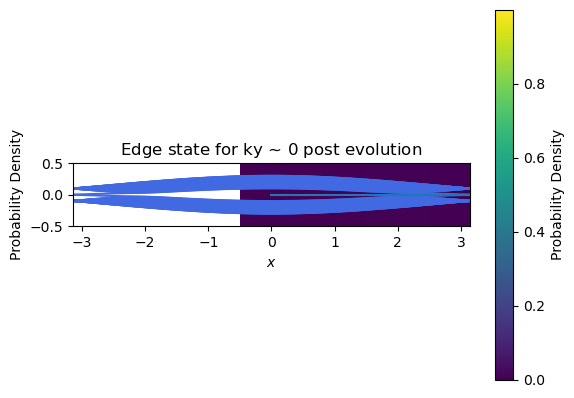

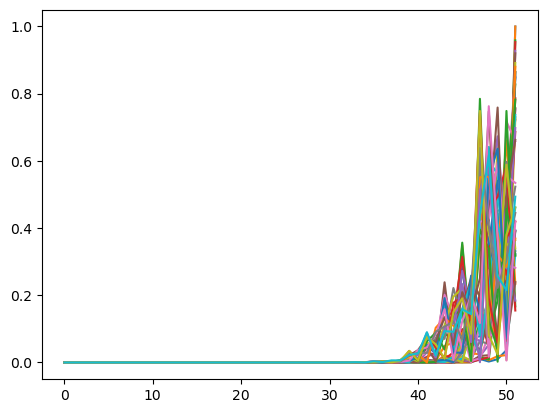

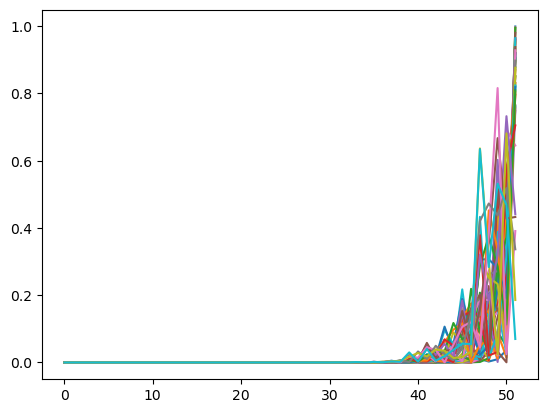

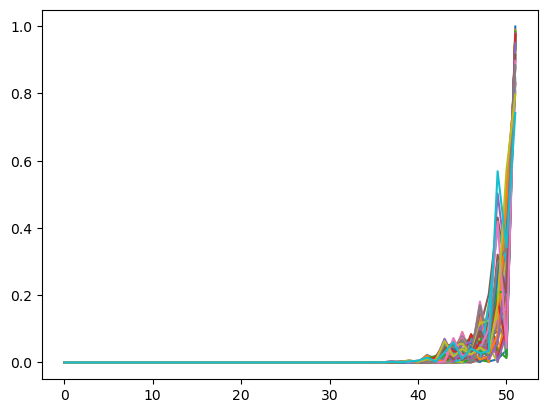

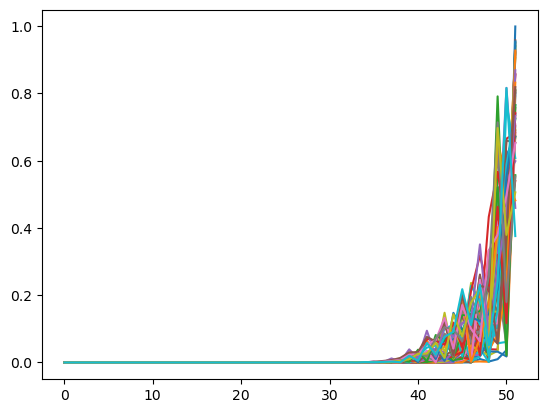

...

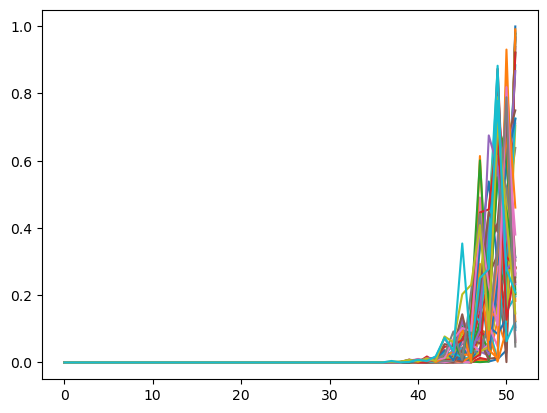

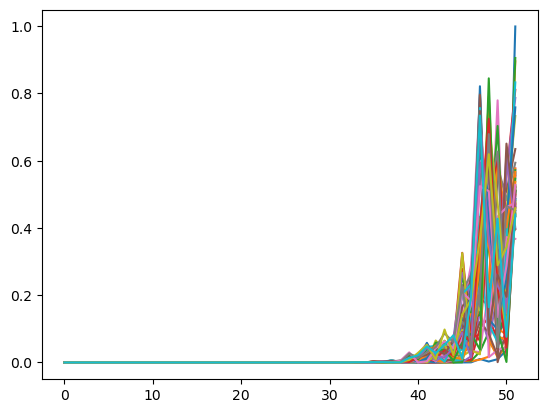

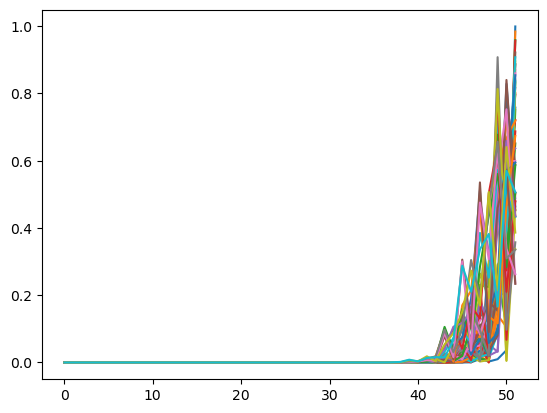

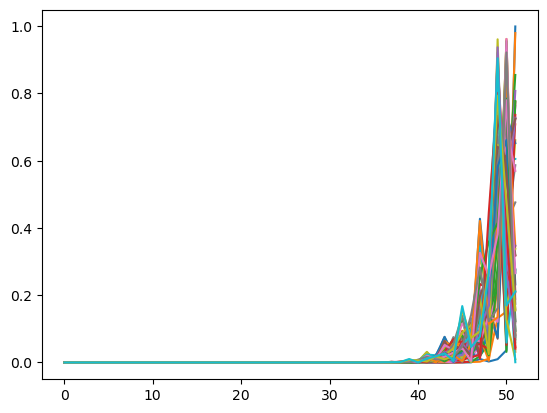

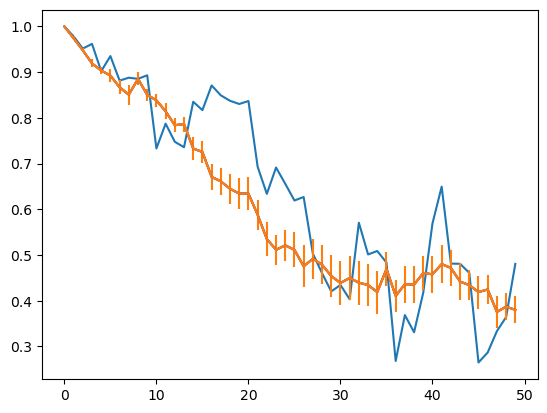

In [2]:
# %%
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# %%
def HA(n, Lx, ky):
    """  This function constructs the full Hamiltonian for all A bonds on the lattice
    
        HA1 = Bonds A: (4x+3, y+1) <--> (4x+4, y),  x' = 4x+3,   x = 4x + 4 
        HA2 = Bonds A: (4x+1, y) <--> (4x+2, y),  x' = 4x+1,   x = 4x + 2
        HA = HA1 + HA2"""
        
    #creates an array with all values of the lattice sites that construct the A bonds
    #in a range of lattice sites of 4*n
    
    A = np.arange(3, 4 * n, 4)  # 4x + 3
    B = np.arange(4, 4 * n + 1, 4)  # 4x + 4
    C = np.arange(1, 4 * n, 4)  # 4x + 1
    D = np.arange(2, 4 * n + 1, 4)  # 4x + 2


    HA1 = np.zeros((Lx, Lx), dtype=complex)
    HA2 = np.zeros((Lx, Lx), dtype=complex)

    HA1[A - 1, B - 1] = np.exp(1j * ky)
    HA1[B - 1, A - 1] = np.exp(-1j * ky)
    HA2[C - 1, D - 1] = 1
    HA2[D - 1, C - 1] = 1
    HA = HA1 + HA2
    return HA


def HB(n, Lx, ky):
    """  This function constructs the full Hamiltonian for all B bonds on the lattice
    
        HB1 = Bonds B: (4x+2, y+1) <--> (4x+1, y), x' = 4x + 2,   x = 4x + 1 
        HB2 = Bonds B: (4x+3, y) <--> (4x+4, y), x' = 4x + 3,   x = 4x + 4
        HB = HB1 + HB2 """

    #creates an array with all values of the lattice sites that construct the B bonds
    #in a range of lattice sites of 4*n
    
    A = np.arange(2, 4 * n, 4)  # 4x + 2
    B = np.arange(1, 4 * n, 4)  # 4x + 1
    C = np.arange(3, 4 * n, 4)  # 4x + 3
    D = np.arange(4, 4 * n + 1, 4)  # 4x + 4

    HB1 = np.zeros((Lx, Lx), dtype=complex)
    HB2 = np.zeros((Lx, Lx), dtype=complex)

    HB1[A - 1, B - 1] = np.exp(1j * ky)
    HB1[B - 1, A - 1] = np.exp(-1j * ky)
    HB2[C - 1, D - 1] = 1
    HB2[D - 1, C - 1] = 1

    HB = HB1 + HB2

    return HB


def HC(n, Lx):
    
    """ This function constructs the full Hamiltonian for all C bonds on the lattice
    
        HC1 = Bonds C: (4x, y) <--> (4x+1, y ), x' = 4x,   x = 4x + 1
        HC2 = Bonds C: (4x+2, y) <--> (4x+3, y), x' = 4x + 2,   x = 4x + 3
        HC = HC1 + HC2  """

    #creates an array with all values of the lattice sites that construct the C bonds
    #in a range of lattice sites of 4*n
    
    A = np.arange(4, 4 * n, 4)  # 4x
    B = np.arange(5, 4 * n + 1, 4)  # 4x + 1
    C = np.arange(2, 4 * n , 4)  # 4x + 2
    D = np.arange(3, 4 * n , 4)  # 4x + 3

    HC1 = np.zeros((Lx, Lx), dtype=complex)
    HC2 = np.zeros((Lx, Lx), dtype=complex)
  
    HC1[A - 1, B - 1] = 1
    HC1[B - 1, A - 1] = 1
    HC2[C - 1, D - 1] = 1
    HC2[D - 1, C - 1] = 1

    HC = (HC1 + HC2) 

    return HC

# %%
def floquet_operator(n, Lx, ky, t,noise):
    """ This function constructs the full Floquet operator for the lattice """
    
    HA1 = HA(n, Lx, ky)
    HB1 = HB(n, Lx, ky)
    HC1 = HC(n, Lx)
    
    #creates the full Floquet operator
    Floquet = np.exp(-1j*t*(1 + noise[0][0])*HA1/3)@np.exp(-1j*t*(1 + noise[0][1])*HB1/3)@np.exp(-1j*t*(1 + noise[0][2])*HC1/3)
    
    return Floquet

# %%
def U(n, Lx, T, ky,noise):
    
    """ This function defines the time-evolution function U(T) """
    
    H1 = - J * HA(n, Lx, ky) - Jprime * (HB(n, Lx, ky) + HC(n, Lx))
    H2 = - J * HB(n, Lx, ky) - Jprime * (HA(n, Lx, ky) + HC(n, Lx))
    H3 = - J * HC(n, Lx) - Jprime * (HA(n, Lx, ky) + HB(n, Lx, ky))

    (E1,V1)=np.linalg.eigh(H1)

    (E2,V2)=np.linalg.eigh(H2)

    (E3,V3)=np.linalg.eigh(H3)


    U_m = (V3 @ np.diag(np.exp(-1j*E3*(T*(1 + noise[0][0])/3))) @ V3.conj().T) @ (V2 @ np.diag(np.exp(-1j*E2*(T*(1 + noise[0][1])/3))) @ V2.conj().T) @ (V1 @ np.diag(np.exp(-1j*E1*(T*(1 + noise[0][2])/3))) @ V1.conj().T)
    #fix the loop such that the ky must be same.
    return U_m

# %%
def adjoint(psi):
    return psi.conjugate().transpose()
def psi_to_rho(psi):
    return numpy.outer(psi,psi.conjugate())
def exp_val(psi, op):
    return numpy.real(numpy.dot(adjoint(psi),op.dot(psi)))
def norm_sq(psi):
    return numpy.real(numpy.dot(adjoint(psi),psi))
def normalize(psi,tol=1e-9):
    ns=norm_sq(psi)**0.5
    if ns < tol:
        raise ValueError
    return psi/ns
def is_herm(M,tol=1e-9):
    if M.shape[0]!=M.shape[1]:
        return False
    diff=M-adjoint(M)
    return max(numpy.abs(diff.flatten())) < tol
def is_unitary(M,tol=1e-9):
    if M.shape[0]!=M.shape[1]:
        return False
    diff=M.dot(adjoint(M))-numpy.identity((M.shape[0]))
    return max(numpy.abs(diff.flatten())) < tol
def eigu(U,tol=1e-9):
    (E_1,V_1)=numpy.linalg.eigh(U+adjoint(U))
    U_1=adjoint(V_1).dot(U).dot(V_1)
    H_1=adjoint(V_1).dot(U+adjoint(U)).dot(V_1)
    non_diag_lst=[]
    j=0
    while j < U_1.shape[0]:
        k=0
        while k < U_1.shape[0]:
            if j!=k and abs(U_1[j,k]) > tol:
                if j not in non_diag_lst:
                    non_diag_lst.append(j)
                if k not in non_diag_lst:
                    non_diag_lst.append(k)
            k+=1
        j+=1
    if len(non_diag_lst) > 0:
        non_diag_lst=numpy.sort(numpy.array(non_diag_lst))
        U_1_cut=U_1[non_diag_lst,:][:,non_diag_lst]
        (E_2_cut,V_2_cut)=numpy.linalg.eigh(1.j*(U_1_cut-adjoint(U_1_cut)))
        V_2=numpy.identity((U.shape[0]),dtype=V_2_cut.dtype)
        for j in range(len(non_diag_lst)):
            V_2[non_diag_lst[j],non_diag_lst]=V_2_cut[j,:]
        V_1=V_1.dot(V_2)
        U_1=adjoint(V_2).dot(U_1).dot(V_2)
    # Sort by phase
    U_1=numpy.diag(U_1)
    inds=numpy.argsort(numpy.imag(numpy.log(U_1)))
    return (U_1[inds],V_1[:,inds]) # = (U_d,V) s.t. U=V*U_d*V^\dagger

# %%
n =13   # Number of unit lattices 
Lx = 4*n        # Number of lattice sites along the x direction
Ly = 52        # Number of lattice sites along the y direction   
J = 1       # Hopping coefficient 
Jprime =0.10      # Number of lattice sites along the y direction
T_A  = 3*np.pi/6 
WNoiseinit = 0.0
W = WNoiseinit
omegaA = (2*np.pi)/T_A 

# %%
#---------------------------- Calculating and Graphing the Quasienergy Spectrum---------------------------------#

# Momentum space to calculate the quasienergy for the anomalous and haldane 
ky_list = np.linspace(-np.pi, np.pi, 100)

# Lists which will hold the values for the anomalous phase during the loop
quasienergies_listA  = [] 
eigenfunctions_listA= []

# Lists which will hold the values for the Haldane phase during the loop
quasienergies_listH  = [] 
eigenfunctions_listH= []
random = np.random.uniform(-W,W,(1,3))
# Calculates the quasienergy for period T with values ky 
for ky in ky_list:
    # Anomalous 
    lamdaA, V = eigu(U(n,Lx,T_A,ky,random))# within some ky pass the same noise realisation.
    quasienergies_listA.append(-np.log(lamdaA)*(-1j/T_A))
    eigenfunctions_listA.append(V)
    

# Anomalous
quasienergiesA = np.asanyarray(quasienergies_listA)
eigenfunctionsA = np.asanyarray(eigenfunctions_listA)


#-------------------------------------------- Time Evolution to Visualize Particle Edge Motion ------------------------------------------#

# %%
# Plots the graph quasienergy vs ky at total period T for the anomalous phase
plt.figure()
plt.plot(ky_list,quasienergiesA/omegaA,  color = 'royalblue')
plt.title(label = 'Quasienergy Spectrum, Anomalous, T = ${3 \pi}/{2}$ ' )
plt.xlabel('$k_y$')
plt.ylabel('quasienergy, $\epsilon$ (1/$\omega$)')
plt.ylim(-0.5,0.5)
plt.xlim(-np.pi,np.pi)

# %%
plt.imshow(np.abs(eigenfunctionsA[99]))
plt.colorbar(label='Probability Density')
print(np.abs(eigenfunctionsA[99]))
print(np.abs(np.transpose(eigenfunctionsA[99])[:][26]))

# %%
#plt.imshow(np.abs(eigenfunctionsA[99]))
init_wave = np.transpose(eigenfunctionsA[99])[:][26]
plt.plot(np.arange(52),np.abs(np.transpose(eigenfunctionsA[99])[:][26]), label = 'ky = 0')
plt.title(label = 'Edge state for ky ~ ${0}$ post evolution ' )
plt.xlabel('$x$')
plt.ylabel('Probability Density')
plt.show()

# %%
n =13   # Number of unit lattices 
Lx = 4*n        # Number of lattice sites along the x direction
Ly = 52
J = 1       # Hopping coefficient 
Jprime =0.10        # Hopping coefficent 
m = 50      # Multiples of T

W = 0.5  # In kHz units.
np.save("source_bias.npy", W)  # Noise strength
# Variables for anomalous 
T_A  = 3*np.pi/6         # Driving period 
t_A = np.arange(0 ,m*T_A, T_A)      # Mutlples of driving period for 
omegaA = (2*np.pi)/T_A 
# %%
def propagate(W):
    ky_list = np.linspace(-np.pi, np.pi, 100)
    GA = np.zeros((len(t_A), Lx, Lx), dtype = complex)
    ky = 3
    for step in range(0, len(t_A)):
        random = np.random.uniform(-W,W,(1,3))
        if step == 0:
            GA[step,:,:] = U(n, Lx, T_A, ky_list[99],random)
        else:
            GA[step,:,:] = U(n, Lx,  (t_A[step] - t_A[step-1]), ky_list[99],random) @ GA[step - 1,:,:]
    return GA


# %%


# %%
def time_evolv(initial_wave):
    GA = propagate(W)
    final_waves = []
    for step in range(0, len(t_A)):
        if step == 0:
            final_waves.append(initial_wave)
        else:
            final_waves.append(GA[step,:,:]@initial_wave)
    return final_waves

# %%
final= []
for i in range(10):
    final.append(time_evolv(init_wave))
#finale = time_evolv(init_wave)
for j in range(10):
    for i in range(0,len(t_A)):
        plt.plot(np.arange(52),np.abs(final[j][i]), label = 'ky = 0')
    plt.show()

# %%
def lochsgmidt_echo(final_vector,initial_vecotr):
    final_vecto = final_vector/((np.linalg.norm(final_vector)))
    initial_vecot = initial_vecotr/((np.linalg.norm(initial_vecotr)))
    rate = np.conjugate(final_vecto)@initial_vecot## Take a conjugate transpose
    return np.abs(rate)
# %%
W_0_21 = []
for i in range(0,len(t_A)):
    finale = final[0]
    W_0_21.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_22 = []
for i in range(0,len(t_A)):
    finale = final[1]
    W_0_22.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_23 = []
for i in range(0,len(t_A)):
    finale = final[2]
    W_0_23.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_24 = []
for i in range(0,len(t_A)):
    finale = final[3]
    W_0_24.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_25 = []
for i in range(0,len(t_A)):
    finale = final[4]
    W_0_25.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_26 = []
for i in range(0,len(t_A)):
    finale = final[5]
    W_0_26.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_27 = []
for i in range(0,len(t_A)):
    finale = final[6]
    W_0_27.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_28 = []
for i in range(0,len(t_A)):
    finale = final[7]
    W_0_28.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_29 = []
for i in range(0,len(t_A)):
    finale = final[8]
    W_0_29.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_210 = []
for i in range(0,len(t_A)):
    finale = final[9]
    W_0_210.append(lochsgmidt_echo(finale[i], init_wave))

# %%
arrays = np.array([W_0_210, W_0_29, W_0_28, W_0_27,W_0_26, W_0_25, W_0_24, W_0_23, W_0_22, W_0_21])

# %%
plt.plot(np.arange(len(t_A)),W_0_29)

# %%
average = np.mean(arrays,axis = 0)

# %%
err_bar = (np.std(arrays,axis = 0))
err_bar = err_bar/np.sqrt(len(err_bar))

# %%
plt.errorbar(np.arange(len(t_A)),average, yerr = err_bar)
plt.savefig("LE_Ana.png", dpi=600)

# %%
np.savetxt("LE_Hal_00_small.txt",average)
np.savetxt("LE_Hal_00_small_err.txt", err_bar)

# %%


# %%
plt.plot(np.arange(len(t_A)),average)

# %%
plt.plot(np.arange(len(t_A)),average)

# %%
plt.plot(np.arange(len(t_A)),average)

# %%




<>:221: SyntaxWarning: invalid escape sequence '\p'
<>:223: SyntaxWarning: invalid escape sequence '\e'
<>:221: SyntaxWarning: invalid escape sequence '\p'
<>:223: SyntaxWarning: invalid escape sequence '\e'
/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_94284/600218149.py:221: SyntaxWarning: invalid escape sequence '\p'
  plt.title(label = 'Quasienergy Spectrum, Anomalous, T = ${3 \pi}/{2}$ ' )
/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_94284/600218149.py:223: SyntaxWarning: invalid escape sequence '\e'
  plt.ylabel('quasienergy, $\epsilon$ (1/$\omega$)')


[[0.00506738 0.00582539 0.00976421 ... 0.00976421 0.00582539 0.00506738]
 [0.06247336 0.00595208 0.12114369 ... 0.12114369 0.00595208 0.06247336]
 [0.06247336 0.00595208 0.12114369 ... 0.12114369 0.00595208 0.06247336]
 ...
 [0.06247336 0.00595208 0.12114369 ... 0.12114369 0.00595208 0.06247336]
 [0.06247336 0.00595208 0.12114369 ... 0.12114369 0.00595208 0.06247336]
 [0.00506738 0.00582539 0.00976421 ... 0.00976421 0.00582539 0.00506738]]
[9.93342598e-01 5.28978932e-02 5.28978932e-02 6.17522336e-02
 6.17522336e-02 3.17747024e-03 3.17747024e-03 3.67912086e-03
 3.67912086e-03 1.89323119e-04 1.89323119e-04 2.19219842e-04
 2.19219842e-04 1.12807852e-05 1.12807852e-05 1.30621745e-05
 1.30621745e-05 6.72163541e-07 6.72163541e-07 7.78307299e-07
 7.78307299e-07 4.00507427e-08 4.00507427e-08 4.63752993e-08
 4.63752993e-08 2.38641627e-09 2.38641627e-09 2.76326378e-09
 2.76326377e-09 1.42194210e-10 1.42194214e-10 1.64648543e-10
 1.64648539e-10 8.47261922e-12 8.47262041e-12 9.81049454e-12
 9.8104

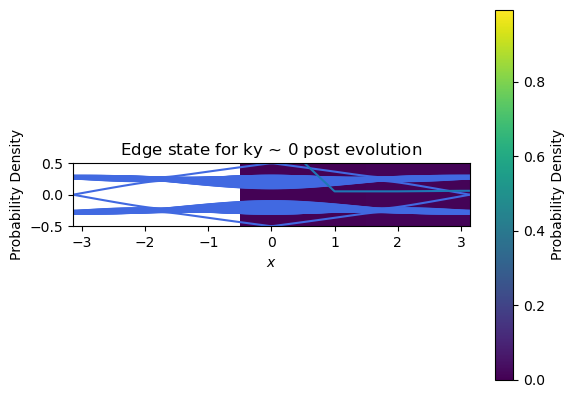

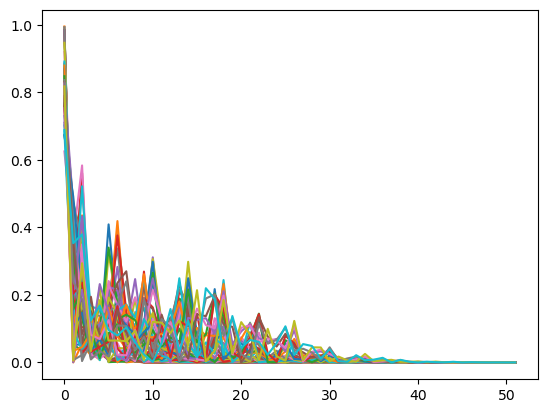

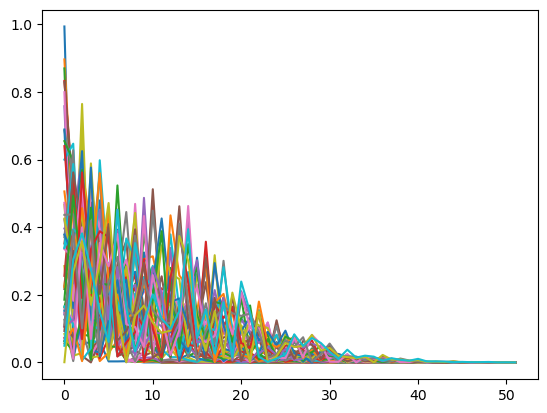

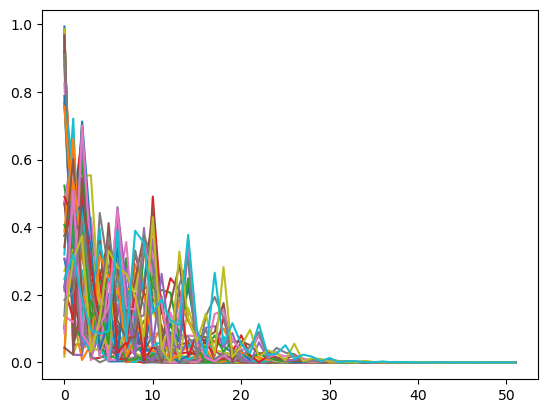

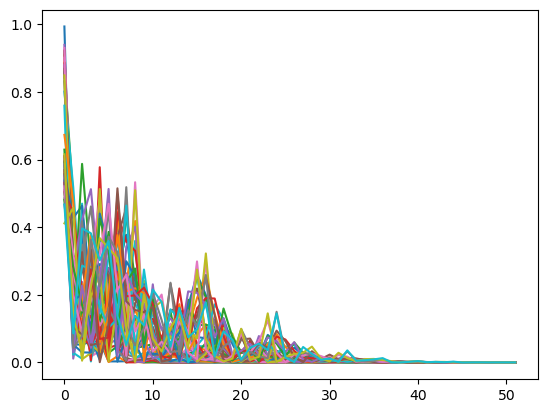

...

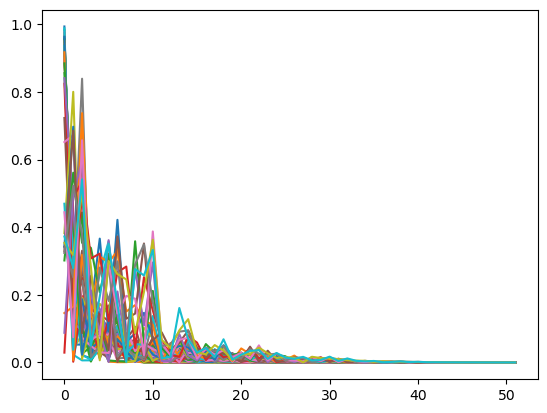

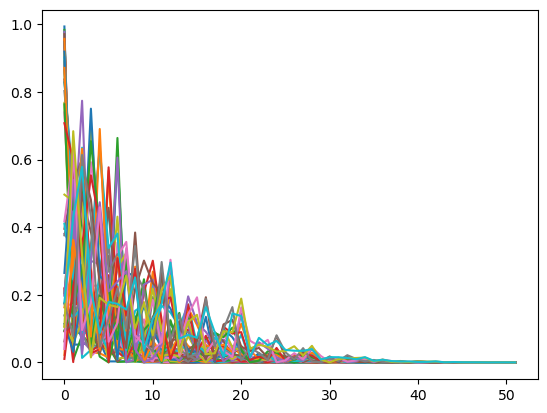

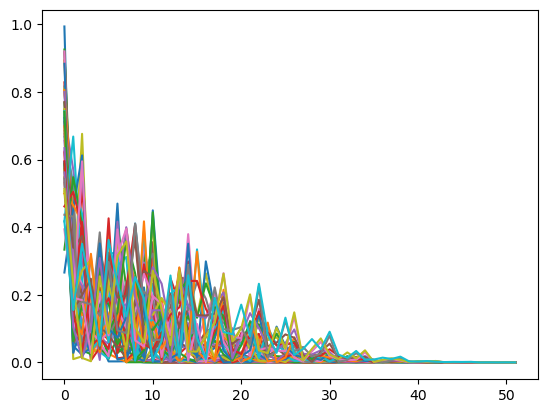

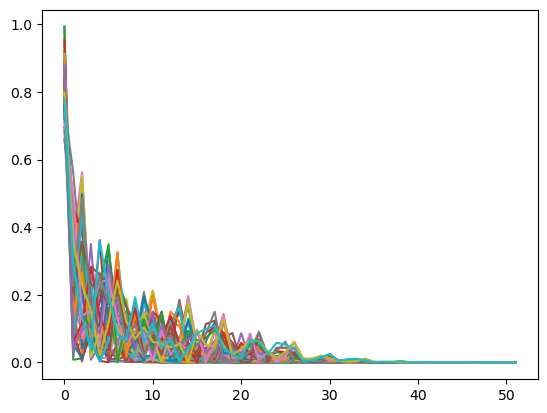

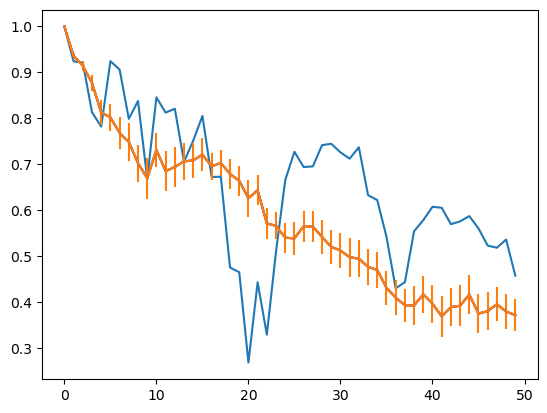

In [3]:
# %%
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# %%
def HA(n, Lx, ky):
    """  This function constructs the full Hamiltonian for all A bonds on the lattice
    
        HA1 = Bonds A: (4x+3, y+1) <--> (4x+4, y),  x' = 4x+3,   x = 4x + 4 
        HA2 = Bonds A: (4x+1, y) <--> (4x+2, y),  x' = 4x+1,   x = 4x + 2
        HA = HA1 + HA2"""
        
    #creates an array with all values of the lattice sites that construct the A bonds
    #in a range of lattice sites of 4*n
    
    A = np.arange(3, 4 * n, 4)  # 4x + 3
    B = np.arange(4, 4 * n + 1, 4)  # 4x + 4
    C = np.arange(1, 4 * n, 4)  # 4x + 1
    D = np.arange(2, 4 * n + 1, 4)  # 4x + 2


    HA1 = np.zeros((Lx, Lx), dtype=complex)
    HA2 = np.zeros((Lx, Lx), dtype=complex)

    HA1[A - 1, B - 1] = np.exp(1j * ky)
    HA1[B - 1, A - 1] = np.exp(-1j * ky)
    HA2[C - 1, D - 1] = 1
    HA2[D - 1, C - 1] = 1
    HA = HA1 + HA2
    return HA


def HB(n, Lx, ky):
    """  This function constructs the full Hamiltonian for all B bonds on the lattice
    
        HB1 = Bonds B: (4x+2, y+1) <--> (4x+1, y), x' = 4x + 2,   x = 4x + 1 
        HB2 = Bonds B: (4x+3, y) <--> (4x+4, y), x' = 4x + 3,   x = 4x + 4
        HB = HB1 + HB2 """

    #creates an array with all values of the lattice sites that construct the B bonds
    #in a range of lattice sites of 4*n
    
    A = np.arange(2, 4 * n, 4)  # 4x + 2
    B = np.arange(1, 4 * n, 4)  # 4x + 1
    C = np.arange(3, 4 * n, 4)  # 4x + 3
    D = np.arange(4, 4 * n + 1, 4)  # 4x + 4

    HB1 = np.zeros((Lx, Lx), dtype=complex)
    HB2 = np.zeros((Lx, Lx), dtype=complex)

    HB1[A - 1, B - 1] = np.exp(1j * ky)
    HB1[B - 1, A - 1] = np.exp(-1j * ky)
    HB2[C - 1, D - 1] = 1
    HB2[D - 1, C - 1] = 1

    HB = HB1 + HB2

    return HB


def HC(n, Lx):
    
    """ This function constructs the full Hamiltonian for all C bonds on the lattice
    
        HC1 = Bonds C: (4x, y) <--> (4x+1, y ), x' = 4x,   x = 4x + 1
        HC2 = Bonds C: (4x+2, y) <--> (4x+3, y), x' = 4x + 2,   x = 4x + 3
        HC = HC1 + HC2  """

    #creates an array with all values of the lattice sites that construct the C bonds
    #in a range of lattice sites of 4*n
    
    A = np.arange(4, 4 * n, 4)  # 4x
    B = np.arange(5, 4 * n + 1, 4)  # 4x + 1
    C = np.arange(2, 4 * n , 4)  # 4x + 2
    D = np.arange(3, 4 * n , 4)  # 4x + 3

    HC1 = np.zeros((Lx, Lx), dtype=complex)
    HC2 = np.zeros((Lx, Lx), dtype=complex)
  
    HC1[A - 1, B - 1] = 1
    HC1[B - 1, A - 1] = 1
    HC2[C - 1, D - 1] = 1
    HC2[D - 1, C - 1] = 1

    HC = (HC1 + HC2) 

    return HC

# %%
def floquet_operator(n, Lx, ky, t,noise):
    """ This function constructs the full Floquet operator for the lattice """
    
    HA1 = HA(n, Lx, ky)
    HB1 = HB(n, Lx, ky)
    HC1 = HC(n, Lx)
    
    #creates the full Floquet operator
    Floquet = np.exp(-1j*t*(1 + noise[0][0])*HA1/3)@np.exp(-1j*t*(1 + noise[0][1])*HB1/3)@np.exp(-1j*t*(1 + noise[0][2])*HC1/3)
    
    return Floquet

# %%
def U(n, Lx, T, ky,noise):
    
    """ This function defines the time-evolution function U(T) """
    
    H1 = - J * HA(n, Lx, ky) - Jprime * (HB(n, Lx, ky) + HC(n, Lx))
    H2 = - J * HB(n, Lx, ky) - Jprime * (HA(n, Lx, ky) + HC(n, Lx))
    H3 = - J * HC(n, Lx) - Jprime * (HA(n, Lx, ky) + HB(n, Lx, ky))

    (E1,V1)=np.linalg.eigh(H1)

    (E2,V2)=np.linalg.eigh(H2)

    (E3,V3)=np.linalg.eigh(H3)


    U_m = (V3 @ np.diag(np.exp(-1j*E3*(T*(1 + noise[0][0])/3))) @ V3.conj().T) @ (V2 @ np.diag(np.exp(-1j*E2*(T*(1 + noise[0][1])/3))) @ V2.conj().T) @ (V1 @ np.diag(np.exp(-1j*E1*(T*(1 + noise[0][2])/3))) @ V1.conj().T)
    #fix the loop such that the ky must be same.
    return U_m

# %%
def adjoint(psi):
    return psi.conjugate().transpose()
def psi_to_rho(psi):
    return numpy.outer(psi,psi.conjugate())
def exp_val(psi, op):
    return numpy.real(numpy.dot(adjoint(psi),op.dot(psi)))
def norm_sq(psi):
    return numpy.real(numpy.dot(adjoint(psi),psi))
def normalize(psi,tol=1e-9):
    ns=norm_sq(psi)**0.5
    if ns < tol:
        raise ValueError
    return psi/ns
def is_herm(M,tol=1e-9):
    if M.shape[0]!=M.shape[1]:
        return False
    diff=M-adjoint(M)
    return max(numpy.abs(diff.flatten())) < tol
def is_unitary(M,tol=1e-9):
    if M.shape[0]!=M.shape[1]:
        return False
    diff=M.dot(adjoint(M))-numpy.identity((M.shape[0]))
    return max(numpy.abs(diff.flatten())) < tol
def eigu(U,tol=1e-9):
    (E_1,V_1)=numpy.linalg.eigh(U+adjoint(U))
    U_1=adjoint(V_1).dot(U).dot(V_1)
    H_1=adjoint(V_1).dot(U+adjoint(U)).dot(V_1)
    non_diag_lst=[]
    j=0
    while j < U_1.shape[0]:
        k=0
        while k < U_1.shape[0]:
            if j!=k and abs(U_1[j,k]) > tol:
                if j not in non_diag_lst:
                    non_diag_lst.append(j)
                if k not in non_diag_lst:
                    non_diag_lst.append(k)
            k+=1
        j+=1
    if len(non_diag_lst) > 0:
        non_diag_lst=numpy.sort(numpy.array(non_diag_lst))
        U_1_cut=U_1[non_diag_lst,:][:,non_diag_lst]
        (E_2_cut,V_2_cut)=numpy.linalg.eigh(1.j*(U_1_cut-adjoint(U_1_cut)))
        V_2=numpy.identity((U.shape[0]),dtype=V_2_cut.dtype)
        for j in range(len(non_diag_lst)):
            V_2[non_diag_lst[j],non_diag_lst]=V_2_cut[j,:]
        V_1=V_1.dot(V_2)
        U_1=adjoint(V_2).dot(U_1).dot(V_2)
    # Sort by phase
    U_1=numpy.diag(U_1)
    inds=numpy.argsort(numpy.imag(numpy.log(U_1)))
    return (U_1[inds],V_1[:,inds]) # = (U_d,V) s.t. U=V*U_d*V^\dagger

# %%
n =13   # Number of unit lattices 
Lx = 4*n        # Number of lattice sites along the x direction
Ly = 52        # Number of lattice sites along the y direction   
J = 1       # Hopping coefficient 
Jprime =0.10      # Number of lattice sites along the y direction
T_A  = 3*np.pi/2 
W = 0.0
omegaA = (2*np.pi)/T_A 

# %%
#---------------------------- Calculating and Graphing the Quasienergy Spectrum---------------------------------#

# Momentum space to calculate the quasienergy for the anomalous and haldane 
ky_list = np.linspace(-np.pi, np.pi, 100)

# Lists which will hold the values for the anomalous phase during the loop
quasienergies_listA  = [] 
eigenfunctions_listA= []

# Lists which will hold the values for the Haldane phase during the loop
quasienergies_listH  = [] 
eigenfunctions_listH= []
random = np.random.uniform(-W,W,(1,3))
# Calculates the quasienergy for period T with values ky 
for ky in ky_list:
    # Anomalous 
    lamdaA, V = eigu(U(n,Lx,T_A,ky,random))# within some ky pass the same noise realisation.
    quasienergies_listA.append(-np.log(lamdaA)*(-1j/T_A))
    eigenfunctions_listA.append(V)
    

# Anomalous
quasienergiesA = np.asanyarray(quasienergies_listA)
eigenfunctionsA = np.asanyarray(eigenfunctions_listA)


#-------------------------------------------- Time Evolution to Visualize Particle Edge Motion ------------------------------------------#

# %%
# Plots the graph quasienergy vs ky at total period T for the anomalous phase
plt.figure()
plt.plot(ky_list,quasienergiesA/omegaA,  color = 'royalblue')
plt.title(label = 'Quasienergy Spectrum, Anomalous, T = ${3 \pi}/{2}$ ' )
plt.xlabel('$k_y$')
plt.ylabel('quasienergy, $\epsilon$ (1/$\omega$)')
plt.ylim(-0.5,0.5)
plt.xlim(-np.pi,np.pi)

# %%
plt.imshow(np.abs(eigenfunctionsA[99]))
plt.colorbar(label='Probability Density')
print(np.abs(eigenfunctionsA[99]))
print(np.abs(np.transpose(eigenfunctionsA[99])[:][26]))

# %%
#plt.imshow(np.abs(eigenfunctionsA[99]))
init_wave = np.transpose(eigenfunctionsA[99])[:][26]
plt.plot(np.arange(52),np.abs(np.transpose(eigenfunctionsA[99])[:][26]), label = 'ky = 0')
plt.title(label = 'Edge state for ky ~ ${0}$ post evolution ' )
plt.xlabel('$x$')
plt.ylabel('Probability Density')
plt.show()

# %%
n =13   # Number of unit lattices 
Lx = 4*n        # Number of lattice sites along the x direction
Ly = 52
J = 1       # Hopping coefficient 
Jprime =0.10        # Hopping coefficent 
m = 50      # Multiples of T
W = 0.2   # Noise strength
# Variables for anomalous 
T_A  = 3*np.pi/2         # Driving period 
t_A = np.arange(0 ,m*T_A, T_A)      # Mutlples of driving period for 
omegaA = (2*np.pi)/T_A 

# %%
def propagate(W):
    ky_list = np.linspace(-np.pi, np.pi, 100)
    GA = np.zeros((len(t_A), Lx, Lx), dtype = complex)
    ky = 3
    for step in range(0, len(t_A)):
        random = np.random.uniform(-W,W,(1,3))
        if step == 0:
            GA[step,:,:] = U(n, Lx, T_A, ky_list[99],random)
        else:
            GA[step,:,:] = U(n, Lx,  (t_A[step] - t_A[step-1]), ky_list[99],random) @ GA[step - 1,:,:]
    return GA


# %%


# %%
def time_evolv(initial_wave):
    GA = propagate(W)
    final_waves = []
    for step in range(0, len(t_A)):
        if step == 0:
            final_waves.append(initial_wave)
        else:
            final_waves.append(GA[step,:,:]@initial_wave)
    return final_waves

# %%
final= []
for i in range(10):
    final.append(time_evolv(init_wave))
#finale = time_evolv(init_wave)
for j in range(10):
    for i in range(0,len(t_A)):
        plt.plot(np.arange(52),np.abs(final[j][i]), label = 'ky = 0')
    plt.show()

# %%
def lochsgmidt_echo(final_vector,initial_vecotr):
    final_vecto = final_vector/((np.linalg.norm(final_vector)))
    initial_vecot = initial_vecotr/((np.linalg.norm(initial_vecotr)))
    rate = np.conjugate(final_vecto)@initial_vecot## Take a conjugate transpose
    return np.abs(rate)

# %%
W_0_21 = []
for i in range(0,len(t_A)):
    finale = final[0]
    W_0_21.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_22 = []
for i in range(0,len(t_A)):
    finale = final[1]
    W_0_22.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_23 = []
for i in range(0,len(t_A)):
    finale = final[2]
    W_0_23.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_24 = []
for i in range(0,len(t_A)):
    finale = final[3]
    W_0_24.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_25 = []
for i in range(0,len(t_A)):
    finale = final[4]
    W_0_25.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_26 = []
for i in range(0,len(t_A)):
    finale = final[5]
    W_0_26.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_27 = []
for i in range(0,len(t_A)):
    finale = final[6]
    W_0_27.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_28 = []
for i in range(0,len(t_A)):
    finale = final[7]
    W_0_28.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_29 = []
for i in range(0,len(t_A)):
    finale = final[8]
    W_0_29.append(lochsgmidt_echo(finale[i], init_wave))

# %%
W_0_210 = []
for i in range(0,len(t_A)):
    finale = final[9]
    W_0_210.append(lochsgmidt_echo(finale[i], init_wave))

# %%
arrays = np.array([W_0_210, W_0_29, W_0_28, W_0_27,W_0_26, W_0_25, W_0_24, W_0_23, W_0_22, W_0_21])

# %%
plt.plot(np.arange(len(t_A)),W_0_29)

# %%
average = np.mean(arrays,axis = 0)

# %%
err_bar = (np.std(arrays,axis = 0))
err_bar = err_bar/np.sqrt(len(err_bar))

# %%
plt.errorbar(np.arange(len(t_A)),average, yerr = err_bar)

# %%
np.savetxt("LE_Ana_10.txt",average)
np.savetxt("LE_Ana_10_err.txt", err_bar)

# %%


# %%
plt.plot(np.arange(len(t_A)),average)

# %%
plt.plot(np.arange(len(t_A)),average)

# %%
plt.plot(np.arange(len(t_A)),average)

# %%





In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Downloads/run2/b0')

#
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .npy files
    npy_files = [file for file in files if file.startswith('LE_Ana_00_large') and file.endswith('.txt')]

    # Load and plot each .npy file
    for npy_file in npy_files:
        file_path = os.path.join(root, npy_file)
        data = np.load(file_path)
        
        plt.figure()
        plt.plot(data)
        plt.title(f'Plot of {npy_file}')
        plt.xlabel('Index')
        plt.ylabel('Value')
        plt.show()

ValueError: Cannot load file containing pickled data when allow_pickle=False

In [275]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_long_time_01')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_01_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Ana_01_edit_small.txt'])


dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b65_large', 'b66_large', 'b67_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b79_large', 'b80_large', 'b81_large', 'b82_large

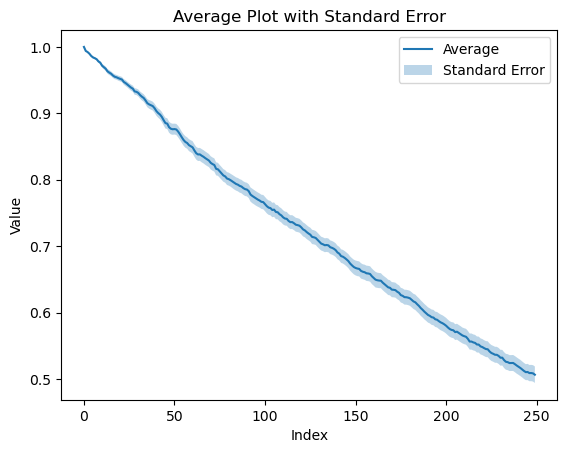

In [276]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_01_edit_small.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array2 = np.mean(plot_data, axis=0)
standard_error2 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.plot(np.arange(len(average)), average, label='Average')
plt.fill_between(np.arange(len(average)), array2 - standard_error2, array2 + standard_error2, alpha=0.3, label='Standard Error')
plt.title('Average Plot with Standard Error')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()


In [277]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/ANA_750_time_01')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_01_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Ana_01_edit_750.txt'])


dict_keys(['b17_large', 'b19_large', 'b20_large', 'b23_large', 'b26_large', 'b36_large', 'b39_large', 'b43_large', 'b46_large', 'b47_large', 'b49_large', 'b51_large', 'b56_large', 'b60_large', 'b62_large', 'b65_large', 'b67_large', 'b68_large', 'b69_large', 'b72_large', 'b79_large', 'b83_large', 'b85_large', 'b86_large', 'b90_large', 'b91_large'])


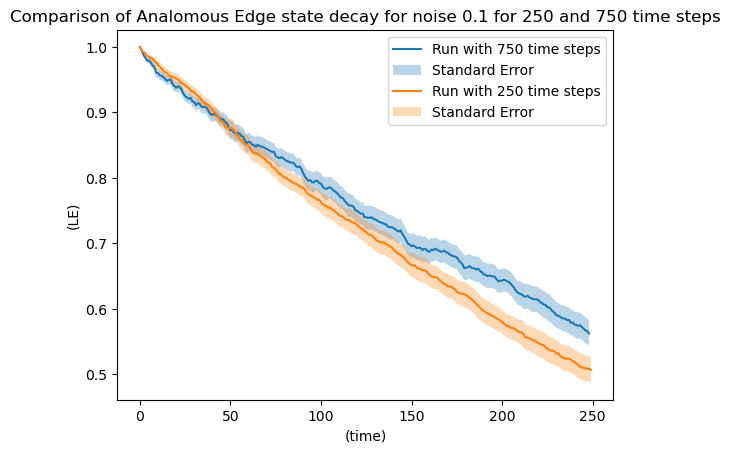

In [278]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_01_edit_750.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array2 = np.mean(plot_data, axis=0)
standard_error = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.plot(np.arange(len(array2))[:249], array2[:249], label='Run with 750 time steps')
plt.fill_between(np.arange(len(array2))[:249], array2[:249] - standard_error[:249], array2[:249] + standard_error[:249], alpha=0.3, label='Standard Error')
plt.plot(np.arange(len(average)), average, label='Run with 250 time steps')
plt.fill_between(np.arange(len(average)), average - standard_error[:250], average + standard_error[:250], alpha=0.3, label='Standard Error')
plt.title('Comparison of Analomous Edge state decay for noise 0.1 for 250 and 750 time steps')
plt.xlabel('(time)')
plt.ylabel('(LE)')
plt.legend()
plt.show()


dict_keys(['LE_Hal_01_edit_small.txt'])
dict_keys(['b0_large', 'b3_large', 'b4_large', 'b5_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b15_large', 'b16_large', 'b17_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b30_large', 'b31_large', 'b32_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b56_large', 'b57_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b80_large', 'b81_large', 'b82_large', 'b84_large', 'b85_large', 'b86_large', 'b90_large', 'b93_la

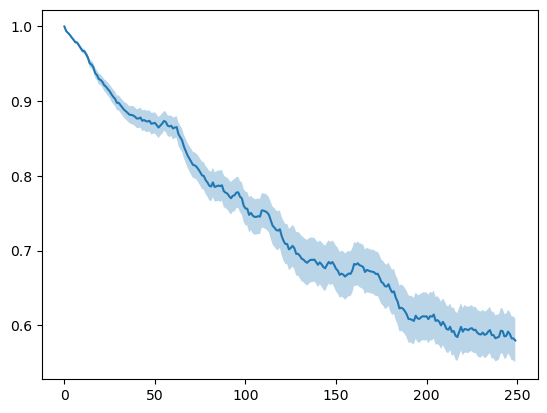

In [279]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_long_time_01')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_01_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_01_edit_small.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array1 = np.mean(plot_data, axis=0)
standard_error1 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])
plt.plot(np.arange(250), array1, label='Analomous')
plt.fill_between(np.arange(len(array1)), array1 - standard_error1, array1 + standard_error1, alpha=0.3, label='Standard Error')

In [280]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_01')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_01_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Hal_01_edit_750.txt'])


dict_keys(['b1_large', 'b4_large', 'b5_large', 'b6_large', 'b9_large', 'b10_large', 'b11_large', 'b14_large', 'b16_large', 'b18_large', 'b19_large', 'b21_large', 'b22_large', 'b23_large', 'b25_large', 'b27_large', 'b28_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b35_large', 'b37_large', 'b38_large', 'b41_large', 'b43_large', 'b44_large', 'b46_large', 'b47_large', 'b51_large', 'b53_large', 'b54_large', 'b57_large', 'b59_large', 'b61_large', 'b62_large', 'b63_large', 'b66_large', 'b67_large', 'b68_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b80_large', 'b81_large', 'b83_large', 'b85_large', 'b86_large', 'b88_large', 'b89_large', 'b90_large', 'b92_large', 'b95_large'])


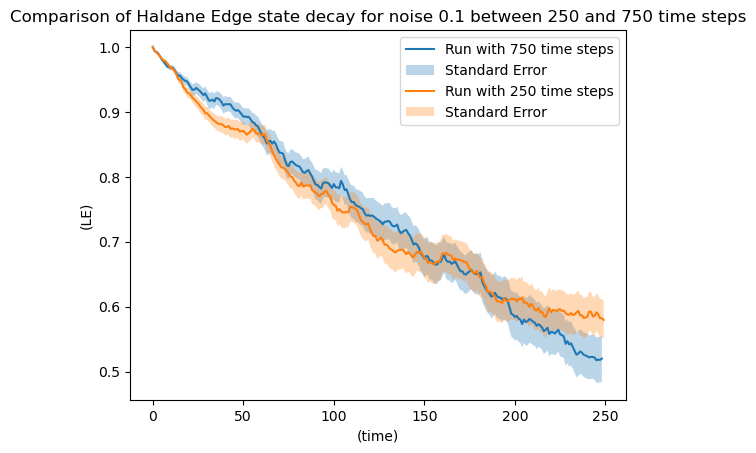

In [281]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_01_edit_750.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array3 = np.mean(plot_data, axis=0)
standard_error3 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

plt.figure()
plt.plot(np.arange(len(array3))[:249], array3[:249], label='Run with 750 time steps')
plt.fill_between(np.arange(249), array3[:249] - standard_error3[:249], array3[:249] + standard_error3[:249], alpha=0.3, label='Standard Error')
plt.plot(np.arange(250), array1, label='Run with 250 time steps')
plt.fill_between(np.arange(len(array1)), array1 - standard_error1, array1 + standard_error1, alpha=0.3, label='Standard Error')
plt.title('Comparison of Haldane Edge state decay for noise 0.1 between 250 and 750 time steps')
plt.xlabel('(time)')
plt.ylabel('(LE)')
plt.legend()
plt.show()

In [282]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_long_time_01')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_01_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Hal_01_edit_small.txt'])


dict_keys(['b0_large', 'b3_large', 'b4_large', 'b5_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b15_large', 'b16_large', 'b17_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b30_large', 'b31_large', 'b32_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b56_large', 'b57_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b80_large', 'b81_large', 'b82_large', 'b84_large', 'b85_large', 'b86_large', 'b90_large', 'b93_large', 'b95_large'])


ValueError: operands could not be broadcast together with shapes (250,) (750,) 

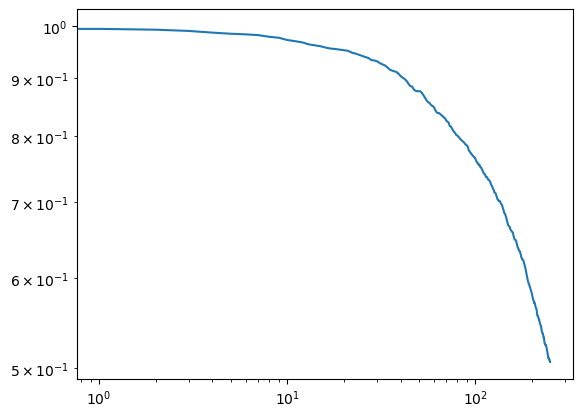

In [283]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_01_edit_small.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array1 = np.mean(plot_data, axis=0)
standard_error1 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error on a log-log scale
plt.figure()
plt.loglog(np.arange(len(average)), average, label='Analomous')
plt.fill_between(np.arange(len(average)), array2 - standard_error, array2 + standard_error, alpha=0.3, label='Standard Error')
plt.loglog(np.arange(len(array1)), array1, label='Haldane')
plt.fill_between(np.arange(len(array1)), array1 - standard_error1, array1 + standard_error1, alpha=0.3, label='Standard Error')
plt.title('Comparison of Haldane and Analomous Edge state decay for noise 0.1')
plt.xlabel('Log(time)')
plt.ylabel('Log(LE)')
plt.legend()
plt.show()


In [284]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Downloads/Hal_long_time_005')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_005_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Hal_005_edit_small.txt'])


dict_keys(['b0_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b11_large', 'b12_large', 'b14_large', 'b17_large', 'b19_large', 'b20_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b79_large', 'b81_large', 'b82_large', 'b83_large', 'b84_large', 'b85_large', 'b87_large', 'b89_large', 'b90_large', 'b91_large', 'b92_large

ValueError: operands could not be broadcast together with shapes (250,) (750,) 

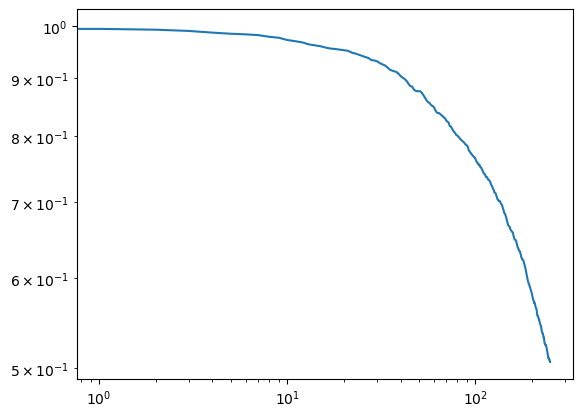

In [285]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_005_edit_small.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array1 = np.mean(plot_data, axis=0)
standard_error1 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error on a log-log scale
plt.figure()
plt.loglog(np.arange(len(average)), average, label='Analomous')
plt.fill_between(np.arange(len(average)), array2 - standard_error, array2 + standard_error, alpha=0.3, label='Standard Error')
plt.loglog(np.arange(len(array1)), array1, label='Haldane')
plt.fill_between(np.arange(len(array1)), array1 - standard_error1, array1 + standard_error1, alpha=0.3, label='Standard Error')
plt.title('Comparison of Haldane and Analomous Edge state decay for noise 0.1')
plt.xlabel('Log(time)')
plt.ylabel('Log(LE)')
plt.legend()
plt.show()


In [307]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_01')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_01_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Hal_01_edit_750.txt'])


dict_keys(['b1_large', 'b4_large', 'b5_large', 'b6_large', 'b9_large', 'b10_large', 'b11_large', 'b14_large', 'b16_large', 'b18_large', 'b19_large', 'b21_large', 'b22_large', 'b23_large', 'b25_large', 'b27_large', 'b28_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b35_large', 'b37_large', 'b38_large', 'b41_large', 'b43_large', 'b44_large', 'b46_large', 'b47_large', 'b51_large', 'b53_large', 'b54_large', 'b57_large', 'b59_large', 'b61_large', 'b62_large', 'b63_large', 'b66_large', 'b67_large', 'b68_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b80_large', 'b81_large', 'b83_large', 'b85_large', 'b86_large', 'b88_large', 'b89_large', 'b90_large', 'b92_large', 'b95_large'])


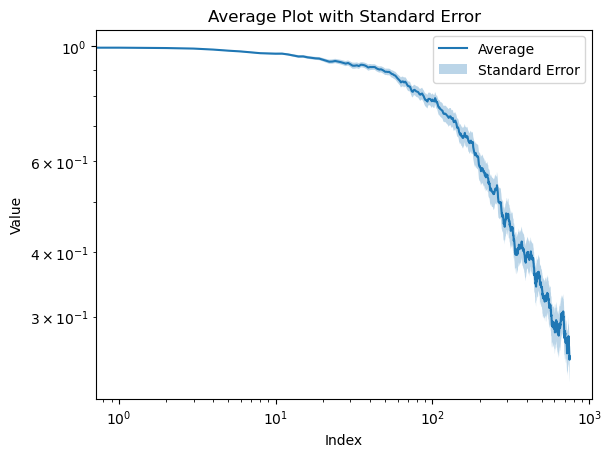

In [308]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_01_edit_750.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array3 = np.mean(plot_data, axis=0)
standard_error = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.loglog(np.arange(len(array3)), array3, label='Average')
plt.fill_between(np.arange(len(array2)), array3 - standard_error, array3 + standard_error, alpha=0.3, label='Standard Error')
plt.title('Average Plot with Standard Error')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()


In [309]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/scratch/ANA_long_time')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Ana_02_edit_small.txt'])


dict_keys(['b2_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b13_large', 'b16_large', 'b20_large', 'b21_large', 'b24_large', 'b27_large', 'b28_large', 'b29_large', 'b35_large', 'b38_large', 'b40_large', 'b41_large', 'b43_large', 'b44_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b53_large', 'b56_large', 'b60_large', 'b61_large', 'b62_large', 'b65_large', 'b66_large', 'b67_large', 'b69_large', 'b70_large', 'b73_large', 'b75_large', 'b76_large', 'b78_large', 'b79_large', 'b83_large', 'b84_large', 'b85_large', 'b87_large', 'b89_large', 'b91_large', 'b92_large', 'b93_large', 'b95_large'])


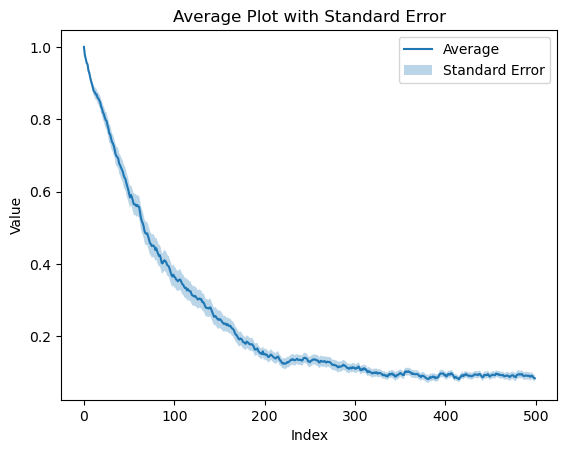

In [310]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_small.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array2 = np.mean(plot_data, axis=0)
standard_error = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.plot(np.arange(len(array2)), array2, label='Average')
plt.fill_between(np.arange(len(array2)), array2 - standard_error, array2 + standard_error, alpha=0.3, label='Standard Error')
plt.title('Average Plot with Standard Error')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()


In [311]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/ANA_750_time_01')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_01_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Ana_01_edit_750.txt'])


dict_keys(['b17_large', 'b19_large', 'b20_large', 'b23_large', 'b26_large', 'b36_large', 'b39_large', 'b43_large', 'b46_large', 'b47_large', 'b49_large', 'b51_large', 'b56_large', 'b60_large', 'b62_large', 'b65_large', 'b67_large', 'b68_large', 'b69_large', 'b72_large', 'b79_large', 'b83_large', 'b85_large', 'b86_large', 'b90_large', 'b91_large'])


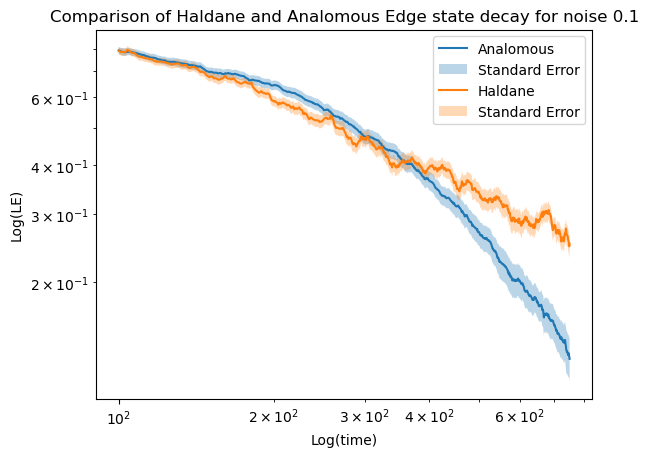

In [312]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_01_edit_750.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array2 = np.mean(plot_data, axis=0)
standard_error = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.loglog(np.arange(len(array2))[100:], array2[100:], label='Analomous')
plt.fill_between(np.arange(len(array2))[100:], array2[100:] - standard_error[100:], array2[100:] + standard_error[100:], alpha=0.3, label='Standard Error')
plt.loglog(np.arange(len(array3))[100:], array3[100:], label='Haldane')
plt.fill_between(np.arange(len(array3))[100:], array3[100:] - standard_error[100:], array3[100:] + standard_error[100:], alpha=0.3, label='Standard Error')
plt.title('Comparison of Haldane and Analomous Edge state decay for noise 0.1')
plt.xlabel('Log(time)')
plt.ylabel('Log(LE)')
plt.legend()
plt.show()


In [342]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/ANA_750_time_02')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Ana_02_edit_750.txt'])


dict_keys(['b20_large', 'b23_large', 'b24_large', 'b27_large', 'b29_large', 'b33_large', 'b34_large', 'b39_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b51_large', 'b52_large', 'b58_large', 'b66_large', 'b68_large', 'b74_large', 'b78_large', 'b79_large', 'b80_large', 'b85_large', 'b88_large', 'b93_large', 'b94_large'])


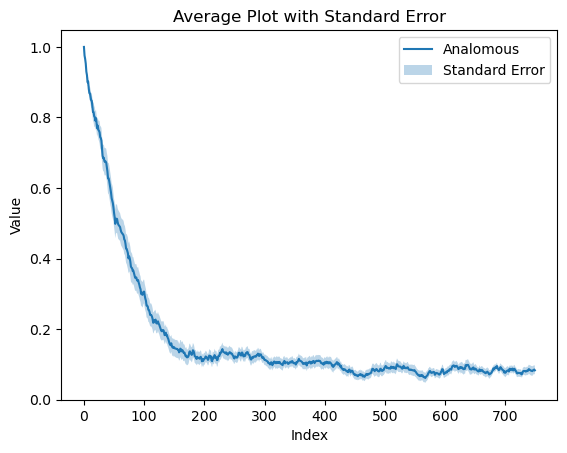

In [343]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.plot(np.arange(len(array4)), array4, label='Analomous')
plt.fill_between(np.arange(len(array4)), array4 - standard_error4, array4 + standard_error4, alpha=0.3, label='Standard Error')
plt.title('Average Plot with Standard Error')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()


In [332]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_02')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Hal_02_edit_750.txt'])


dict_keys(['b20_large', 'b21_large', 'b37_large', 'b42_large', 'b44_large', 'b45_large', 'b47_large', 'b50_large', 'b52_large', 'b53_large', 'b55_large', 'b60_large', 'b61_large', 'b67_large', 'b69_large', 'b71_large', 'b75_large', 'b77_large', 'b84_large', 'b87_large', 'b88_large', 'b93_large', 'b94_large'])


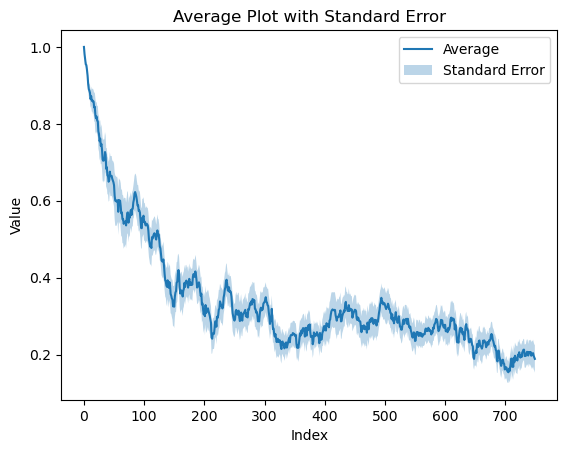

In [333]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array2 = np.mean(plot_data, axis=0)
standard_error = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.plot(np.arange(len(array2)), array2, label='Average')
plt.fill_between(np.arange(len(array2)), array2 - standard_error, array2 + standard_error, alpha=0.3, label='Standard Error')
plt.title('Average Plot with Standard Error')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()


In [5]:
plt.figure()
plt.loglog(np.arange(20, len(array4)), array4[20:], label='Analomous')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')
plt.loglog(np.arange(20, len(array2)), array2[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error[20:], array2[20:] + standard_error[20:], alpha=0.3, label='Standard Error')
plt.title('Comparison of Haldane and Analomous Edge state decay for 1000 for noise 0.2')
plt.xlabel('Log(time)')
plt.ylabel('Log(LE)')
plt.legend()
plt.show()

NameError: name 'array4' is not defined

<Figure size 640x480 with 0 Axes>

In [6]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_02_new')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Ana_02_edit_750_seed.txt'])


dict_keys(['b0_large', 'b2_large', 'b5_large', 'b6_large', 'b9_large', 'b10_large', 'b11_large', 'b16_large', 'b17_large', 'b19_large', 'b20_large', 'b32_large', 'b34_large', 'b41_large', 'b43_large', 'b51_large', 'b53_large', 'b55_large', 'b61_large', 'b63_large', 'b64_large', 'b66_large', 'b67_large', 'b72_large', 'b87_large', 'b90_large', 'b92_large'])


NameError: name 'array4' is not defined

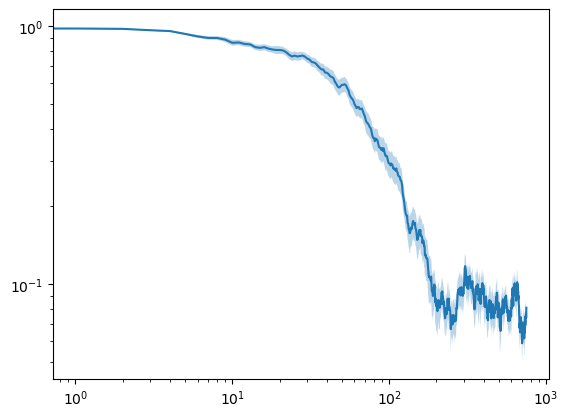

In [7]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_seed.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array1 = np.mean(plot_data, axis=0)
standard_error1 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.loglog(np.arange(len(array1)), array1, label='Average')
plt.fill_between(np.arange(len(array1)), array1 - standard_error1, array1 + standard_error1, alpha=0.3, label='Standard Error')
plt.plot(np.arange(len(array4)), array4, label='Analomous')
plt.fill_between(np.arange(len(array4)), array4 - standard_error4, array4 + standard_error4, alpha=0.3, label='Standard Error')

plt.title('Average Plot with Standard Error')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()


In [8]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_02_new_run')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Ana_02_edit_750_seed.txt'])


dict_keys(['b1_large', 'b2_large', 'b3_large', 'b4_large', 'b13_large', 'b15_large', 'b19_large', 'b23_large', 'b25_large', 'b26_large', 'b28_large', 'b29_large', 'b33_large', 'b38_large', 'b39_large', 'b44_large', 'b45_large', 'b48_large', 'b57_large', 'b61_large', 'b63_large', 'b64_large', 'b72_large', 'b73_large', 'b77_large', 'b79_large', 'b85_large', 'b86_large', 'b90_large', 'b91_large', 'b92_large'])


NameError: name 'array4' is not defined

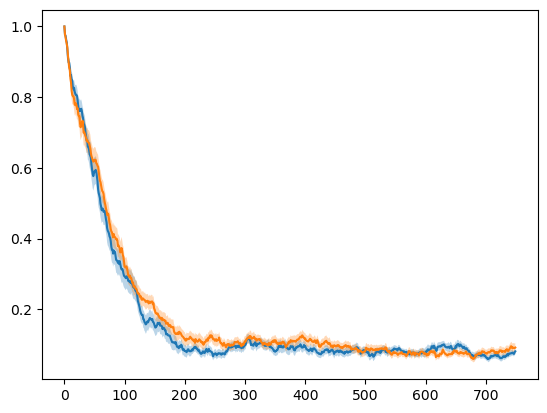

In [9]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_seed.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array2 = np.mean(plot_data, axis=0)
standard_error = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.plot(np.arange(len(array1)), array1, label='Run 1')
plt.fill_between(np.arange(len(array1)), array1 - standard_error1, array1 + standard_error1, alpha=0.3, label='Standard Error')
plt.plot(np.arange(len(array2)), array2, label='Run 2')
plt.fill_between(np.arange(len(array2)), array2 - standard_error, array2 + standard_error, alpha=0.3, label='Standard Error')
plt.plot(np.arange(len(array4)), array4, label='Analomous')
plt.fill_between(np.arange(len(array4)), array4 - standard_error4, array4 + standard_error4, alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI for two different seeded runs')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()


dict_keys(['b1_large', 'b2_large', 'b3_large', 'b4_large', 'b13_large', 'b15_large', 'b19_large', 'b23_large', 'b25_large', 'b26_large', 'b28_large', 'b29_large', 'b33_large', 'b38_large', 'b39_large', 'b44_large', 'b45_large', 'b48_large', 'b57_large', 'b61_large', 'b63_large', 'b64_large', 'b72_large', 'b73_large', 'b77_large', 'b79_large', 'b85_large', 'b86_large', 'b90_large', 'b91_large', 'b92_large'])


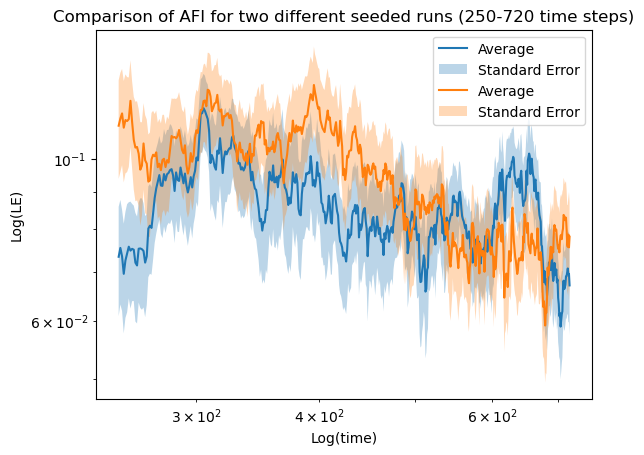

In [10]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_seed.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array2 = np.mean(plot_data, axis=0)
standard_error = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.loglog(np.arange(250, 720), array1[250:720], label='Average')
plt.fill_between(np.arange(250, 720), array1[250:720] - standard_error1[250:720], array1[250:720] + standard_error1[250:720], alpha=0.3, label='Standard Error')
plt.loglog(np.arange(250, 720), array2[250:720], label='Average')
plt.fill_between(np.arange(250, 720), array2[250:720] - standard_error[250:720], array2[250:720] + standard_error[250:720], alpha=0.3, label='Standard Error')
plt.title('Comparison of AFI for two different seeded runs (250-720 time steps)')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time)')
plt.legend()
plt.show()


In [11]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_02_500')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Ana_02_edit_750_500.txt'])


dict_keys(['b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b79_large'])


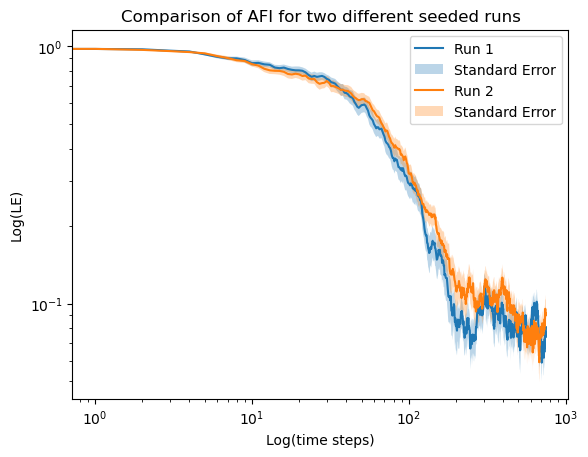

In [12]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array22 = np.mean(plot_data, axis=0)
standard_error22 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.loglog(np.arange(len(array1)), array1, label='Run 1')
plt.fill_between(np.arange(len(array1)), array1 - standard_error1, array1 + standard_error1, alpha=0.3, label='Standard Error')
plt.loglog(np.arange(len(array2)), array2, label='Run 2')
plt.fill_between(np.arange(len(array2)), array2 - standard_error, array2 + standard_error, alpha=0.3, label='Standard Error')
#plt.loglog(np.arange(len(array4)), array4, label='Analomous')
#plt.fill_between(np.arange(len(array4)), array4 - standard_error4, array4 + standard_error4, alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI for two different seeded runs')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()


In [13]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_02_1500')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Ana_02_edit_750_1500.txt'])


dict_keys(['b6_large', 'b7_large', 'b22_large', 'b24_large', 'b40_large', 'b59_large', 'b62_large', 'b67_large', 'b74_large', 'b89_large', 'b93_large'])


NameError: name 'array4' is not defined

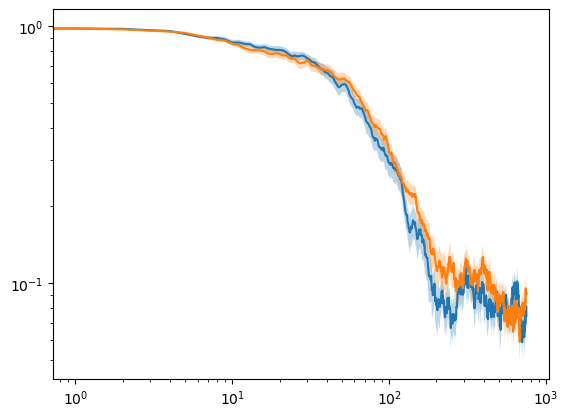

In [14]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array11 = np.mean(plot_data, axis=0)
standard_error11 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Plot the average with standard error
plt.figure()
plt.loglog(np.arange(len(array1)), array1, label='Run 1')
plt.fill_between(np.arange(len(array1)), array1 - standard_error1, array1 + standard_error1, alpha=0.3, label='Standard Error')
plt.loglog(np.arange(len(array2)), array2, label='Run 2')
plt.fill_between(np.arange(len(array2)), array2 - standard_error, array2 + standard_error, alpha=0.3, label='Standard Error')
plt.loglog(np.arange(len(array4)), array4, label='Analomous')
plt.fill_between(np.arange(len(array4)), array4 - standard_error4, array4 + standard_error4, alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI for two different seeded runs')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()


In [15]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_02_1500')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Hal_02_edit_750_1500.txt'])


In [16]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

dict_keys(['b23_large', 'b24_large', 'b33_large', 'b42_large', 'b57_large', 'b62_large', 'b71_large', 'b74_large', 'b85_large', 'b89_large'])


In [17]:
plt.loglog(np.arange(20, len(array4)), array4[20:], label='Analomous')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

NameError: name 'array4' is not defined

In [18]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_02_500')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

dict_keys(['LE_Hal_02_edit_750_500.txt'])


In [19]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large'

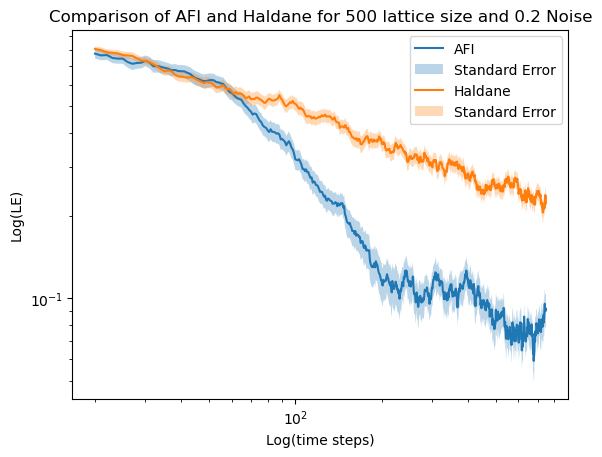

In [20]:
plt.loglog(np.arange(20, len(array2)), array2[20:], label='AFI')
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error[20:], array2[20:] + standard_error[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='Haldane')
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

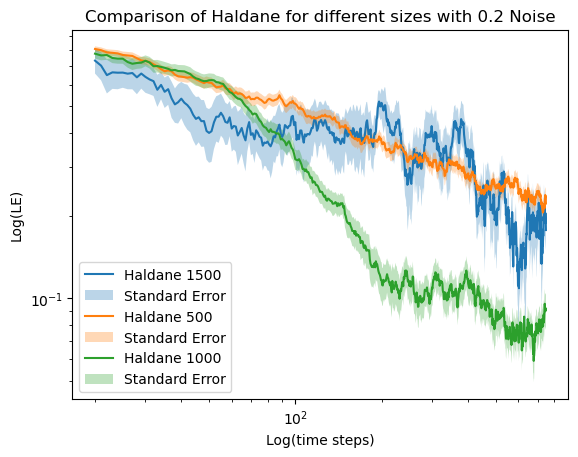

In [21]:
plt.loglog(np.arange(20, len(array5)), array5[20:], label='Haldane 1500')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane 500')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array2)), array2[20:], label='Haldane 1000')
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error[20:], array2[20:] + standard_error[20:], alpha=0.3, label='Standard Error')

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='Haldane')
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of Haldane for different sizes with 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

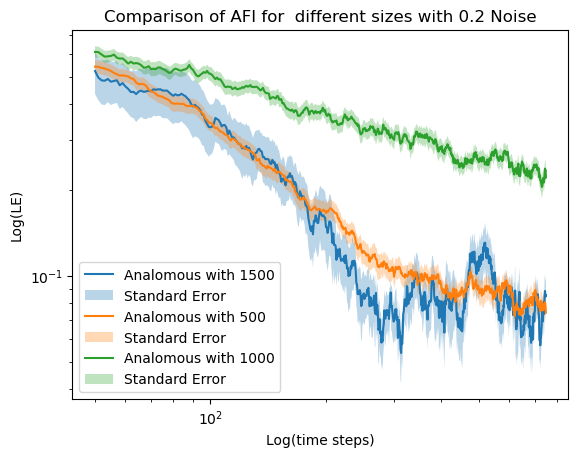

In [22]:
plt.figure()

plt.loglog(np.arange(50, len(array11)), array11[50:], label='Analomous with 1500')
plt.fill_between(np.arange(50, len(array11)), array11[50:] - standard_error11[50:], array11[50:] + standard_error11[50:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(50, len(array22)), array22[50:], label='Analomous with 500')
plt.fill_between(np.arange(50, len(array22)), array22[50:] - standard_error22[50:], array22[50:] + standard_error22[50:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(50, len(array4)), array4[50:], label='Analomous with 1000')
plt.fill_between(np.arange(50, len(array4)), array4[50:] - standard_error4[50:], array4[50:] + standard_error4[50:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI for  different sizes with 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

In [23]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())


dict_keys(['LE_Hal_02_edit_750_500_k_site.txt'])


In [24]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large'

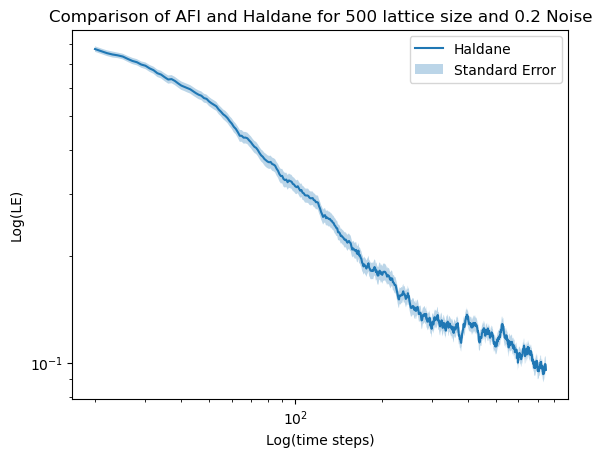

In [25]:

plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='Haldane')
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

In [26]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())


dict_keys(['LE_Ana_02_edit_750_500_new_k.txt'])


In [369]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large'

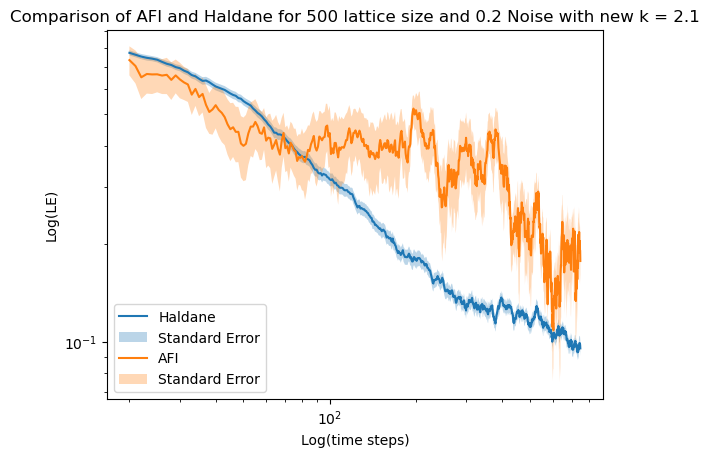

In [27]:

plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 2.1')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

In [32]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())


dict_keys(['LE_Hal_02_edit_750_500_k_site_82.txt'])


In [33]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large'

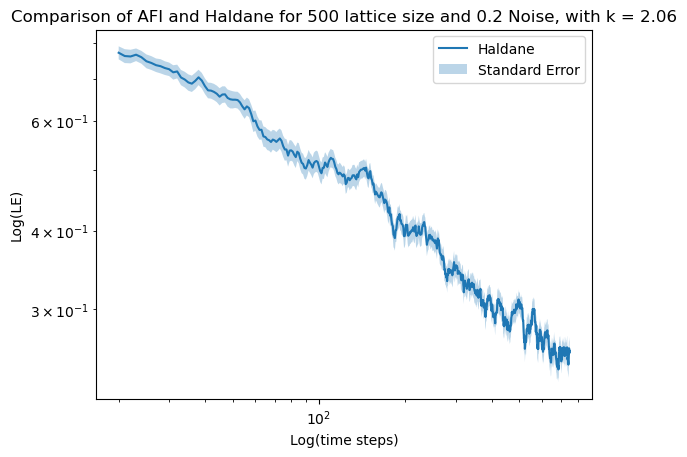

In [34]:

plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='Haldane')
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise, with k = 2.06')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

In [52]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())


dict_keys(['LE_Ana_02_edit_750_500_new_k_82.txt'])


In [53]:
# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

dict_keys(['b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b79_large'])


<>:22: SyntaxWarning: invalid escape sequence '\c'
<>:22: SyntaxWarning: invalid escape sequence '\c'
/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_1122/159416241.py:22: SyntaxWarning: invalid escape sequence '\c'
  plt.loglog(x_data, fitted_y_data, label=f'$A \cdot e^{{-kx}}+C$ (A={A_fit:.2e}, k={k_fit:.2e}), C={C_fit:.2e}')
/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_1122/159416241.py:8: RuntimeWarning: overflow encountered in exp
  return A * np.exp(-k * x) + C


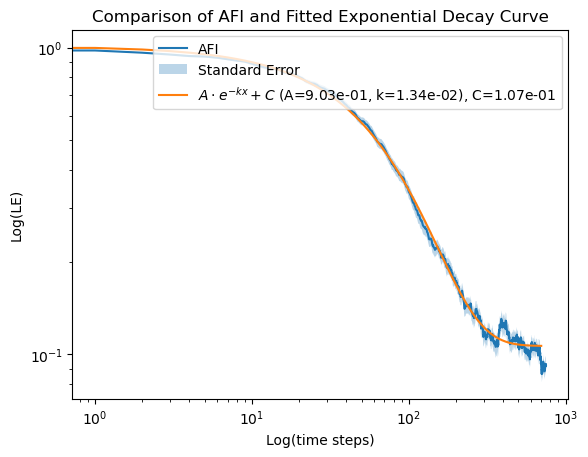

In [59]:
from scipy.optimize import curve_fit

# Define the x data range for the first 350 time steps
x_data = np.arange(0, 700)

# Define the exponential function
def exp_func(x, A, k, C):
    return A * np.exp(-k * x) + C

# Fit the curve
params, covariance = curve_fit(exp_func, x_data, array5[:700])
A_fit, k_fit ,C_fit= params

# Calculate the y data for the fitted exponential curve
fitted_y_data = exp_func(x_data, A_fit, k_fit, C_fit)

# Plot the AFI data
plt.loglog(np.arange(len(array5)), array5, label='AFI')
plt.fill_between(np.arange(len(array5)), array5 - standard_error5, array5 + standard_error5, alpha=0.3, label='Standard Error')

# Plot the fitted exponential curve
plt.loglog(x_data, fitted_y_data, label=f'$A \cdot e^{{-kx}}+C$ (A={A_fit:.2e}, k={k_fit:.2e}), C={C_fit:.2e}')

# Add labels and title
plt.title('Comparison of AFI and Fitted Exponential Decay Curve')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()


<>:22: SyntaxWarning: invalid escape sequence '\c'
<>:22: SyntaxWarning: invalid escape sequence '\c'
/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_1122/2144268490.py:22: SyntaxWarning: invalid escape sequence '\c'
  plt.loglog(x_data, fitted_y_data, label=f'$A \cdot e^{{-kx}}$ (A={A_fit:.2e}, k={k_fit:.2e})')
/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_1122/2144268490.py:8: RuntimeWarning: overflow encountered in exp
  return A * np.exp(-k * x)


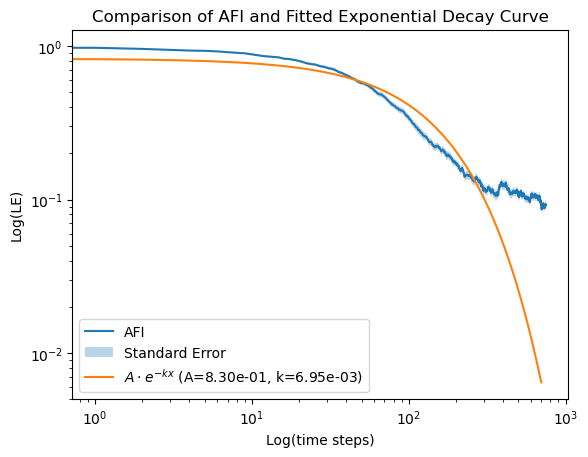

In [57]:
from scipy.optimize import curve_fit

# Define the x data range for the first 350 time steps
x_data = np.arange(0, 700)

# Define the exponential function
def exp_func(x, A, k):
    return A * np.exp(-k * x) 

# Fit the curve
params, covariance = curve_fit(exp_func, x_data, array5[:700])
A_fit, k_fit = params

# Calculate the y data for the fitted exponential curve
fitted_y_data = exp_func(x_data, A_fit, k_fit)

# Plot the AFI data
plt.loglog(np.arange(len(array5)), array5, label='AFI')
plt.fill_between(np.arange(len(array5)), array5 - standard_error5, array5 + standard_error5, alpha=0.3, label='Standard Error')

# Plot the fitted exponential curve
plt.loglog(x_data, fitted_y_data, label=f'$A \cdot e^{{-kx}}$ (A={A_fit:.2e}, k={k_fit:.2e})')

# Add labels and title
plt.title('Comparison of AFI and Fitted Exponential Decay Curve')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_85.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

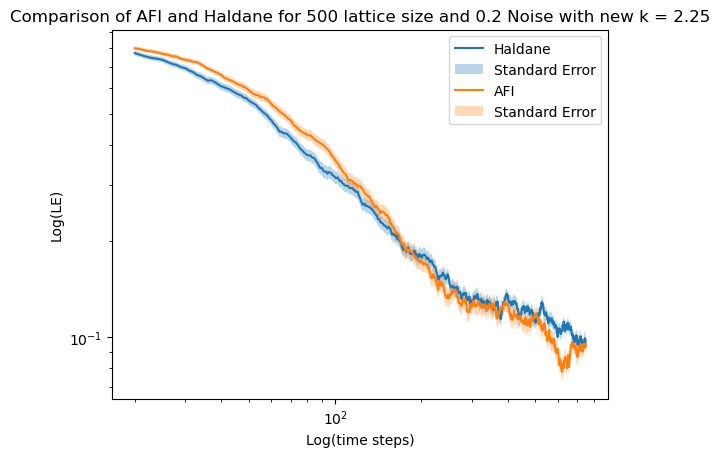

In [391]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 2.25')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_88.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

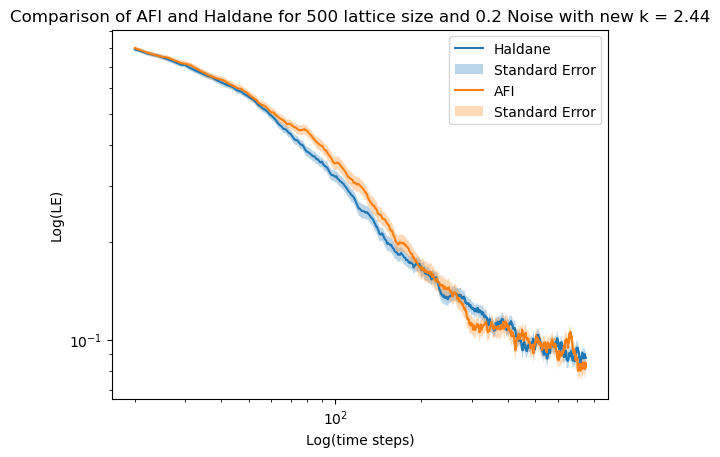

In [392]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 2.44')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_91.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

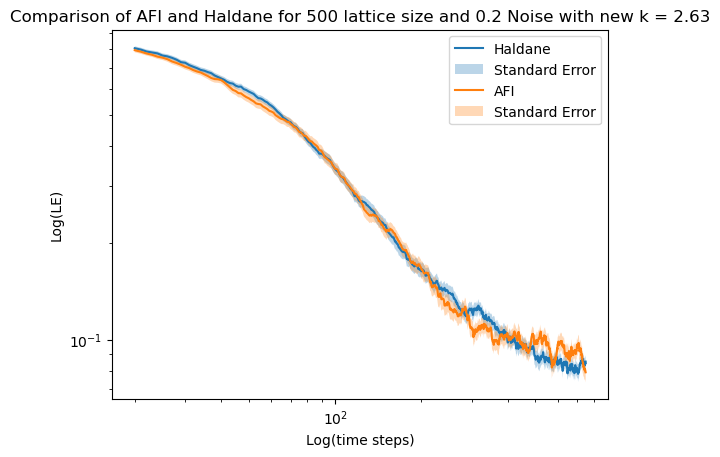

In [393]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 2.63')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_94.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

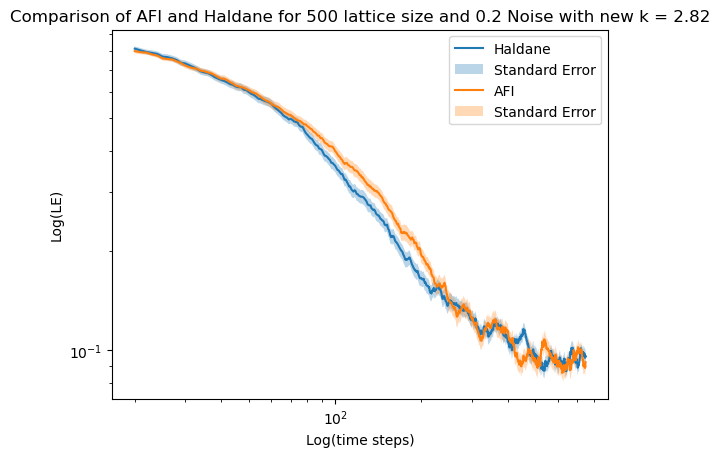

In [394]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 2.82')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_94.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

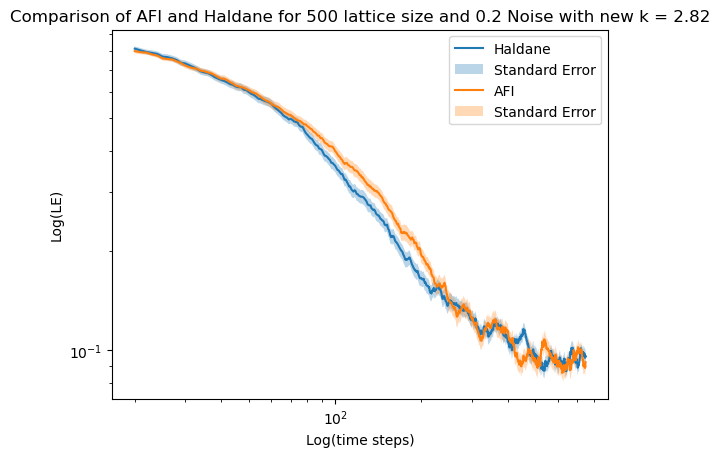

In [395]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 2.82')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_94.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

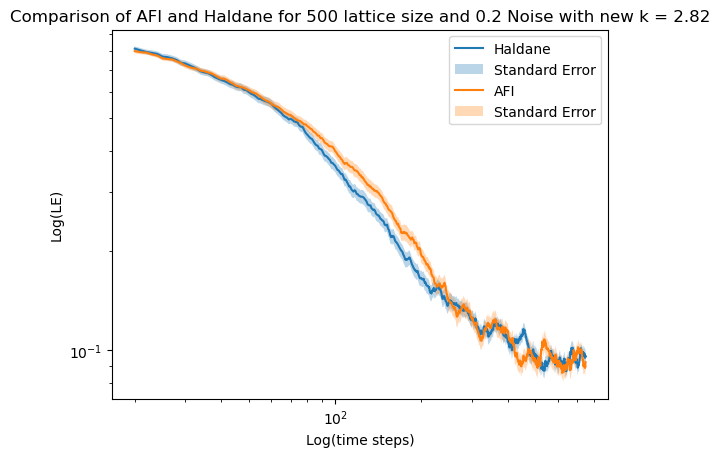

In [396]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 2.82')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_97.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

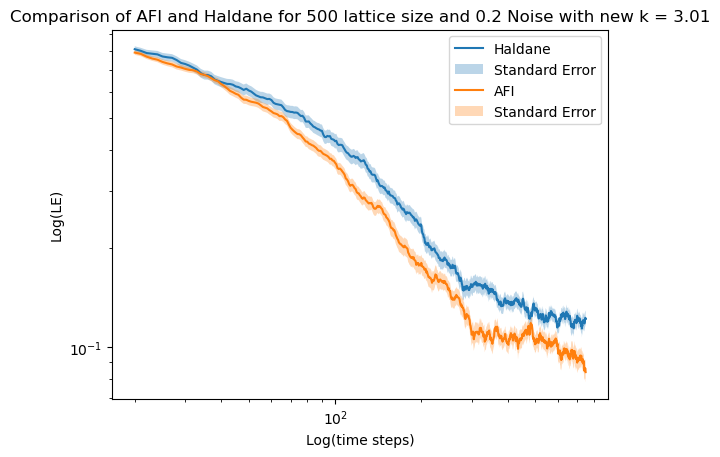

In [397]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 3.01')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_99.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

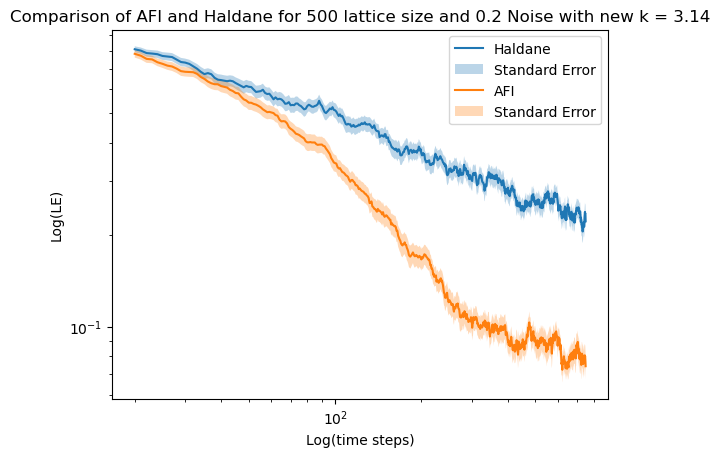

In [398]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 3.14')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_82.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

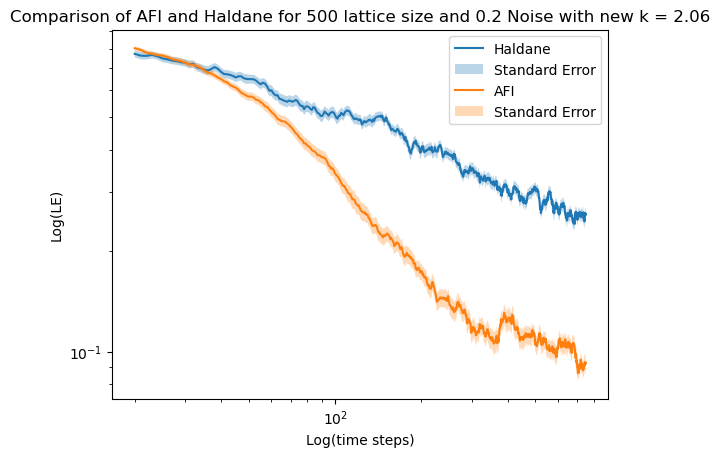

In [399]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


plt.loglog(np.arange(20, len(array4)), array4[20:], label='Haldane')
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, label='Standard Error')

plt.loglog(np.arange(20, len(array5)), array5[20:], label='AFI')
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, label='Standard Error')

plt.title('Comparison of AFI and Haldane for 500 lattice size and 0.2 Noise with new k = 2.06')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_1500_k_site_82.txt'])
dict_keys(['b4_large', 'b5_large', 'b6_large', 'b9_large', 'b19_large', 'b23_large', 'b30_large', 'b37_large', 'b41_large', 'b44_large', 'b46_large', 'b56_large', 'b58_large', 'b61_large', 'b63_large', 'b66_large', 'b67_large', 'b71_large', 'b76_large', 'b80_large', 'b82_large', 'b88_large', 'b89_large'])
dict_keys(['LE_Hal_02_edit_750_1500_k_site_85.txt'])
dict_keys(['b4_large', 'b5_large', 'b6_large', 'b9_large', 'b19_large', 'b23_large', 'b30_large', 'b37_large', 'b41_large', 'b44_large', 'b46_large', 'b56_large', 'b58_large', 'b61_large', 'b63_large', 'b66_large', 'b67_large', 'b71_large', 'b76_large', 'b80_large', 'b82_large', 'b88_large', 'b89_large'])
dict_keys(['LE_Hal_02_edit_750_1500_k_site_88.txt'])
dict_keys(['b4_large', 'b5_large', 'b6_large', 'b9_large', 'b19_large', 'b23_large', 'b30_large', 'b37_large', 'b41_large', 'b44_large', 'b46_large', 'b56_large', 'b58_large', 'b61_large', 'b63_large', 'b66_large', 'b67_large',

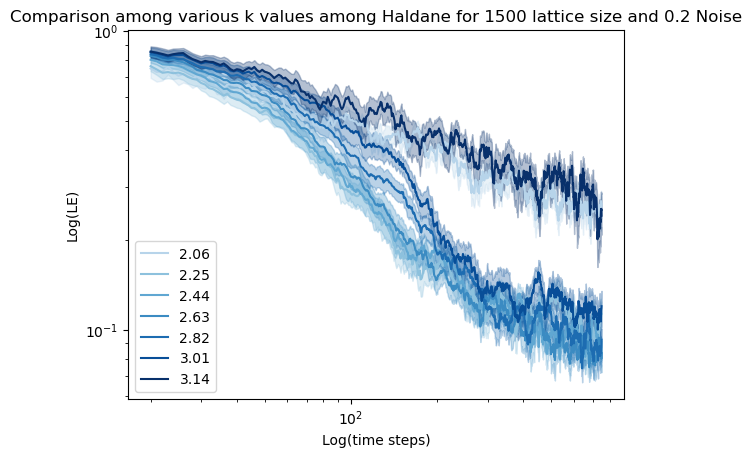

In [51]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_1500_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array6 = np.mean(plot_data, axis=0)
standard_error6 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array7 = np.mean(plot_data, axis=0)
standard_error7 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array8 = np.mean(plot_data, axis=0)
standard_error8 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array9 = np.mean(plot_data, axis=0)
standard_error9 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array10 = np.mean(plot_data, axis=0)
standard_error10 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

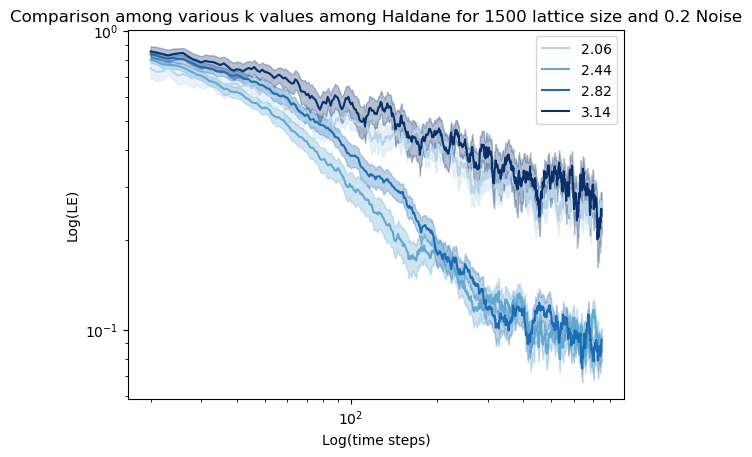

In [52]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

#plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
#plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

#plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_82.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

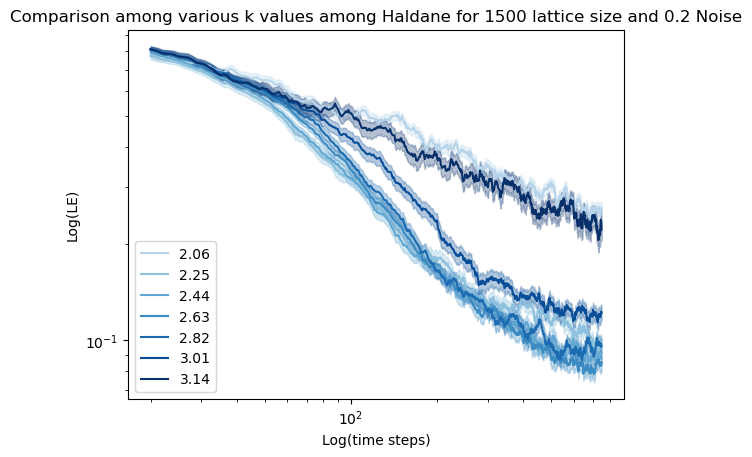

In [54]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array6 = np.mean(plot_data, axis=0)
standard_error6 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array7 = np.mean(plot_data, axis=0)
standard_error7 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array8 = np.mean(plot_data, axis=0)
standard_error8 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array9 = np.mean(plot_data, axis=0)
standard_error9 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array10 = np.mean(plot_data, axis=0)
standard_error10 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

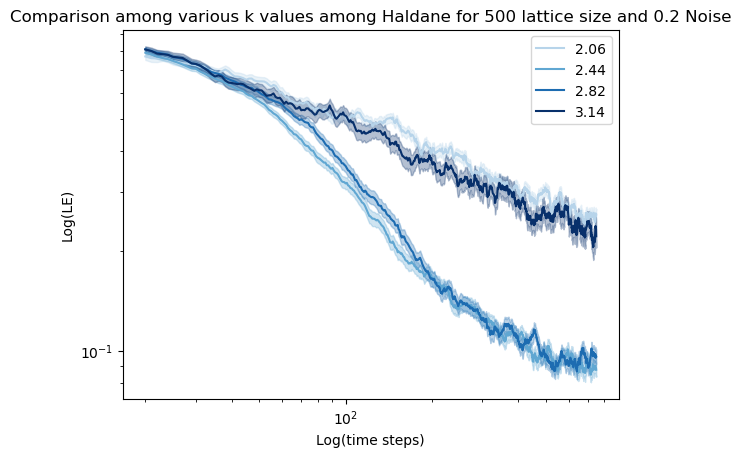

In [55]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

#plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
#plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

#plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among Haldane for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Ana_02_edit_750_500_new_k_82.txt'])
dict_keys(['b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b79_large'])
dict_keys(['LE_Ana_02_edit_750_500_new_k_85.txt'])
dict_keys(['b16_large', 'b17_large', 'b18_large', 'b19

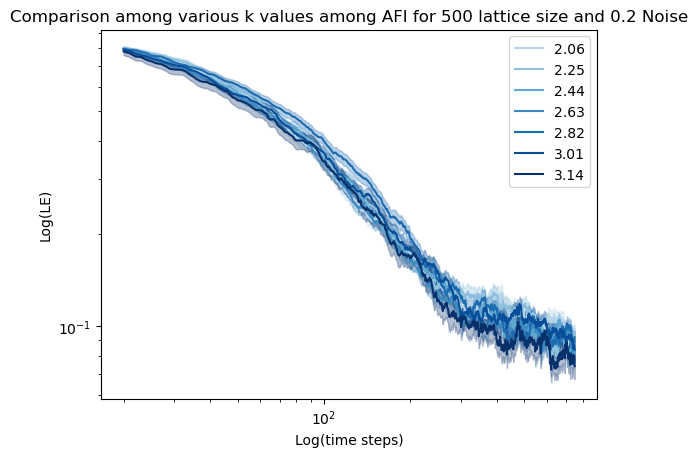

In [63]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array6 = np.mean(plot_data, axis=0)
standard_error6 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array7 = np.mean(plot_data, axis=0)
standard_error7 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array8 = np.mean(plot_data, axis=0)
standard_error8 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array9 = np.mean(plot_data, axis=0)
standard_error9 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array10 = np.mean(plot_data, axis=0)
standard_error10 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Ana_02_edit_750_500_new_k_82.txt'])
dict_keys(['b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b79_large'])


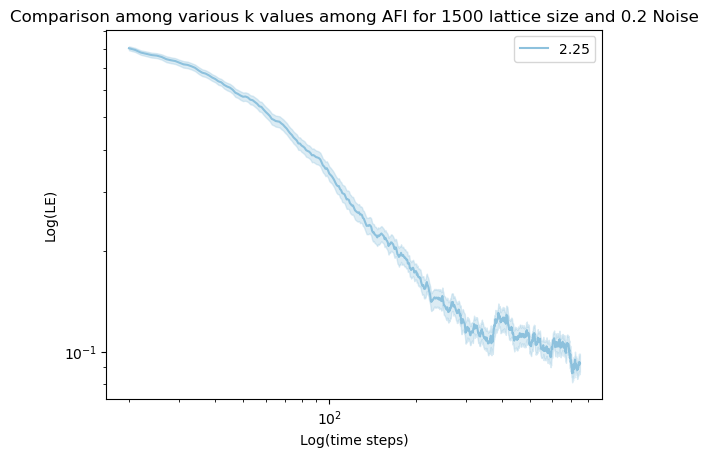

In [58]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.title('Comparison among various k values among AFI for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Ana_02_edit_750_1500_new_k_82.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large', 'b47_large', 'b50_large', 'b52_large', 'b71_large', 'b72_large', 'b81_large', 'b89_large'])
dict_keys(['LE_Ana_02_edit_750_1500_new_k_85.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large', 'b47_large', 'b50_large', 'b52_large', 'b71_large', 'b72_large', 'b81_large', 'b89_large'])
dict_keys(['LE_Ana_02_edit_750_1500_new_k_88.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large', 'b47_large', 'b50_large', 'b52_large', 'b71_large', 'b72_large', 'b81_large', 'b89_large'])
dict_keys(['LE_Ana_02_edit_750_1500_new_k_91.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large', 'b47_large', 'b50_large', 'b52_large', 'b71_large', 'b72_large', 'b81_large', 'b89_large'])
dict_keys(['LE_Ana_02_edit_750_1500_new_k_94.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large

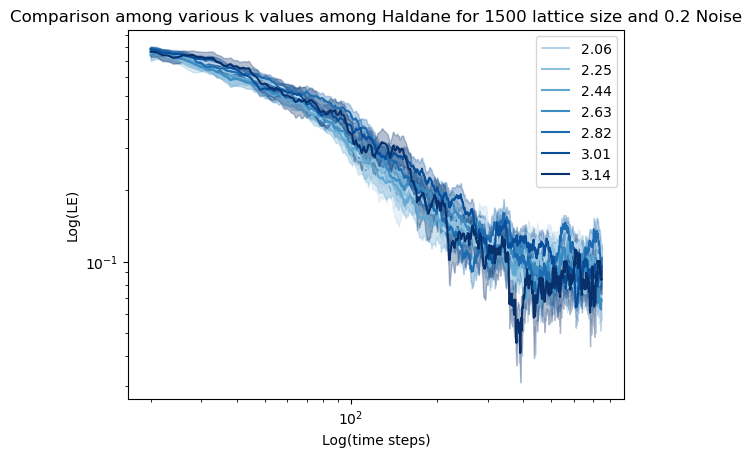

In [68]:
# AFI Phase for 1500 lattice size and 0.2 Noise
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_1500_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array6 = np.mean(plot_data, axis=0)
standard_error6 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array7 = np.mean(plot_data, axis=0)
standard_error7 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array8 = np.mean(plot_data, axis=0)
standard_error8 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array9 = np.mean(plot_data, axis=0)
standard_error9 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array10 = np.mean(plot_data, axis=0)
standard_error10 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Hal_02_edit_750_500_k_site_82.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large'

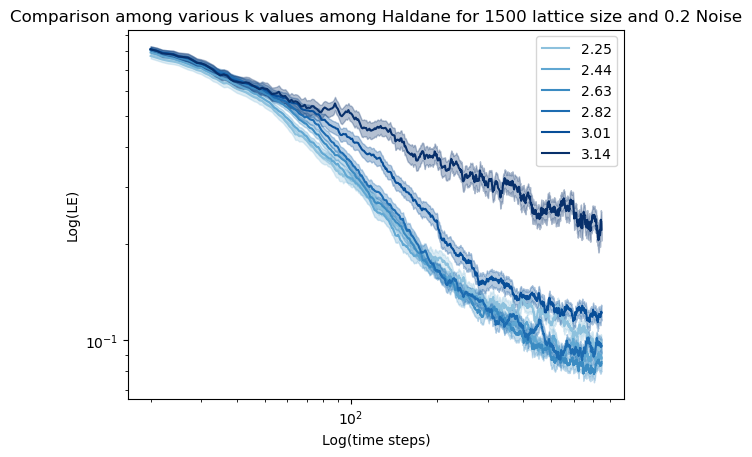

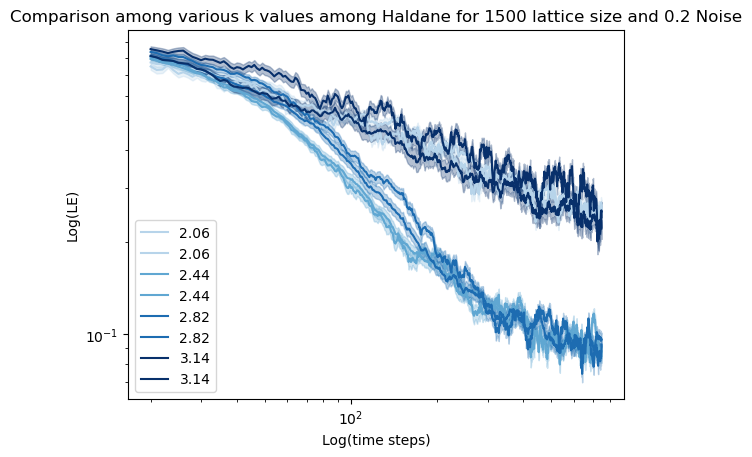

In [22]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array6 = np.mean(plot_data, axis=0)
standard_error6 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array7 = np.mean(plot_data, axis=0)
standard_error7 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array8 = np.mean(plot_data, axis=0)
standard_error8 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array9 = np.mean(plot_data, axis=0)
standard_error9 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_500_k_site_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_500_k_site_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array10 = np.mean(plot_data, axis=0)
standard_error10 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_1500_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15004 = np.mean(plot_data, axis=0)
standard_error15004 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15005 = np.mean(plot_data, axis=0)
standard_error15005 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15006 = np.mean(plot_data, axis=0)
standard_error15006 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15007 = np.mean(plot_data, axis=0)
standard_error15007 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15008 = np.mean(plot_data, axis=0)
standard_error15008 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15009 = np.mean(plot_data, axis=0)
standard_error15009 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_02_edit_750_1500_k_site_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_02_edit_750_1500_k_site_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array150010 = np.mean(plot_data, axis=0)
standard_error150010 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))


plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array15004)), array15004[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array15004)), array15004[20:] - standard_error4[20:], array15004[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

#plt.loglog(np.arange(20, len(array15005)), array15005[20:], label='2.25', color=colors[1])
#plt.fill_between(np.arange(20, len(array15005)), array15005[20:] - standard_error5[20:], array15005[20:] + standard_error5[20:], alpha=0.3, color=colors[1])


plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array15006)), array15006[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array15006)), array15006[20:] - standard_error6[20:], array15006[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

#plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
#plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

#plt.loglog(np.arange(20, len(array15007)), array15007[20:], label='2.63', color=colors[3])
#plt.fill_between(np.arange(20, len(array15007)), array15007[20:] - standard_error7[20:], array15007[20:] + standard_error7[20:], alpha=0.3, color=colors[3])


plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array15008)), array15008[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array15008)), array15008[20:] - standard_error8[20:], array15008[20:] + standard_error8[20:], alpha=0.3, color=colors[4])


#plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

#plt.loglog(np.arange(20, len(array15009)), array15009[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array15009)), array15009[20:] - standard_error9[20:], array15009[20:] + standard_error9[20:], alpha=0.3, color=colors[5])


plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.loglog(np.arange(20, len(array150010)), array150010[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array150010)), array150010[20:] - standard_error10[20:], array150010[20:] + standard_error10[20:], alpha=0.3, color=colors[6])


plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

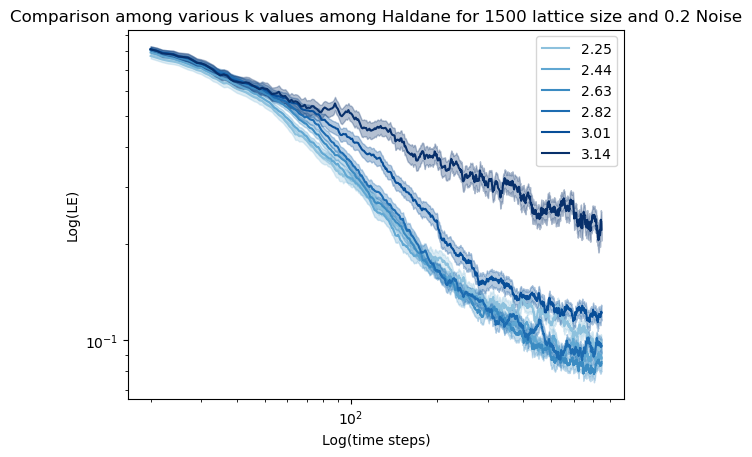

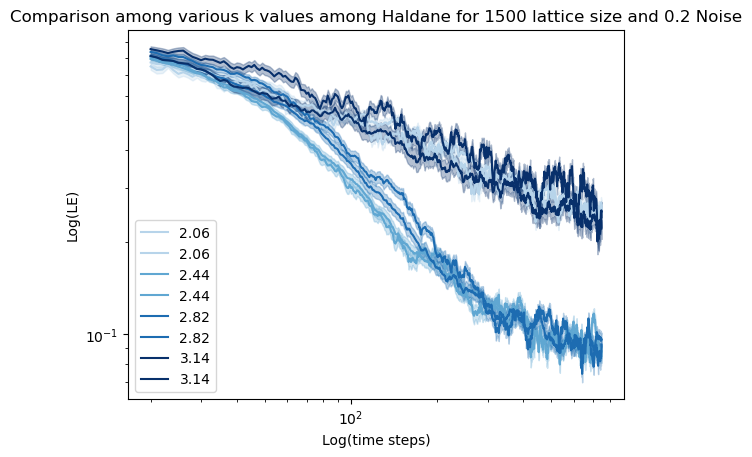

In [23]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))


plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array15004)), array15004[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array15004)), array15004[20:] - standard_error4[20:], array15004[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

#plt.loglog(np.arange(20, len(array15005)), array15005[20:], label='2.25', color=colors[1])
#plt.fill_between(np.arange(20, len(array15005)), array15005[20:] - standard_error5[20:], array15005[20:] + standard_error5[20:], alpha=0.3, color=colors[1])


plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array15006)), array15006[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array15006)), array15006[20:] - standard_error6[20:], array15006[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

#plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
#plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

#plt.loglog(np.arange(20, len(array15007)), array15007[20:], label='2.63', color=colors[3])
#plt.fill_between(np.arange(20, len(array15007)), array15007[20:] - standard_error7[20:], array15007[20:] + standard_error7[20:], alpha=0.3, color=colors[3])


plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array15008)), array15008[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array15008)), array15008[20:] - standard_error8[20:], array15008[20:] + standard_error8[20:], alpha=0.3, color=colors[4])


#plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

#plt.loglog(np.arange(20, len(array15009)), array15009[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array15009)), array15009[20:] - standard_error9[20:], array15009[20:] + standard_error9[20:], alpha=0.3, color=colors[5])


plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.loglog(np.arange(20, len(array150010)), array150010[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array150010)), array150010[20:] - standard_error10[20:], array150010[20:] + standard_error10[20:], alpha=0.3, color=colors[6])


plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

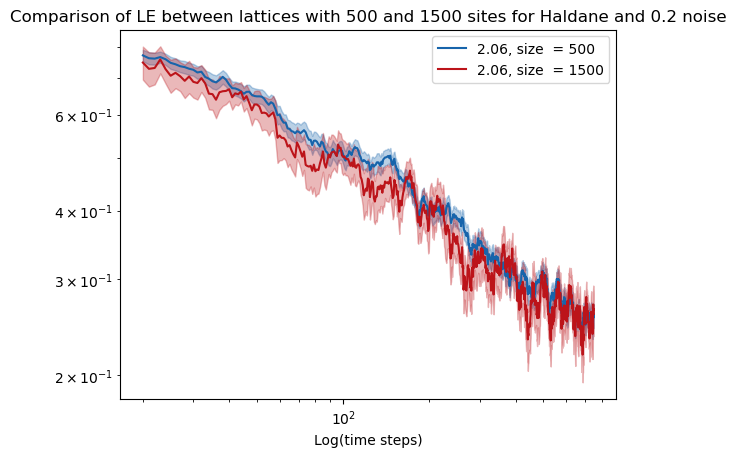

In [31]:
colors = plt.cm.Blues(np.linspace(0.8, 1, 7))
colors2 = plt.cm.Reds(np.linspace(0.8, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06, size  = 500', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array15004)), array15004[20:], label='2.06, size  = 1500', color=colors2[0])
plt.fill_between(np.arange(20, len(array15004)), array15004[20:] - standard_error15004[20:], array15004[20:] + standard_error15004[20:], alpha=0.3, color=colors2[0])

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

#plt.loglog(np.arange(20, len(array15005)), array15005[20:], label='2.25', color=colors[1])
#plt.fill_between(np.arange(20, len(array15005)), array15005[20:] - standard_error5[20:], array15005[20:] + standard_error5[20:], alpha=0.3, color=colors[1])




plt.title('Comparison of LE between lattices with 500 and 1500 sites for Haldane and 0.2 noise')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

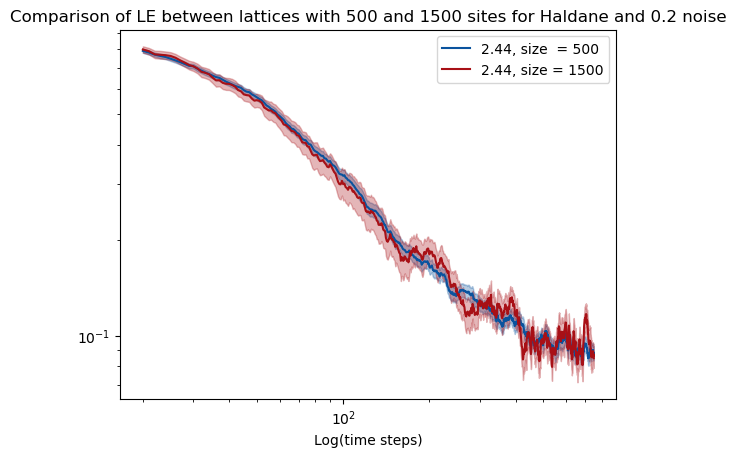

In [30]:
plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44, size  = 500', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array15006)), array15006[20:], label='2.44, size = 1500', color=colors2[2])
plt.fill_between(np.arange(20, len(array15006)), array15006[20:] - standard_error15006[20:], array15006[20:] + standard_error15006[20:], alpha=0.3, color=colors2[2])

plt.title('Comparison of LE between lattices with 500 and 1500 sites for Haldane and 0.2 noise')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

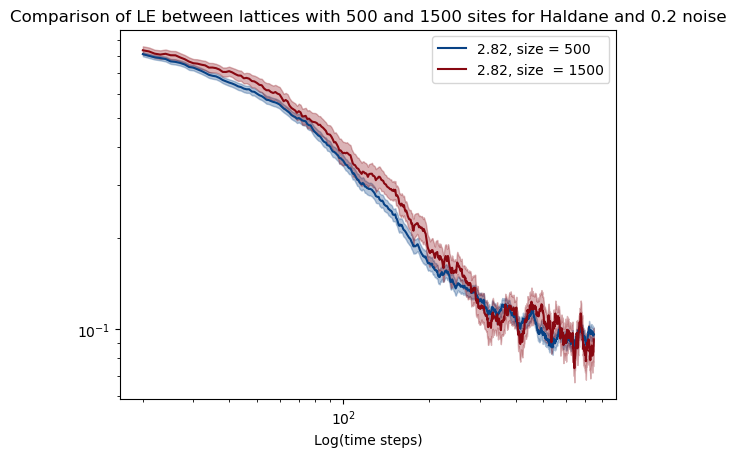

In [29]:

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82, size = 500', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array15008)), array15008[20:], label='2.82, size  = 1500', color=colors2[4])
plt.fill_between(np.arange(20, len(array15008)), array15008[20:] - standard_error15008[20:], array15008[20:] + standard_error15008[20:], alpha=0.3, color=colors2[4])


#plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

#plt.loglog(np.arange(20, len(array15009)), array15009[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array15009)), array15009[20:] - standard_error9[20:], array15009[20:] + standard_error9[20:], alpha=0.3, color=colors[5])


plt.title('Comparison of LE between lattices with 500 and 1500 sites for Haldane and 0.2 noise')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

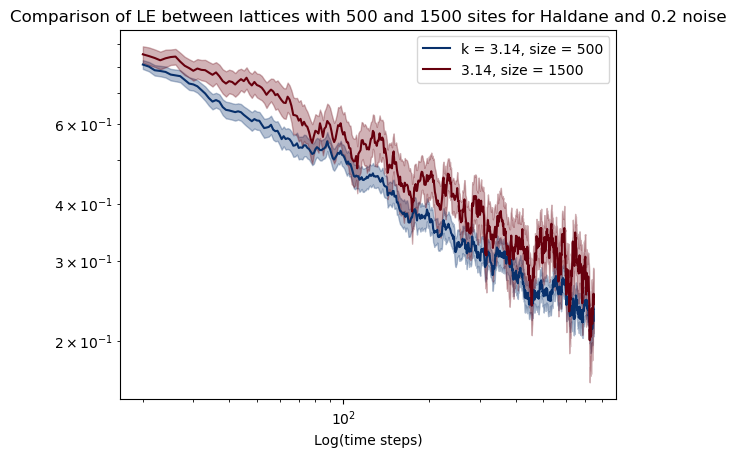

In [28]:
plt.loglog(np.arange(20, len(array10)), array10[20:], label='k = 3.14, size = 500', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.loglog(np.arange(20, len(array150010)), array150010[20:], label='3.14, size = 1500', color=colors2[6])
plt.fill_between(np.arange(20, len(array150010)), array150010[20:] - standard_error150010[20:], array150010[20:] + standard_error150010[20:], alpha=0.3, color=colors2[6])

plt.title('Comparison of LE between lattices with 500 and 1500 sites for Haldane and 0.2 noise')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Ana_02_edit_750_500_new_k_82.txt'])
dict_keys(['b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b79_large'])
dict_keys(['LE_Ana_02_edit_750_500_new_k_85.txt'])
dict_keys(['b16_large', 'b17_large', 'b18_large', 'b19

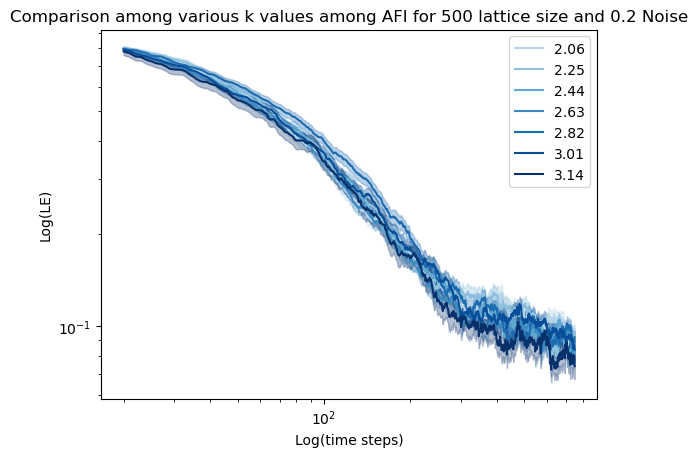

In [18]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array6 = np.mean(plot_data, axis=0)
standard_error6 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array7 = np.mean(plot_data, axis=0)
standard_error7 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array8 = np.mean(plot_data, axis=0)
standard_error8 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array9 = np.mean(plot_data, axis=0)
standard_error9 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array10 = np.mean(plot_data, axis=0)
standard_error10 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

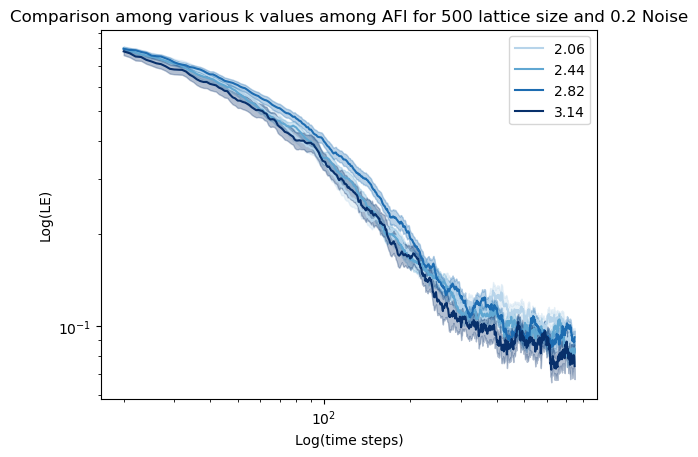

In [19]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

#plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
#plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

#plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Ana_02_edit_750_1500_new_k_82.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large', 'b47_large', 'b50_large', 'b52_large', 'b71_large', 'b72_large', 'b81_large', 'b89_large'])
dict_keys(['LE_Ana_02_edit_750_1500_new_k_85.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large', 'b47_large', 'b50_large', 'b52_large', 'b71_large', 'b72_large', 'b81_large', 'b89_large'])
dict_keys(['LE_Ana_02_edit_750_1500_new_k_88.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large', 'b47_large', 'b50_large', 'b52_large', 'b71_large', 'b72_large', 'b81_large', 'b89_large'])
dict_keys(['LE_Ana_02_edit_750_1500_new_k_91.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large', 'b47_large', 'b50_large', 'b52_large', 'b71_large', 'b72_large', 'b81_large', 'b89_large'])
dict_keys(['LE_Ana_02_edit_750_1500_new_k_94.txt'])
dict_keys(['b3_large', 'b15_large', 'b16_large', 'b30_large', 'b37_large

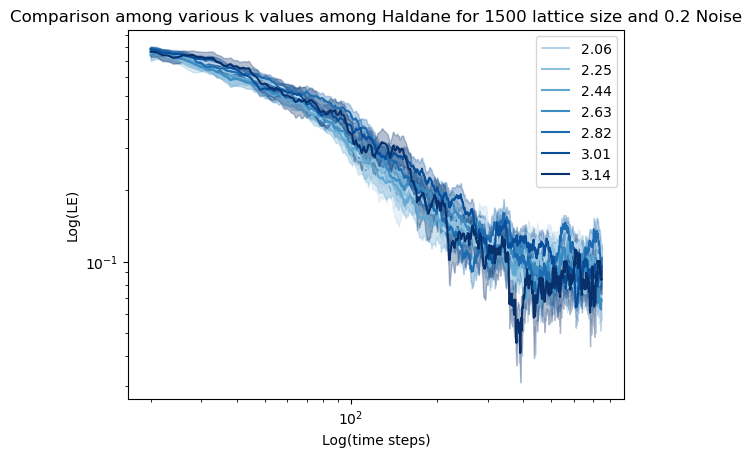

In [41]:
# AFI Phase for 1500 lattice size and 0.2 Noise
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Ana_1500_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15004 = np.mean(plot_data, axis=0)
standard_error15004 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15005 = np.mean(plot_data, axis=0)
standard_error15005 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15006 = np.mean(plot_data, axis=0)
standard_error15006 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15007 = np.mean(plot_data, axis=0)
standard_error15007 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15008 = np.mean(plot_data, axis=0)
standard_error15008 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array15009 = np.mean(plot_data, axis=0)
standard_error15009 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_1500_new_k_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_1500_new_k_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array150010 = np.mean(plot_data, axis=0)
standard_error150010 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array15004)), array15004[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array15004)), array15004[20:] - standard_error15004[20:], array15004[20:] + standard_error15004[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array15005)), array15005[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array15005)), array15005[20:] - standard_error15005[20:], array15005[20:] + standard_error15005[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array15006)), array15006[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array15006)), array15006[20:] - standard_error15006[20:], array15006[20:] + standard_error15006[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array15007)), array15007[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array15007)), array15007[20:] - standard_error15007[20:], array15007[20:] + standard_error15007[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array15008)), array15008[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array15008)), array15008[20:] - standard_error15008[20:], array15008[20:] + standard_error15008[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array15009)), array15009[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array15009)), array15009[20:] - standard_error15009[20:], array15009[20:] + standard_error15009[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array150010)), array150010[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array150010)), array150010[20:] - standard_error150010[20:], array150010[20:] + standard_error150010[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

dict_keys(['LE_Ana_02_edit_750_500_new_k_82.txt'])
dict_keys(['b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_large', 'b73_large', 'b74_large', 'b75_large', 'b76_large', 'b77_large', 'b78_large', 'b79_large'])
dict_keys(['LE_Ana_02_edit_750_500_new_k_85.txt'])
dict_keys(['b16_large', 'b17_large', 'b18_large', 'b19

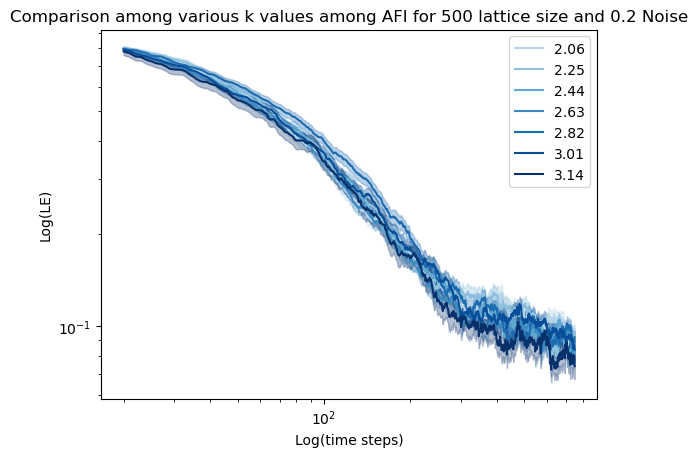

In [42]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/Hal_750_time_new_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_85') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_85.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array6 = np.mean(plot_data, axis=0)
standard_error6 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_91') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_91.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array7 = np.mean(plot_data, axis=0)
standard_error7 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_94') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_94.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array8 = np.mean(plot_data, axis=0)
standard_error8 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_97') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_97.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array9 = np.mean(plot_data, axis=0)
standard_error9 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Ana_02_edit_750_500_new_k_99') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Ana_02_edit_750_500_new_k_99.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array10 = np.mean(plot_data, axis=0)
standard_error10 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

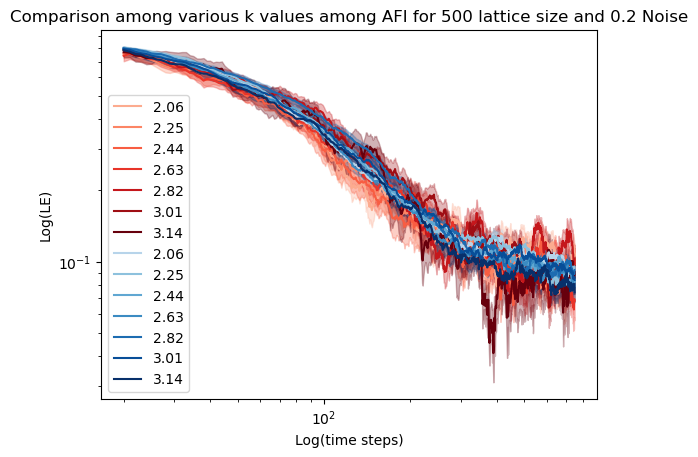

In [43]:

colors2 = plt.cm.Reds(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array15004)), array15004[20:], label='2.06', color=colors2[0])
plt.fill_between(np.arange(20, len(array15004)), array15004[20:] - standard_error15004[20:], array15004[20:] + standard_error15004[20:], alpha=0.3, color=colors2[0])

plt.loglog(np.arange(20, len(array15005)), array15005[20:], label='2.25', color=colors2[1])
plt.fill_between(np.arange(20, len(array15005)), array15005[20:] - standard_error15005[20:], array15005[20:] + standard_error15005[20:], alpha=0.3, color=colors2[1])

plt.loglog(np.arange(20, len(array15006)), array15006[20:], label='2.44', color=colors2[2])
plt.fill_between(np.arange(20, len(array15006)), array15006[20:] - standard_error15006[20:], array15006[20:] + standard_error15006[20:], alpha=0.3, color=colors2[2])

plt.loglog(np.arange(20, len(array15007)), array15007[20:], label='2.63', color=colors2[3])
plt.fill_between(np.arange(20, len(array15007)), array15007[20:] - standard_error15007[20:], array15007[20:] + standard_error15007[20:], alpha=0.3, color=colors2[3])

plt.loglog(np.arange(20, len(array15008)), array15008[20:], label='2.82', color=colors2[4])
plt.fill_between(np.arange(20, len(array15008)), array15008[20:] - standard_error15008[20:], array15008[20:] + standard_error15008[20:], alpha=0.3, color=colors2[4])

plt.loglog(np.arange(20, len(array15009)), array15009[20:], label='3.01', color=colors2[5])
plt.fill_between(np.arange(20, len(array15009)), array15009[20:] - standard_error15009[20:], array15009[20:] + standard_error15009[20:], alpha=0.3, color=colors2[5])

plt.loglog(np.arange(20, len(array150010)), array150010[20:], label='3.14', color=colors2[6])
plt.fill_between(np.arange(20, len(array150010)), array150010[20:] - standard_error150010[20:], array150010[20:] + standard_error150010[20:], alpha=0.3, color=colors2[6])

plt.title('Comparison among various k values among Haldane for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
#plt.show()

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

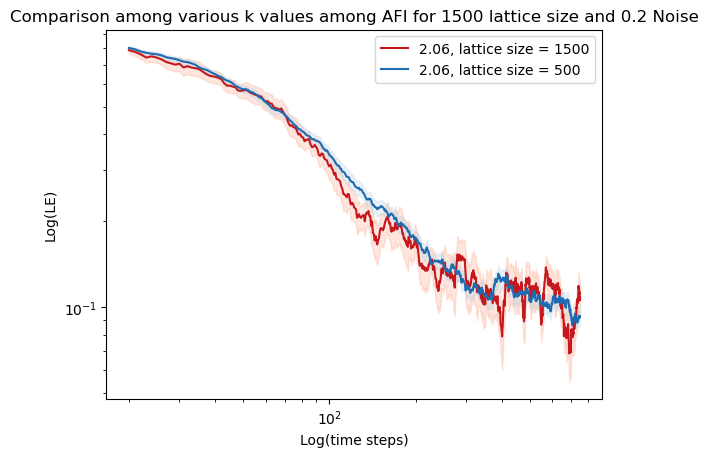

In [48]:
plt.loglog(np.arange(20, len(array15004)), array15004[20:], label='2.06, lattice size = 1500', color=colors2[4])
plt.fill_between(np.arange(20, len(array15004)), array15004[20:] - standard_error15004[20:], array15004[20:] + standard_error15004[20:], alpha=0.3, color=colors2[0])

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.06, lattice size = 500', color=colors[4])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[0])

plt.title('Comparison among various k values among AFI for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()

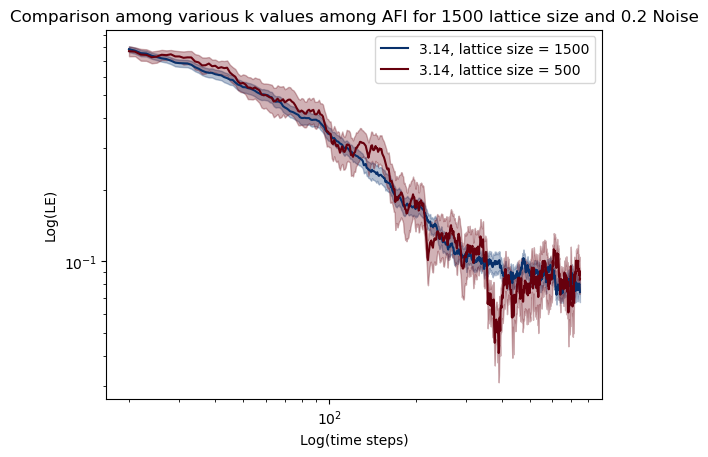

In [49]:
plt.loglog(np.arange(20, len(array10)), array10[20:], label='3.14, lattice size = 1500', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])
plt.loglog(np.arange(20, len(array150010)), array150010[20:], label='3.14, lattice size = 500', color=colors2[6])
plt.fill_between(np.arange(20, len(array150010)), array150010[20:] - standard_error150010[20:], array150010[20:] + standard_error150010[20:], alpha=0.3, color=colors2[6])

plt.title('Comparison among various k values among AFI for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()

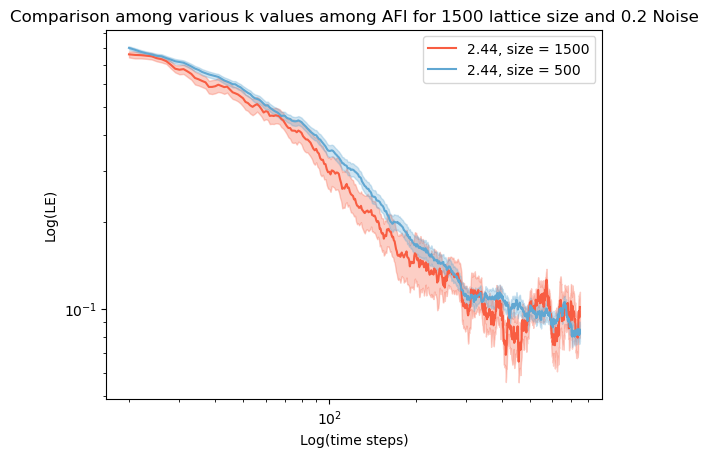

In [51]:
plt.loglog(np.arange(20, len(array15006)), array15006[20:], label='2.44, size = 1500', color=colors2[2])
plt.fill_between(np.arange(20, len(array15006)), array15006[20:] - standard_error15006[20:], array15006[20:] + standard_error15006[20:], alpha=0.3, color=colors2[2])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='2.44, size = 500', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.title('Comparison among various k values among AFI for 1500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()

In [164]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/HAl_500_time_fine_k')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Loop through the site numbers to generate arrays and standard errors
for idx, site in enumerate(range(410, 499, 2), start=1):
    # Walk through the directory
    for root, dirs, files in os.walk(downloads_folder):
        # Filter out only the .txt files that match the pattern
        txt_files = [file for file in files if file.startswith(f'LE_Hal_fine_grained_750_500_k_site_{site}') and file.endswith('.txt')]

        # Load each file and store it in the dictionary
        for txt_file in txt_files:
            file_path = os.path.join(root, txt_file)
            data = np.loadtxt(file_path)
            le_ana_arrays[txt_file] = data

    # Print the keys of the dictionary to verify
    print(le_ana_arrays.keys())

    # Initialize a dictionary to store the arrays from each directory
    le_ana_arrays = {}

    # Loop through directories b0 to b95
    for i in range(96):
        dir_path = os.path.join(downloads_folder, f'b{i}')
        le_ana_large_path = os.path.join(dir_path, f'LE_Hal_fine_grained_750_500_k_site_{site}.txt')
        
        if os.path.exists(le_ana_large_path):
            le_ana_large = np.loadtxt(le_ana_large_path)
            le_ana_arrays[f'b{i}_large'] = le_ana_large

    # Print the keys of the dictionary to verify
    print(le_ana_arrays.keys())

    # Convert the dictionary values to a numpy array for easier manipulation
    plot_data = np.array(list(le_ana_arrays.values()))

    # Calculate the average and standard error
    globals()[f'array{idx}'] = np.mean(plot_data, axis=0)
    globals()[f'standard_error{idx}'] = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Find the index of the array with the smallest value
min_value = float('inf')
min_index = -1

for idx, site in enumerate(range(410, 499, 2), start=1):
    current_min = np.min(globals()[f'array{idx}'])
    if current_min < min_value:
        min_value = current_min
        min_index = idx

print("Index of the array with the smallest value:", min_index)









# colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

# plt.loglog(np.arange(20, len(array1)), array1[20:], label='2.06', color=colors[0])
# plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

# plt.loglog(np.arange(20, len(array2)), array2[20:], label='2.25', color=colors[1])
# plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

# plt.loglog(np.arange(20, len(array3)), array3[20:], label='2.44', color=colors[2])
# plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

# plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.63', color=colors[3])
# plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

# plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.82', color=colors[4])
# plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[4])

# plt.loglog(np.arange(20, len(array6)), array6[20:], label='3.01', color=colors[5])
# plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[5])

# plt.loglog(np.arange(20, len(array7)), array7[20:], label='3.14', color=colors[6])
# plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[6])

# plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
# plt.ylabel('Log(LE)')
# plt.xlabel('Log(time steps)')
# plt.legend()
# plt.show()

dict_keys(['LE_Hal_fine_grained_750_500_k_site_410.txt'])
dict_keys(['b0_large', 'b2_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b16_large', 'b19_large', 'b20_large', 'b21_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b30_large', 'b31_large', 'b34_large', 'b35_large', 'b37_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b66_large', 'b68_large', 'b70_large', 'b71_large', 'b73_large', 'b75_large', 'b77_large', 'b78_large', 'b79_large', 'b80_large', 'b84_large', 'b85_large', 'b86_large', 'b88_large', 'b89_large', 'b90_large', 'b92_large', 'b94_large', 'b95_large'])
dict_keys(['b0_large', 'b2_large', 'b4_large', 'b5_large', 'b6_lar

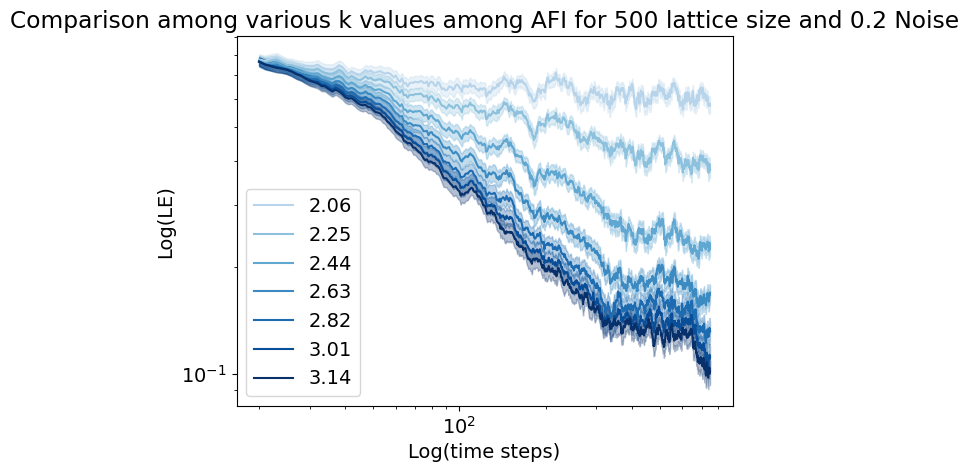

In [165]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array1)), array1[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array2)), array2[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array3)), array3[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

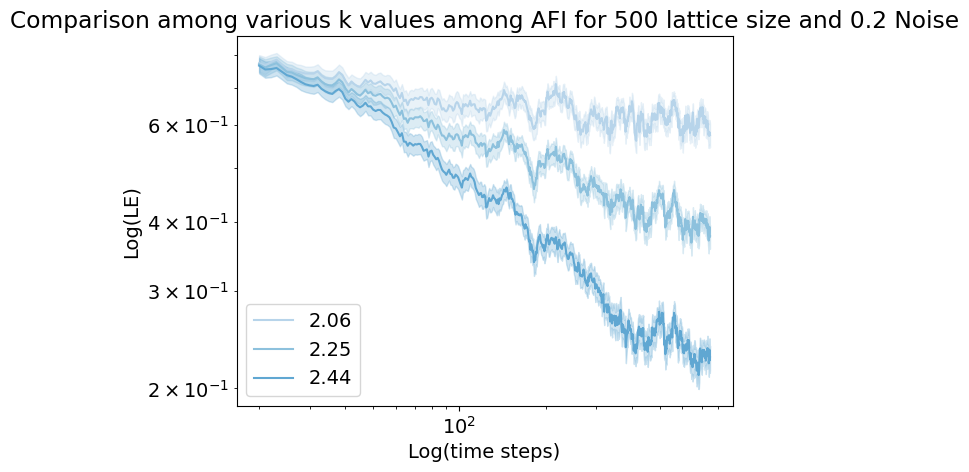

In [166]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array1)), array1[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array2)), array2[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array3)), array3[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

#plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.63', color=colors[3])
#plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.82', color=colors[4])
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[4])

#plt.loglog(np.arange(20, len(array6)), array6[20:], label='3.01', color=colors[5])
#plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[5])

#plt.loglog(np.arange(20, len(array7)), array7[20:], label='3.14', color=colors[6])
#plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

In [167]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array1)), array1[20:], label='array1', color=colors[0])
plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array2)), array2[20:], label='array2', color=colors[1])
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array3)), array3[20:], label='array3', color=colors[2])
plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array4)), array4[20:], label='array4', color=colors[3])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='array5', color=colors[4])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='array6', color=colors[5])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='array7', color=colors[6])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[6])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='array8', color=colors[7])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[7])

plt.loglog(np.arange(20, len(array9)), array9[20:], label='array9', color=colors[8])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[8])

plt.loglog(np.arange(20, len(array10)), array10[20:], label='array10', color=colors[9])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[9])

plt.loglog(np.arange(20, len(array11)), array11[20:], label='array11', color=colors[10 % len(colors)])
plt.fill_between(np.arange(20, len(array11)), array11[20:] - standard_error11[20:], array11[20:] + standard_error11[20:], alpha=0.3, color=colors[10 % len(colors)])

plt.loglog(np.arange(20, len(array12)), array12[20:], label='array12', color=colors[11 % len(colors)])
plt.fill_between(np.arange(20, len(array12)), array12[20:] - standard_error12[20:], array12[20:] + standard_error12[20:], alpha=0.3, color=colors[11 % len(colors)])

plt.loglog(np.arange(20, len(array13)), array13[20:], label='array13', color=colors[12 % len(colors)])
plt.fill_between(np.arange(20, len(array13)), array13[20:] - standard_error13[20:], array13[20:] + standard_error13[20:], alpha=0.3, color=colors[12 % len(colors)])

plt.loglog(np.arange(20, len(array14)), array14[20:], label='array14', color=colors[13 % len(colors)])
plt.fill_between(np.arange(20, len(array14)), array14[20:] - standard_error14[20:], array14[20:] + standard_error14[20:], alpha=0.3, color=colors[13 % len(colors)])

plt.loglog(np.arange(20, len(array15)), array15[20:], label='array15', color=colors[14 % len(colors)])
plt.fill_between(np.arange(20, len(array15)), array15[20:] - standard_error15[20:], array15[20:] + standard_error15[20:], alpha=0.3, color=colors[14 % len(colors)])

plt.loglog(np.arange(20, len(array16)), array16[20:], label='array16', color=colors[15 % len(colors)])
plt.fill_between(np.arange(20, len(array16)), array16[20:] - standard_error16[20:], array16[20:] + standard_error16[20:], alpha=0.3, color=colors[15 % len(colors)])

plt.loglog(np.arange(20, len(array17)), array17[20:], label='array17', color=colors[16 % len(colors)])
plt.fill_between(np.arange(20, len(array17)), array17[20:] - standard_error17[20:], array17[20:] + standard_error17[20:], alpha=0.3, color=colors[16 % len(colors)])

plt.loglog(np.arange(20, len(array18)), array18[20:], label='array18', color=colors[17 % len(colors)])
plt.fill_between(np.arange(20, len(array18)), array18[20:] - standard_error18[20:], array18[20:] + standard_error18[20:], alpha=0.3, color=colors[17 % len(colors)])

plt.loglog(np.arange(20, len(array19)), array19[20:], label='array19', color=colors[18 % len(colors)])
plt.fill_between(np.arange(20, len(array19)), array19[20:] - standard_error19[20:], array19[20:] + standard_error19[20:], alpha=0.3, color=colors[18 % len(colors)])

plt.loglog(np.arange(20, len(array20)), array20[20:], label='array20', color=colors[19 % len(colors)])
plt.fill_between(np.arange(20, len(array20)), array20[20:] - standard_error20[20:], array20[20:] + standard_error20[20:], alpha=0.3, color=colors[19 % len(colors)])

#########

plt.loglog(np.arange(20, len(array21)), array21[20:], label='array21', color=colors[20 % len(colors)])
plt.fill_between(np.arange(20, len(array21)), array21[20:] - standard_error21[20:], array21[20:] + standard_error21[20:], alpha=0.3, color=colors[20 % len(colors)])

plt.loglog(np.arange(20, len(array22)), array22[20:], label='array22', color=colors[21 % len(colors)])
plt.fill_between(np.arange(20, len(array22)), array22[20:] - standard_error22[20:], array22[20:] + standard_error22[20:], alpha=0.3, color=colors[21 % len(colors)])

plt.loglog(np.arange(20, len(array23)), array23[20:], label='array23', color=colors[22 % len(colors)])
plt.fill_between(np.arange(20, len(array23)), array23[20:] - standard_error23[20:], array23[20:] + standard_error23[20:], alpha=0.3, color=colors[22 % len(colors)])

plt.loglog(np.arange(20, len(array24)), array24[20:], label='array24', color=colors[23 % len(colors)])
plt.fill_between(np.arange(20, len(array24)), array24[20:] - standard_error24[20:], array24[20:] + standard_error24[20:], alpha=0.3, color=colors[23 % len(colors)])

plt.loglog(np.arange(20, len(array25)), array25[20:], label='array25', color=colors[24 % len(colors)])
plt.fill_between(np.arange(20, len(array25)), array25[20:] - standard_error25[20:], array25[20:] + standard_error25[20:], alpha=0.3, color=colors[24 % len(colors)])

plt.loglog(np.arange(20, len(array26)), array26[20:], label='array26', color=colors[25 % len(colors)])
plt.fill_between(np.arange(20, len(array26)), array26[20:] - standard_error26[20:], array26[20:] + standard_error26[20:], alpha=0.3, color=colors[25 % len(colors)])

plt.loglog(np.arange(20, len(array27)), array27[20:], label='array27', color=colors[26 % len(colors)])
plt.fill_between(np.arange(20, len(array27)), array27[20:] - standard_error27[20:], array27[20:] + standard_error27[20:], alpha=0.3, color=colors[26 % len(colors)])

plt.loglog(np.arange(20, len(array28)), array28[20:], label='array28', color=colors[27 % len(colors)])
plt.fill_between(np.arange(20, len(array28)), array28[20:] - standard_error28[20:], array28[20:] + standard_error28[20:], alpha=0.3, color=colors[27 % len(colors)])

plt.loglog(np.arange(20, len(array29)), array29[20:], label='array29', color=colors[28 % len(colors)])
plt.fill_between(np.arange(20, len(array29)), array29[20:] - standard_error29[20:], array29[20:] + standard_error29[20:], alpha=0.3, color=colors[28 % len(colors)])

plt.loglog(np.arange(20, len(array30)), array30[20:], label='array30', color=colors[29 % len(colors)])
plt.fill_between(np.arange(20, len(array30)), array30[20:] - standard_error30[20:], array30[20:] + standard_error30[20:], alpha=0.3, color=colors[29 % len(colors)])

#########

plt.loglog(np.arange(20, len(array31)), array31[20:], label='array31', color=colors[30 % len(colors)])
plt.fill_between(np.arange(20, len(array31)), array31[20:] - standard_error31[20:], array31[20:] + standard_error31[20:], alpha=0.3, color=colors[30 % len(colors)])

plt.loglog(np.arange(20, len(array32)), array32[20:], label='array32', color=colors[31 % len(colors)])
plt.fill_between(np.arange(20, len(array32)), array32[20:] - standard_error32[20:], array32[20:] + standard_error32[20:], alpha=0.3, color=colors[31 % len(colors)])

plt.loglog(np.arange(20, len(array33)), array33[20:], label='array33', color=colors[32 % len(colors)])
plt.fill_between(np.arange(20, len(array33)), array33[20:] - standard_error33[20:], array33[20:] + standard_error33[20:], alpha=0.3, color=colors[32 % len(colors)])

plt.loglog(np.arange(20, len(array34)), array34[20:], label='array34', color=colors[33 % len(colors)])
plt.fill_between(np.arange(20, len(array34)), array34[20:] - standard_error34[20:], array34[20:] + standard_error34[20:], alpha=0.3, color=colors[33 % len(colors)])

plt.loglog(np.arange(20, len(array35)), array35[20:], label='array35', color=colors[34 % len(colors)])
plt.fill_between(np.arange(20, len(array35)), array35[20:] - standard_error35[20:], array35[20:] + standard_error35[20:], alpha=0.3, color=colors[34 % len(colors)])

plt.loglog(np.arange(20, len(array36)), array36[20:], label='array36', color=colors[35 % len(colors)])
plt.fill_between(np.arange(20, len(array36)), array36[20:] - standard_error36[20:], array36[20:] + standard_error36[20:], alpha=0.3, color=colors[35 % len(colors)])

plt.loglog(np.arange(20, len(array37)), array37[20:], label='array37', color=colors[36 % len(colors)])
plt.fill_between(np.arange(20, len(array37)), array37[20:] - standard_error37[20:], array37[20:] + standard_error37[20:], alpha=0.3, color=colors[36 % len(colors)])

plt.loglog(np.arange(20, len(array38)), array38[20:], label='array38', color=colors[37 % len(colors)])
plt.fill_between(np.arange(20, len(array38)), array38[20:] - standard_error38[20:], array38[20:] + standard_error38[20:], alpha=0.3, color=colors[37 % len(colors)])

plt.loglog(np.arange(20, len(array39)), array39[20:], label='array39', color=colors[38 % len(colors)])
plt.fill_between(np.arange(20, len(array39)), array39[20:] - standard_error39[20:], array39[20:] + standard_error39[20:], alpha=0.3, color=colors[38 % len(colors)])

plt.loglog(np.arange(20, len(array40)), array40[20:], label='array40', color=colors[39 % len(colors)])
plt.fill_between(np.arange(20, len(array40)), array40[20:] - standard_error40[20:], array40[20:] + standard_error40[20:], alpha=0.3, color=colors[39 % len(colors)])

plt.loglog(np.arange(20, len(array41)), array41[20:], label='array41', color=colors[40 % len(colors)])
plt.fill_between(np.arange(20, len(array41)), array41[20:] - standard_error41[20:], array41[20:] + standard_error41[20:], alpha=0.3, color=colors[40 % len(colors)])

plt.loglog(np.arange(20, len(array42)), array42[20:], label='array42', color=colors[41 % len(colors)])
plt.fill_between(np.arange(20, len(array42)), array42[20:] - standard_error42[20:], array42[20:] + standard_error42[20:], alpha=0.3, color=colors[41 % len(colors)])

plt.loglog(np.arange(20, len(array43)), array43[20:], label='array43', color=colors[42 % len(colors)])
plt.fill_between(np.arange(20, len(array43)), array43[20:] - standard_error43[20:], array43[20:] + standard_error43[20:], alpha=0.3, color=colors[42 % len(colors)])

plt.loglog(np.arange(20, len(array44)), array44[20:], label='array44', color=colors[43 % len(colors)])
plt.fill_between(np.arange(20, len(array44)), array44[20:] - standard_error44[20:], array44[20:] + standard_error44[20:], alpha=0.3, color=colors[43 % len(colors)])

plt.loglog(np.arange(20, len(array45)), array45[20:], label='array45', color=colors[44 % len(colors)])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array47)), array47[20:], label='array47', color=colors[45 % len(colors)])
plt.fill_between(np.arange(20, len(array47)), array47[20:] - standard_error47[20:], array47[20:] + standard_error47[20:], alpha=0.3, color=colors[45 % len(colors)])

plt.loglog(np.arange(20, len(array49)), array49[20:], label='array49', color=colors[46 % len(colors)])
plt.fill_between(np.arange(20, len(array49)), array49[20:] - standard_error49[20:], array49[20:] + standard_error49[20:], alpha=0.3, color=colors[46 % len(colors)])

plt.loglog(np.arange(20, len(array51)), array51[20:], label='array51', color=colors[47 % len(colors)])
plt.fill_between(np.arange(20, len(array51)), array51[20:] - standard_error51[20:], array51[20:] + standard_error51[20:], alpha=0.3, color=colors[47 % len(colors)])

plt.loglog(np.arange(20, len(array53)), array53[20:], label='array53', color=colors[48 % len(colors)])
plt.fill_between(np.arange(20, len(array53)), array53[20:] - standard_error53[20:], array53[20:] + standard_error53[20:], alpha=0.3, color=colors[48 % len(colors)])

plt.loglog(np.arange(20, len(array55)), array55[20:], label='array55', color=colors[49 % len(colors)])
plt.fill_between(np.arange(20, len(array55)), array55[20:] - standard_error55[20:], array55[20:] + standard_error55[20:], alpha=0.3, color=colors[49 % len(colors)])


#######

plt.loglog(np.arange(20, len(array58)), array58[20:], label='array58', color=colors[50 % len(colors)])plt.loglog(np.arange(20, len(array58)), array58[20:], label='array58', color=colors[50 % len(colors)])
plt.fill_between(np.arange(20, len(array58)), array58[20:] - standard_error58[20:], array58[20:] + standard_error58[20:], alpha=0.3, color=colors[50 % len(colors)])

plt.loglog(np.arange(20, len(array59)), array59[20:], label='array59', color=colors[51 % len(colors)])
plt.fill_between(np.arange(20, len(array59)), array59[20:] - standard_error59[20:], array59[20:] + standard_error59[20:], alpha=0.3, color=colors[51 % len(colors)])

plt.loglog(np.arange(20, len(array60)), array60[20:], label='array60', color=colors[52 % len(colors)])
plt.fill_between(np.arange(20, len(array60)), array60[20:] - standard_error60[20:], array60[20:] + standard_error60[20:], alpha=0.3, color=colors[52 % len(colors)])

plt.loglog(np.arange(20, len(array61)), array61[20:], label='array61', color=colors[53 % len(colors)])
plt.fill_between(np.arange(20, len(array61)), array61[20:] - standard_error61[20:], array61[20:] + standard_error61[20:], alpha=0.3, color=colors[53 % len(colors)])

plt.loglog(np.arange(20, len(array62)), array62[20:], label='array62', color=colors[54 % len(colors)])
plt.fill_between(np.arange(20, len(array62)), array62[20:] - standard_error62[20:], array62[20:] + standard_error62[20:], alpha=0.3, color=colors[54 % len(colors)])

plt.loglog(np.arange(20, len(array63)), array63[20:], label='array63', color=colors[55 % len(colors)])
plt.fill_between(np.arange(20, len(array63)), array63[20:] - standard_error63[20:], array63[20:] + standard_error63[20:], alpha=0.3, color=colors[55 % len(colors)])

plt.loglog(np.arange(20, len(array64)), array64[20:], label='array64', color=colors[56 % len(colors)])
plt.fill_between(np.arange(20, len(array64)), array64[20:] - standard_error64[20:], array64[20:] + standard_error64[20:], alpha=0.3, color=colors[56 % len(colors)])

plt.loglog(np.arange(20, len(array65)), array65[20:], label='array65', color=colors[57 % len(colors)])
plt.fill_between(np.arange(20, len(array65)), array65[20:] - standard_error65[20:], array65[20:] + standard_error65[20:], alpha=0.3, color=colors[57 % len(colors)])

plt.loglog(np.arange(20, len(array66)), array66[20:], label='array66', color=colors[58 % len(colors)])
plt.fill_between(np.arange(20, len(array66)), array66[20:] - standard_error66[20:], array66[20:] + standard_error66[20:], alpha=0.3, color=colors[58 % len(colors)])

plt.loglog(np.arange(20, len(array67)), array67[20:], label='array67', color=colors[59 % len(colors)])
plt.fill_between(np.arange(20, len(array67)), array67[20:] - standard_error67[20:], array67[20:] + standard_error67[20:], alpha=0.3, color=colors[59 % len(colors)])

plt.loglog(np.arange(20, len(array68)), array68[20:], label='array68', color=colors[60 % len(colors)])
plt.fill_between(np.arange(20, len(array68)), array68[20:] - standard_error68[20:], array68[20:] + standard_error68[20:], alpha=0.3, color=colors[60 % len(colors)])

plt.loglog(np.arange(20, len(array69)), array69[20:], label='array69', color=colors[61 % len(colors)])
plt.fill_between(np.arange(20, len(array69)), array69[20:] - standard_error69[20:], array69[20:] + standard_error69[20:], alpha=0.3, color=colors[61 % len(colors)])

plt.loglog(np.arange(20, len(array70)), array70[20:], label='array70', color=colors[62 % len(colors)])
plt.fill_between(np.arange(20, len(array70)), array70[20:] - standard_error70[20:], array70[20:] + standard_error70[20:], alpha=0.3, color=colors[62 % len(colors)])

plt.loglog(np.arange(20, len(array71)), array71[20:], label='array71', color=colors[63 % len(colors)])
plt.fill_between(np.arange(20, len(array71)), array71[20:] - standard_error71[20:], array71[20:] + standard_error71[20:], alpha=0.3, color=colors[63 % len(colors)])

plt.loglog(np.arange(20, len(array72)), array72[20:], label='array72', color=colors[64 % len(colors)])
plt.fill_between(np.arange(20, len(array72)), array72[20:] - standard_error72[20:], array72[20:] + standard_error72[20:], alpha=0.3, color=colors[64 % len(colors)])

plt.loglog(np.arange(20, len(array73)), array73[20:], label='array73', color=colors[65 % len(colors)])
plt.fill_between(np.arange(20, len(array73)), array73[20:] - standard_error73[20:], array73[20:] + standard_error73[20:], alpha=0.3, color=colors[65 % len(colors)])

plt.loglog(np.arange(20, len(array74)), array74[20:], label='array74', color=colors[66 % len(colors)])
plt.fill_between(np.arange(20, len(array74)), array74[20:] - standard_error74[20:], array74[20:] + standard_error74[20:], alpha=0.3, color=colors[66 % len(colors)])

plt.loglog(np.arange(20, len(array75)), array75[20:], label='array75', color=colors[67 % len(colors)])
plt.fill_between(np.arange(20, len(array75)), array75[20:] - standard_error75[20:], array75[20:] + standard_error75[20:], alpha=0.3, color=colors[67 % len(colors)])

plt.loglog(np.arange(20, len(array76)), array76[20:], label='array76', color=colors[68 % len(colors)])
plt.fill_between(np.arange(20, len(array76)), array76[20:] - standard_error76[20:], array76[20:] + standard_error76[20:], alpha=0.3, color=colors[68 % len(colors)])

plt.loglog(np.arange(20, len(array77)), array77[20:], label='array77', color=colors[69 % len(colors)])
plt.fill_between(np.arange(20, len(array77)), array77[20:] - standard_error77[20:], array77[20:] + standard_error77[20:], alpha=0.3, color=colors[69 % len(colors)])

plt.loglog(np.arange(20, len(array78)), array78[20:], label='array78', color=colors[70 % len(colors)])
plt.fill_between(np.arange(20, len(array78)), array78[20:] - standard_error78[20:], array78[20:] + standard_error78[20:], alpha=0.3, color=colors[70 % len(colors)])

plt.loglog(np.arange(20, len(array79)), array79[20:], label='array79', color=colors[71 % len(colors)])
plt.fill_between(np.arange(20, len(array79)), array79[20:] - standard_error79[20:], array79[20:] + standard_error79[20:], alpha=0.3, color=colors[71 % len(colors)])

plt.loglog(np.arange(20, len(array80)), array80[20:], label='array80', color=colors[72 % len(colors)])
plt.fill_between(np.arange(20, len(array80)), array80[20:] - standard_error80[20:], array80[20:] + standard_error80[20:], alpha=0.3, color=colors[72 % len(colors)])

plt.loglog(np.arange(20, len(array81)), array81[20:], label='array81', color=colors[73 % len(colors)])
plt.fill_between(np.arange(20, len(array81)), array81[20:] - standard_error81[20:], array81[20:] + standard_error81[20:], alpha=0.3, color=colors[73 % len(colors)])

plt.loglog(np.arange(20, len(array82)), array82[20:], label='array82', color=colors[74 % len(colors)])
plt.fill_between(np.arange(20, len(array82)), array82[20:] - standard_error82[20:], array82[20:] + standard_error82[20:], alpha=0.3, color=colors[74 % len(colors)])

plt.loglog(np.arange(20, len(array83)), array83[20:], label='array83', color=colors[75 % len(colors)])
plt.fill_between(np.arange(20, len(array83)), array83[20:] - standard_error83[20:], array83[20:] + standard_error83[20:], alpha=0.3, color=colors[75 % len(colors)])

plt.loglog(np.arange(20, len(array84)), array84[20:], label='array84', color=colors[76 % len(colors)])
plt.fill_between(np.arange(20, len(array84)), array84[20:] - standard_error84[20:], array84[20:] + standard_error84[20:], alpha=0.3, color=colors[76 % len(colors)])

plt.loglog(np.arange(20, len(array85)), array85[20:], label='array85', color=colors[77 % len(colors)])
plt.fill_between(np.arange(20, len(array85)), array85[20:] - standard_error85[20:], array85[20:] + standard_error85[20:], alpha=0.3, color=colors[77 % len(colors)])

plt.loglog(np.arange(20, len(array86)), array86[20:], label='array86', color=colors[78 % len(colors)])
plt.fill_between(np.arange(20, len(array86)), array86[20:] - standard_error86[20:], array86[20:] + standard_error86[20:], alpha=0.3, color=colors[78 % len(colors)])

plt.fill_between(np.arange(20, len(array58)), array58[20:] - standard_error58[20:], array58[20:] + standard_error58[20:], alpha=0.3, color=colors[50 % len(colors)])

plt.loglog(np.arange(20, len(array59)), array59[20:], label='array59', color=colors[51 % len(colors)])
plt.fill_between(np.arange(20, len(array59)), array59[20:] - standard_error59[20:], array59[20:] + standard_error59[20:], alpha=0.3, color=colors[51 % len(colors)])
plt.loglog
plt.fill_between(np.arange(20, len(array86)), array86[20:] - standard_error86[20:], array86[20:] + standard_error86[20:], alpha=0.3, color=colors[78 % len(colors)])
plt.loglog(np.arange(20, len(array86)), array86[20:], label='array86', color=colors[78 % len(colors)])

plt.fill_between(np.arange(20, len(array85)), array85[20:] - standard_error85[20:], array85[20:] + standard_error85[20:], alpha=0.3, color=colors[77 % len(colors)])
plt.loglog(np.arange(20, len(array85)), array85[20:], label='array85', color=colors[77 % len(colors)])

plt.fill_between(np.arange(20, len(array84)), array84[20:] - standard_error84[20:], array84[20:] + standard_error84[20:], alpha=0.3, color=colors[76 % len(colors)])
plt.loglog(np.arange(20, len(array84)), array84[20:], label='array84', color=colors[76 % len(colors)])

plt.fill_between(np.arange(20, len(array83)), array83[20:] - standard_error83[20:], array83[20:] + standard_error83[20:], alpha=0.3, color=colors[75 % len(colors)])
plt.loglog(np.arange(20, len(array83)), array83[20:], label='array83', color=colors[75 % len(colors)])

plt.fill_between(np.arange(20, len(array82)), array82[20:] - standard_error82[20:], array82[20:] + standard_error82[20:], alpha=0.3, color=colors[74 % len(colors)])
plt.loglog(np.arange(20, len(array82)), array82[20:], label='array82', color=colors[74 % len(colors)])

plt.fill_between(np.arange(20, len(array81)), array81[20:] - standard_error81[20:], array81[20:] + standard_error81[20:], alpha=0.3, color=colors[73 % len(colors)])
plt.loglog(np.arange(20, len(array81)), array81[20:], label='array81', color=colors[73 % len(colors)])

plt.fill_between(np.arange(20, len(array80)), array80[20:] - standard_error80[20:], array80[20:] + standard_error80[20:], alpha=0.3, color=colors[72 % len(colors)])
plt.loglog(np.arange(20, len(array80)), array80[20:], label='array80', color=colors[72 % len(colors)])

plt.fill_between(np.arange(20, len(array79)), array79[20:] - standard_error79[20:], array79[20:] + standard_error79[20:], alpha=0.3, color=colors[71 % len(colors)])
plt.loglog(np.arange(20, len(array79)), array79[20:], label='array79', color=colors[71 % len(colors)])

plt.fill_between(np.arange(20, len(array78)), array78[20:] - standard_error78[20:], array78[20:] + standard_error78[20:], alpha=0.3, color=colors[70 % len(colors)])
plt.loglog(np.arange(20, len(array78)), array78[20:], label='array78', color=colors[70 % len(colors)])

plt.fill_between(np.arange(20, len(array77)), array77[20:] - standard_error77[20:], array77[20:] + standard_error77[20:], alpha=0.3, color=colors[69 % len(colors)])
plt.loglog(np.arange(20, len(array77)), array77[20:], label='array77', color=colors[69 % len(colors)])

plt.fill_between(np.arange(20, len(array76)), array76[20:] - standard_error76[20:], array76[20:] + standard_error76[20:], alpha=0.3, color=colors[68 % len(colors)])
plt.loglog(np.arange(20, len(array76)), array76[20:], label='array76', color=colors[68 % len(colors)])

plt.fill_between(np.arange(20, len(array75)), array75[20:] - standard_error75[20:], array75[20:] + standard_error75[20:], alpha=0.3, color=colors[67 % len(colors)])
plt.loglog(np.arange(20, len(array75)), array75[20:], label='array75', color=colors[67 % len(colors)])

plt.fill_between(np.arange(20, len(array74)), array74[20:] - standard_error74[20:], array74[20:] + standard_error74[20:], alpha=0.3, color=colors[66 % len(colors)])
plt.loglog(np.arange(20, len(array74)), array74[20:], label='array74', color=colors[66 % len(colors)])

plt.fill_between(np.arange(20, len(array73)), array73[20:] - standard_error73[20:], array73[20:] + standard_error73[20:], alpha=0.3, color=colors[65 % len(colors)])
plt.loglog(np.arange(20, len(array73)), array73[20:], label='array73', color=colors[65 % len(colors)])

plt.fill_between(np.arange(20, len(array72)), array72[20:] - standard_error72[20:], array72[20:] + standard_error72[20:], alpha=0.3, color=colors[64 % len(colors)])
plt.loglog(np.arange(20, len(array72)), array72[20:], label='array72', color=colors[64 % len(colors)])

plt.fill_between(np.arange(20, len(array71)), array71[20:] - standard_error71[20:], array71[20:] + standard_error71[20:], alpha=0.3, color=colors[63 % len(colors)])
plt.loglog(np.arange(20, len(array71)), array71[20:], label='array71', color=colors[63 % len(colors)])

plt.fill_between(np.arange(20, len(array70)), array70[20:] - standard_error70[20:], array70[20:] + standard_error70[20:], alpha=0.3, color=colors[62 % len(colors)])
plt.loglog(np.arange(20, len(array70)), array70[20:], label='array70', color=colors[62 % len(colors)])

plt.fill_between(np.arange(20, len(array69)), array69[20:] - standard_error69[20:], array69[20:] + standard_error69[20:], alpha=0.3, color=colors[61 % len(colors)])
plt.loglog(np.arange(20, len(array69)), array69[20:], label='array69', color=colors[61 % len(colors)])

plt.fill_between(np.arange(20, len(array68)), array68[20:] - standard_error68[20:], array68[20:] + standard_error68[20:], alpha=0.3, color=colors[60 % len(colors)])
plt.loglog(np.arange(20, len(array68)), array68[20:], label='array68', color=colors[60 % len(colors)])

plt.fill_between(np.arange(20, len(array67)), array67[20:] - standard_error67[20:], array67[20:] + standard_error67[20:], alpha=0.3, color=colors[59 % len(colors)])
plt.loglog(np.arange(20, len(array67)), array67[20:], label='array67', color=colors[59 % len(colors)])

plt.fill_between(np.arange(20, len(array66)), array66[20:] - standard_error66[20:], array66[20:] + standard_error66[20:], alpha=0.3, color=colors[58 % len(colors)])
plt.loglog(np.arange(20, len(array66)), array66[20:], label='array66', color=colors[58 % len(colors)])

plt.fill_between(np.arange(20, len(array65)), array65[20:] - standard_error65[20:], array65[20:] + standard_error65[20:], alpha=0.3, color=colors[57 % len(colors)])
plt.loglog(np.arange(20, len(array65)), array65[20:], label='array65', color=colors[57 % len(colors)])

plt.fill_between(np.arange(20, len(array64)), array64[20:] - standard_error64[20:], array64[20:] + standard_error64[20:], alpha=0.3, color=colors[56 % len(colors)])
plt.loglog(np.arange(20, len(array64)), array64[20:], label='array64', color=colors[56 % len(colors)])

plt.fill_between(np.arange(20, len(array63)), array63[20:] - standard_error63[20:], array63[20:] + standard_error63[20:], alpha=0.3, color=colors[55 % len(colors)])
plt.loglog(np.arange(20, len(array63)), array63[20:], label='array63', color=colors[55 % len(colors)])

plt.fill_between(np.arange(20, len(array62)), array62[20:] - standard_error62[20:], array62[20:] + standard_error62[20:], alpha=0.3, color=colors[54 % len(colors)])
plt.loglog(np.arange(20, len(array62)), array62[20:], label='array62', color=colors[54 % len(colors)])

plt.fill_between(np.arange(20, len(array61)), array61[20:] - standard_error61[20:], array61[20:] + standard_error61[20:], alpha=0.3, color=colors[53 % len(colors)])
plt.loglog(np.arange(20, len(array61)), array61[20:], label='array61', color=colors[53 % len(colors)])

plt.fill_between(np.arange(20, len(array60)), array60[20:] - standard_error60[20:], array60[20:] + standard_error60[20:], alpha=0.3, color=colors[52 % len(colors)])

plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()

SyntaxError: invalid syntax (1893121920.py, line 160)

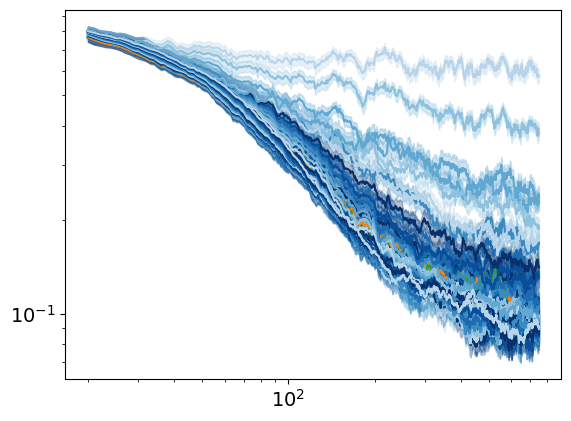

In [168]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array1)), array1[20:], label='array1', color=colors[0])
plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array2)), array2[20:], label='array2', color=colors[1])
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array3)), array3[20:], label='array3', color=colors[2])
plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array4)), array4[20:], label='array4', color=colors[3])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='array5', color=colors[4])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='array6', color=colors[5])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='array7', color=colors[6])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[6])

plt.loglog(np.arange(20, len(array8)), array8[20:], label='array8')
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3)

plt.loglog(np.arange(20, len(array9)), array9[20:], label='array9')
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3)

plt.loglog(np.arange(20, len(array10)), array10[20:], label='array10')
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3)

plt.loglog(np.arange(20, len(array11)), array11[20:], label='array11', color=colors[10 % len(colors)])
plt.fill_between(np.arange(20, len(array11)), array11[20:] - standard_error11[20:], array11[20:] + standard_error11[20:], alpha=0.3, color=colors[10 % len(colors)])

plt.loglog(np.arange(20, len(array12)), array12[20:], label='array12', color=colors[11 % len(colors)])
plt.fill_between(np.arange(20, len(array12)), array12[20:] - standard_error12[20:], array12[20:] + standard_error12[20:], alpha=0.3, color=colors[11 % len(colors)])

plt.loglog(np.arange(20, len(array13)), array13[20:], label='array13', color=colors[12 % len(colors)])
plt.fill_between(np.arange(20, len(array13)), array13[20:] - standard_error13[20:], array13[20:] + standard_error13[20:], alpha=0.3, color=colors[12 % len(colors)])

plt.loglog(np.arange(20, len(array14)), array14[20:], label='array14', color=colors[13 % len(colors)])
plt.fill_between(np.arange(20, len(array14)), array14[20:] - standard_error14[20:], array14[20:] + standard_error14[20:], alpha=0.3, color=colors[13 % len(colors)])

plt.loglog(np.arange(20, len(array15)), array15[20:], label='array15', color=colors[14 % len(colors)])
plt.fill_between(np.arange(20, len(array15)), array15[20:] - standard_error15[20:], array15[20:] + standard_error15[20:], alpha=0.3, color=colors[14 % len(colors)])

plt.loglog(np.arange(20, len(array16)), array16[20:], label='array16', color=colors[15 % len(colors)])
plt.fill_between(np.arange(20, len(array16)), array16[20:] - standard_error16[20:], array16[20:] + standard_error16[20:], alpha=0.3, color=colors[15 % len(colors)])

plt.loglog(np.arange(20, len(array17)), array17[20:], label='array17', color=colors[16 % len(colors)])
plt.fill_between(np.arange(20, len(array17)), array17[20:] - standard_error17[20:], array17[20:] + standard_error17[20:], alpha=0.3, color=colors[16 % len(colors)])

plt.loglog(np.arange(20, len(array18)), array18[20:], label='array18', color=colors[17 % len(colors)])
plt.fill_between(np.arange(20, len(array18)), array18[20:] - standard_error18[20:], array18[20:] + standard_error18[20:], alpha=0.3, color=colors[17 % len(colors)])

plt.loglog(np.arange(20, len(array19)), array19[20:], label='array19', color=colors[18 % len(colors)])
plt.fill_between(np.arange(20, len(array19)), array19[20:] - standard_error19[20:], array19[20:] + standard_error19[20:], alpha=0.3, color=colors[18 % len(colors)])

plt.loglog(np.arange(20, len(array20)), array20[20:], label='array20', color=colors[19 % len(colors)])
plt.fill_between(np.arange(20, len(array20)), array20[20:] - standard_error20[20:], array20[20:] + standard_error20[20:], alpha=0.3, color=colors[19 % len(colors)])

#########

plt.loglog(np.arange(20, len(array21)), array21[20:], label='array21', color=colors[20 % len(colors)])
plt.fill_between(np.arange(20, len(array21)), array21[20:] - standard_error21[20:], array21[20:] + standard_error21[20:], alpha=0.3, color=colors[20 % len(colors)])

plt.loglog(np.arange(20, len(array22)), array22[20:], label='array22', color=colors[21 % len(colors)])
plt.fill_between(np.arange(20, len(array22)), array22[20:] - standard_error22[20:], array22[20:] + standard_error22[20:], alpha=0.3, color=colors[21 % len(colors)])

plt.loglog(np.arange(20, len(array23)), array23[20:], label='array23', color=colors[22 % len(colors)])
plt.fill_between(np.arange(20, len(array23)), array23[20:] - standard_error23[20:], array23[20:] + standard_error23[20:], alpha=0.3, color=colors[22 % len(colors)])

plt.loglog(np.arange(20, len(array24)), array24[20:], label='array24', color=colors[23 % len(colors)])
plt.fill_between(np.arange(20, len(array24)), array24[20:] - standard_error24[20:], array24[20:] + standard_error24[20:], alpha=0.3, color=colors[23 % len(colors)])

plt.loglog(np.arange(20, len(array25)), array25[20:], label='array25', color=colors[24 % len(colors)])
plt.fill_between(np.arange(20, len(array25)), array25[20:] - standard_error25[20:], array25[20:] + standard_error25[20:], alpha=0.3, color=colors[24 % len(colors)])

plt.loglog(np.arange(20, len(array26)), array26[20:], label='array26', color=colors[25 % len(colors)])
plt.fill_between(np.arange(20, len(array26)), array26[20:] - standard_error26[20:], array26[20:] + standard_error26[20:], alpha=0.3, color=colors[25 % len(colors)])

plt.loglog(np.arange(20, len(array27)), array27[20:], label='array27', color=colors[26 % len(colors)])
plt.fill_between(np.arange(20, len(array27)), array27[20:] - standard_error27[20:], array27[20:] + standard_error27[20:], alpha=0.3, color=colors[26 % len(colors)])

plt.loglog(np.arange(20, len(array28)), array28[20:], label='array28', color=colors[27 % len(colors)])
plt.fill_between(np.arange(20, len(array28)), array28[20:] - standard_error28[20:], array28[20:] + standard_error28[20:], alpha=0.3, color=colors[27 % len(colors)])

plt.loglog(np.arange(20, len(array29)), array29[20:], label='array29', color=colors[28 % len(colors)])
plt.fill_between(np.arange(20, len(array29)), array29[20:] - standard_error29[20:], array29[20:] + standard_error29[20:], alpha=0.3, color=colors[28 % len(colors)])

plt.loglog(np.arange(20, len(array30)), array30[20:], label='array30', color=colors[29 % len(colors)])
plt.fill_between(np.arange(20, len(array30)), array30[20:] - standard_error30[20:], array30[20:] + standard_error30[20:], alpha=0.3, color=colors[29 % len(colors)])

#########

plt.loglog(np.arange(20, len(array31)), array31[20:], label='array31', color=colors[30 % len(colors)])
plt.fill_between(np.arange(20, len(array31)), array31[20:] - standard_error31[20:], array31[20:] + standard_error31[20:], alpha=0.3, color=colors[30 % len(colors)])

plt.loglog(np.arange(20, len(array32)), array32[20:], label='array32', color=colors[31 % len(colors)])
plt.fill_between(np.arange(20, len(array32)), array32[20:] - standard_error32[20:], array32[20:] + standard_error32[20:], alpha=0.3, color=colors[31 % len(colors)])

plt.loglog(np.arange(20, len(array33)), array33[20:], label='array33', color=colors[32 % len(colors)])
plt.fill_between(np.arange(20, len(array33)), array33[20:] - standard_error33[20:], array33[20:] + standard_error33[20:], alpha=0.3, color=colors[32 % len(colors)])

plt.loglog(np.arange(20, len(array34)), array34[20:], label='array34', color=colors[33 % len(colors)])
plt.fill_between(np.arange(20, len(array34)), array34[20:] - standard_error34[20:], array34[20:] + standard_error34[20:], alpha=0.3, color=colors[33 % len(colors)])

plt.loglog(np.arange(20, len(array35)), array35[20:], label='array35', color=colors[34 % len(colors)])
plt.fill_between(np.arange(20, len(array35)), array35[20:] - standard_error35[20:], array35[20:] + standard_error35[20:], alpha=0.3, color=colors[34 % len(colors)])

plt.loglog(np.arange(20, len(array36)), array36[20:], label='array36', color=colors[35 % len(colors)])
plt.fill_between(np.arange(20, len(array36)), array36[20:] - standard_error36[20:], array36[20:] + standard_error36[20:], alpha=0.3, color=colors[35 % len(colors)])

plt.loglog(np.arange(20, len(array37)), array37[20:], label='array37', color=colors[36 % len(colors)])
plt.fill_between(np.arange(20, len(array37)), array37[20:] - standard_error37[20:], array37[20:] + standard_error37[20:], alpha=0.3, color=colors[36 % len(colors)])

plt.loglog(np.arange(20, len(array38)), array38[20:], label='array38', color=colors[37 % len(colors)])
plt.fill_between(np.arange(20, len(array38)), array38[20:] - standard_error38[20:], array38[20:] + standard_error38[20:], alpha=0.3, color=colors[37 % len(colors)])

plt.loglog(np.arange(20, len(array39)), array39[20:], label='array39', color=colors[38 % len(colors)])
plt.fill_between(np.arange(20, len(array39)), array39[20:] - standard_error39[20:], array39[20:] + standard_error39[20:], alpha=0.3, color=colors[38 % len(colors)])

plt.loglog(np.arange(20, len(array40)), array40[20:], label='array40', color=colors[39 % len(colors)])
plt.fill_between(np.arange(20, len(array40)), array40[20:] - standard_error40[20:], array40[20:] + standard_error40[20:], alpha=0.3, color=colors[39 % len(colors)])

plt.loglog(np.arange(20, len(array41)), array41[20:], label='array41', color=colors[40 % len(colors)])
plt.fill_between(np.arange(20, len(array41)), array41[20:] - standard_error41[20:], array41[20:] + standard_error41[20:], alpha=0.3, color=colors[40 % len(colors)])

plt.loglog(np.arange(20, len(array42)), array42[20:], label='array42', color=colors[41 % len(colors)])
plt.fill_between(np.arange(20, len(array42)), array42[20:] - standard_error42[20:], array42[20:] + standard_error42[20:], alpha=0.3, color=colors[41 % len(colors)])

plt.loglog(np.arange(20, len(array43)), array43[20:], label='array43', color=colors[42 % len(colors)])
plt.fill_between(np.arange(20, len(array43)), array43[20:] - standard_error43[20:], array43[20:] + standard_error43[20:], alpha=0.3, color=colors[42 % len(colors)])

plt.loglog(np.arange(20, len(array44)), array44[20:], label='array44', color=colors[43 % len(colors)])
plt.fill_between(np.arange(20, len(array44)), array44[20:] - standard_error44[20:], array44[20:] + standard_error44[20:], alpha=0.3, color=colors[43 % len(colors)])

plt.loglog(np.arange(20, len(array45)), array45[20:], label='array45', color=colors[44 % len(colors)])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array47)), array47[20:], label='array47', color=colors[45 % len(colors)])
plt.fill_between(np.arange(20, len(array47)), array47[20:] - standard_error47[20:], array47[20:] + standard_error47[20:], alpha=0.3, color=colors[45 % len(colors)])

plt.loglog(np.arange(20, len(array49)), array49[20:], label='array49', color=colors[46 % len(colors)])
plt.fill_between(np.arange(20, len(array49)), array49[20:] - standard_error49[20:], array49[20:] + standard_error49[20:], alpha=0.3, color=colors[46 % len(colors)])

plt.loglog(np.arange(20, len(array51)), array51[20:], label='array51', color=colors[47 % len(colors)])
plt.fill_between(np.arange(20, len(array51)), array51[20:] - standard_error51[20:], array51[20:] + standard_error51[20:], alpha=0.3, color=colors[47 % len(colors)])

plt.loglog(np.arange(20, len(array53)), array53[20:], label='array53', color=colors[48 % len(colors)])
plt.fill_between(np.arange(20, len(array53)), array53[20:] - standard_error53[20:], array53[20:] + standard_error53[20:], alpha=0.3, color=colors[48 % len(colors)])

plt.loglog(np.arange(20, len(array55)), array55[20:], label='array55', color=colors[49 % len(colors)])
plt.fill_between(np.arange(20, len(array55)), array55[20:] - standard_error55[20:], array55[20:] + standard_error55[20:], alpha=0.3, color=colors[49 % len(colors)])


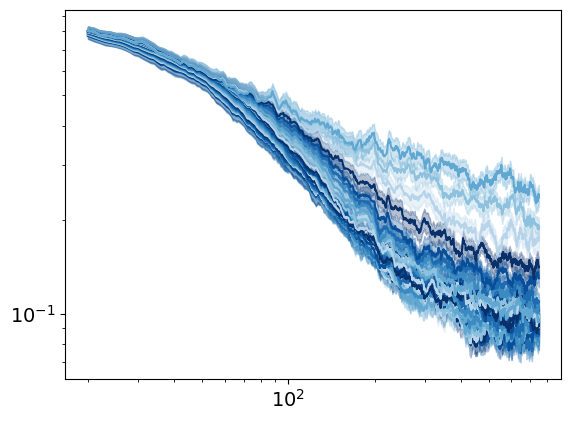

In [169]:
plt.loglog(np.arange(20, len(array12)), array12[20:], label='array12', color=colors[11 % len(colors)])
plt.fill_between(np.arange(20, len(array12)), array12[20:] - standard_error12[20:], array12[20:] + standard_error12[20:], alpha=0.3, color=colors[11 % len(colors)])

plt.loglog(np.arange(20, len(array13)), array13[20:], label='array13', color=colors[12 % len(colors)])
plt.fill_between(np.arange(20, len(array13)), array13[20:] - standard_error13[20:], array13[20:] + standard_error13[20:], alpha=0.3, color=colors[12 % len(colors)])

plt.loglog(np.arange(20, len(array14)), array14[20:], label='array14', color=colors[13 % len(colors)])
plt.fill_between(np.arange(20, len(array14)), array14[20:] - standard_error14[20:], array14[20:] + standard_error14[20:], alpha=0.3, color=colors[13 % len(colors)])

plt.loglog(np.arange(20, len(array15)), array15[20:], label='array15', color=colors[14 % len(colors)])
plt.fill_between(np.arange(20, len(array15)), array15[20:] - standard_error15[20:], array15[20:] + standard_error15[20:], alpha=0.3, color=colors[14 % len(colors)])

plt.loglog(np.arange(20, len(array16)), array16[20:], label='array16', color=colors[15 % len(colors)])
plt.fill_between(np.arange(20, len(array16)), array16[20:] - standard_error16[20:], array16[20:] + standard_error16[20:], alpha=0.3, color=colors[15 % len(colors)])

plt.loglog(np.arange(20, len(array17)), array17[20:], label='array17', color=colors[16 % len(colors)])
plt.fill_between(np.arange(20, len(array17)), array17[20:] - standard_error17[20:], array17[20:] + standard_error17[20:], alpha=0.3, color=colors[16 % len(colors)])

plt.loglog(np.arange(20, len(array18)), array18[20:], label='array18', color=colors[17 % len(colors)])
plt.fill_between(np.arange(20, len(array18)), array18[20:] - standard_error18[20:], array18[20:] + standard_error18[20:], alpha=0.3, color=colors[17 % len(colors)])

plt.loglog(np.arange(20, len(array19)), array19[20:], label='array19', color=colors[18 % len(colors)])
plt.fill_between(np.arange(20, len(array19)), array19[20:] - standard_error19[20:], array19[20:] + standard_error19[20:], alpha=0.3, color=colors[18 % len(colors)])

plt.loglog(np.arange(20, len(array20)), array20[20:], label='array20', color=colors[19 % len(colors)])
plt.fill_between(np.arange(20, len(array20)), array20[20:] - standard_error20[20:], array20[20:] + standard_error20[20:], alpha=0.3, color=colors[19 % len(colors)])

#########

plt.loglog(np.arange(20, len(array21)), array21[20:], label='array21', color=colors[20 % len(colors)])
plt.fill_between(np.arange(20, len(array21)), array21[20:] - standard_error21[20:], array21[20:] + standard_error21[20:], alpha=0.3, color=colors[20 % len(colors)])

plt.loglog(np.arange(20, len(array22)), array22[20:], label='array22', color=colors[21 % len(colors)])
plt.fill_between(np.arange(20, len(array22)), array22[20:] - standard_error22[20:], array22[20:] + standard_error22[20:], alpha=0.3, color=colors[21 % len(colors)])

plt.loglog(np.arange(20, len(array23)), array23[20:], label='array23', color=colors[22 % len(colors)])
plt.fill_between(np.arange(20, len(array23)), array23[20:] - standard_error23[20:], array23[20:] + standard_error23[20:], alpha=0.3, color=colors[22 % len(colors)])

plt.loglog(np.arange(20, len(array24)), array24[20:], label='array24', color=colors[23 % len(colors)])
plt.fill_between(np.arange(20, len(array24)), array24[20:] - standard_error24[20:], array24[20:] + standard_error24[20:], alpha=0.3, color=colors[23 % len(colors)])

plt.loglog(np.arange(20, len(array25)), array25[20:], label='array25', color=colors[24 % len(colors)])
plt.fill_between(np.arange(20, len(array25)), array25[20:] - standard_error25[20:], array25[20:] + standard_error25[20:], alpha=0.3, color=colors[24 % len(colors)])

plt.loglog(np.arange(20, len(array26)), array26[20:], label='array26', color=colors[25 % len(colors)])
plt.fill_between(np.arange(20, len(array26)), array26[20:] - standard_error26[20:], array26[20:] + standard_error26[20:], alpha=0.3, color=colors[25 % len(colors)])

plt.loglog(np.arange(20, len(array27)), array27[20:], label='array27', color=colors[26 % len(colors)])
plt.fill_between(np.arange(20, len(array27)), array27[20:] - standard_error27[20:], array27[20:] + standard_error27[20:], alpha=0.3, color=colors[26 % len(colors)])

plt.loglog(np.arange(20, len(array28)), array28[20:], label='array28', color=colors[27 % len(colors)])
plt.fill_between(np.arange(20, len(array28)), array28[20:] - standard_error28[20:], array28[20:] + standard_error28[20:], alpha=0.3, color=colors[27 % len(colors)])

plt.loglog(np.arange(20, len(array29)), array29[20:], label='array29', color=colors[28 % len(colors)])
plt.fill_between(np.arange(20, len(array29)), array29[20:] - standard_error29[20:], array29[20:] + standard_error29[20:], alpha=0.3, color=colors[28 % len(colors)])

plt.loglog(np.arange(20, len(array30)), array30[20:], label='array30', color=colors[29 % len(colors)])
plt.fill_between(np.arange(20, len(array30)), array30[20:] - standard_error30[20:], array30[20:] + standard_error30[20:], alpha=0.3, color=colors[29 % len(colors)])

#########

plt.loglog(np.arange(20, len(array31)), array31[20:], label='array31', color=colors[30 % len(colors)])
plt.fill_between(np.arange(20, len(array31)), array31[20:] - standard_error31[20:], array31[20:] + standard_error31[20:], alpha=0.3, color=colors[30 % len(colors)])

plt.loglog(np.arange(20, len(array32)), array32[20:], label='array32', color=colors[31 % len(colors)])
plt.fill_between(np.arange(20, len(array32)), array32[20:] - standard_error32[20:], array32[20:] + standard_error32[20:], alpha=0.3, color=colors[31 % len(colors)])

plt.loglog(np.arange(20, len(array33)), array33[20:], label='array33', color=colors[32 % len(colors)])
plt.fill_between(np.arange(20, len(array33)), array33[20:] - standard_error33[20:], array33[20:] + standard_error33[20:], alpha=0.3, color=colors[32 % len(colors)])

plt.loglog(np.arange(20, len(array34)), array34[20:], label='array34', color=colors[33 % len(colors)])
plt.fill_between(np.arange(20, len(array34)), array34[20:] - standard_error34[20:], array34[20:] + standard_error34[20:], alpha=0.3, color=colors[33 % len(colors)])

plt.loglog(np.arange(20, len(array35)), array35[20:], label='array35', color=colors[34 % len(colors)])
plt.fill_between(np.arange(20, len(array35)), array35[20:] - standard_error35[20:], array35[20:] + standard_error35[20:], alpha=0.3, color=colors[34 % len(colors)])

plt.loglog(np.arange(20, len(array36)), array36[20:], label='array36', color=colors[35 % len(colors)])
plt.fill_between(np.arange(20, len(array36)), array36[20:] - standard_error36[20:], array36[20:] + standard_error36[20:], alpha=0.3, color=colors[35 % len(colors)])

plt.loglog(np.arange(20, len(array37)), array37[20:], label='array37', color=colors[36 % len(colors)])
plt.fill_between(np.arange(20, len(array37)), array37[20:] - standard_error37[20:], array37[20:] + standard_error37[20:], alpha=0.3, color=colors[36 % len(colors)])

plt.loglog(np.arange(20, len(array38)), array38[20:], label='array38', color=colors[37 % len(colors)])
plt.fill_between(np.arange(20, len(array38)), array38[20:] - standard_error38[20:], array38[20:] + standard_error38[20:], alpha=0.3, color=colors[37 % len(colors)])

plt.loglog(np.arange(20, len(array39)), array39[20:], label='array39', color=colors[38 % len(colors)])
plt.fill_between(np.arange(20, len(array39)), array39[20:] - standard_error39[20:], array39[20:] + standard_error39[20:], alpha=0.3, color=colors[38 % len(colors)])

plt.loglog(np.arange(20, len(array40)), array40[20:], label='array40', color=colors[39 % len(colors)])
plt.fill_between(np.arange(20, len(array40)), array40[20:] - standard_error40[20:], array40[20:] + standard_error40[20:], alpha=0.3, color=colors[39 % len(colors)])

plt.loglog(np.arange(20, len(array41)), array41[20:], label='array41', color=colors[40 % len(colors)])
plt.fill_between(np.arange(20, len(array41)), array41[20:] - standard_error41[20:], array41[20:] + standard_error41[20:], alpha=0.3, color=colors[40 % len(colors)])

plt.loglog(np.arange(20, len(array42)), array42[20:], label='array42', color=colors[41 % len(colors)])
plt.fill_between(np.arange(20, len(array42)), array42[20:] - standard_error42[20:], array42[20:] + standard_error42[20:], alpha=0.3, color=colors[41 % len(colors)])

plt.loglog(np.arange(20, len(array43)), array43[20:], label='array43', color=colors[42 % len(colors)])
plt.fill_between(np.arange(20, len(array43)), array43[20:] - standard_error43[20:], array43[20:] + standard_error43[20:], alpha=0.3, color=colors[42 % len(colors)])

plt.loglog(np.arange(20, len(array44)), array44[20:], label='array44', color=colors[43 % len(colors)])
plt.fill_between(np.arange(20, len(array44)), array44[20:] - standard_error44[20:], array44[20:] + standard_error44[20:], alpha=0.3, color=colors[43 % len(colors)])

plt.loglog(np.arange(20, len(array45)), array45[20:], label='array45', color=colors[44 % len(colors)])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])



In [170]:
np.arange(410,499,2)[29]

468

In [171]:
print(np.linspace(-np.pi,np.pi, 500)[410], np.linspace(-np.pi,np.pi, 500)[412], np.linspace(-np.pi,np.pi, 500)[498])


2.020944372349345 2.0461274797929514 3.12900109986799


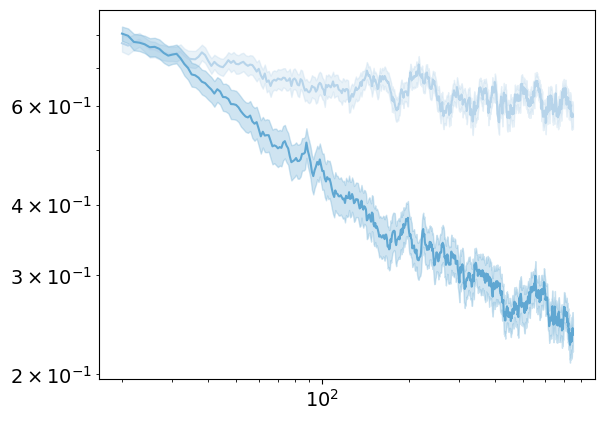

In [172]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

plt.loglog(np.arange(20, len(array1)), array1[20:], label='array1', color=colors[0])
plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

#plt.loglog(np.arange(20, len(array2)), array2[20:], label='array2', color=colors[1])
#plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

#plt.loglog(np.arange(20, len(array3)), array3[20:], label='array3', color=colors[2])
#plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

#plt.loglog(np.arange(20, len(array4)), array4[20:], label='array4', color=colors[3])
#plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

#plt.loglog(np.arange(20, len(array5)), array5[20:], label='array5', color=colors[4])
#plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array45)), array45[20:], label='array45', color=colors[44 % len(colors)])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])


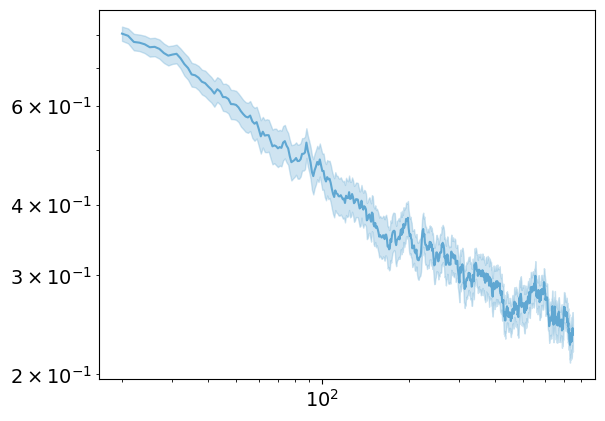

In [173]:
plt.loglog(np.arange(20, len(array45)), array45[20:], label='array45', color=colors[44 % len(colors)])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])


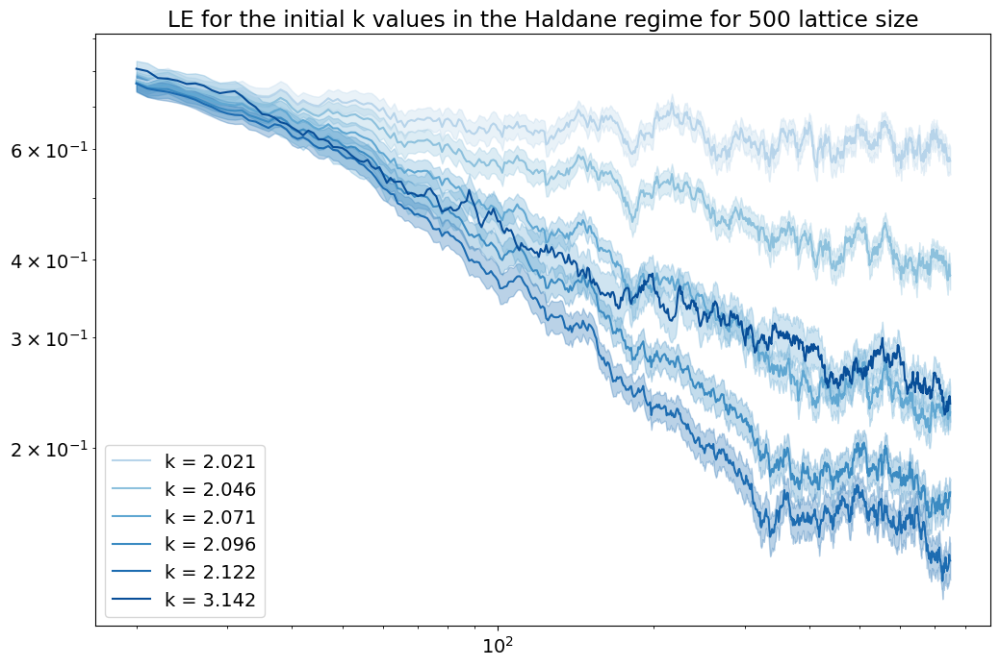

In [174]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})
plt.loglog(np.arange(20, len(array1)), array1[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[410]:.3f}', color=colors[0])
plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array2)), array2[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[412]:.3f}', color=colors[1])
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array3)), array3[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[414]:.3f}', color=colors[2])
plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array4)), array4[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[416]:.3f}', color=colors[3])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array5)), array5[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[418]:.3f}', color=colors[4])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array45)), array45[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[499]:.3f}', color=colors[5])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])
plt.title('LE for the initial k values in the Haldane regime for 500 lattice size')
plt.legend()
plt.show()

IndexError: index 7 is out of bounds for axis 0 with size 7

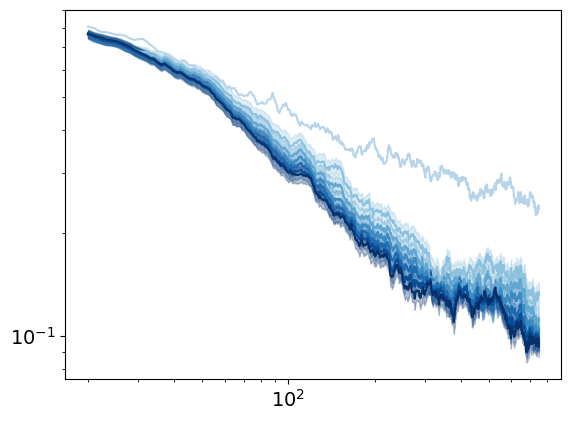

In [175]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))

# plt.loglog(np.arange(20, len(array1)), array1[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[410]:.3f}', color=colors[0])
# plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

# plt.loglog(np.arange(20, len(array2)), array2[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[412]:.3f}', color=colors[1])
# plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

# plt.loglog(np.arange(20, len(array3)), array3[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[414]:.3f}', color=colors[2])
# plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

# plt.loglog(np.arange(20, len(array4)), array4[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[416]:.3f}', color=colors[3])
# plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array5)), array5[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[418]:.3f}', color=colors[1])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[1])


plt.loglog(np.arange(20, len(array6)), array6[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[420]:.3f}', color=colors[2])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array7)), array7[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[422]:.3f}', color=colors[3])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array8)), array8[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[424]:.3f}', color=colors[4])
plt.fill_between(np.arange(20, len(array8)), array8[20:] - standard_error8[20:], array8[20:] + standard_error8[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array9)), array9[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[426]:.3f}', color=colors[5])
plt.fill_between(np.arange(20, len(array9)), array9[20:] - standard_error9[20:], array9[20:] + standard_error9[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array10)), array10[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[428]:.3f}', color=colors[6])
plt.fill_between(np.arange(20, len(array10)), array10[20:] - standard_error10[20:], array10[20:] + standard_error10[20:], alpha=0.3, color=colors[6])

plt.loglog(np.arange(20, len(array45)), array45[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[499]:.3f}', color=colors[0])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[7])


plt.legend()
plt.show()

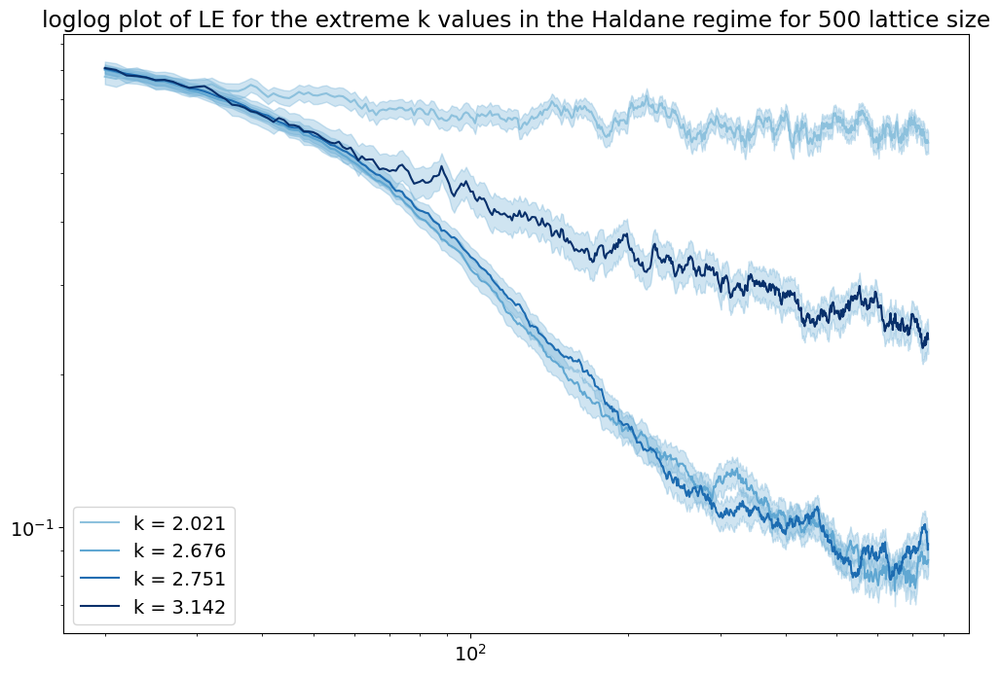

In [176]:
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

plt.loglog(np.arange(20, len(array1)), array1[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[410]:.3f}', color=colors[1])
plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[44 % len(colors)])


plt.loglog(np.arange(20, len(array26)), array26[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[462]:.3f}', color=colors[2])
plt.fill_between(np.arange(20, len(array26)), array26[20:] - standard_error26[20:], array26[20:] + standard_error26[20:], alpha=0.3, color=colors[44 % len(colors)])


plt.loglog(np.arange(20, len(array30)), array30[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[468]:.3f}', color=colors[4])
plt.fill_between(np.arange(20, len(array30)), array30[20:] - standard_error30[20:], array30[20:] + standard_error30[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array45)), array45[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[499]:.3f}', color=colors[6])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.title('loglog plot of LE for the extreme k values in the Haldane regime for 500 lattice size')

plt.legend()
plt.show()

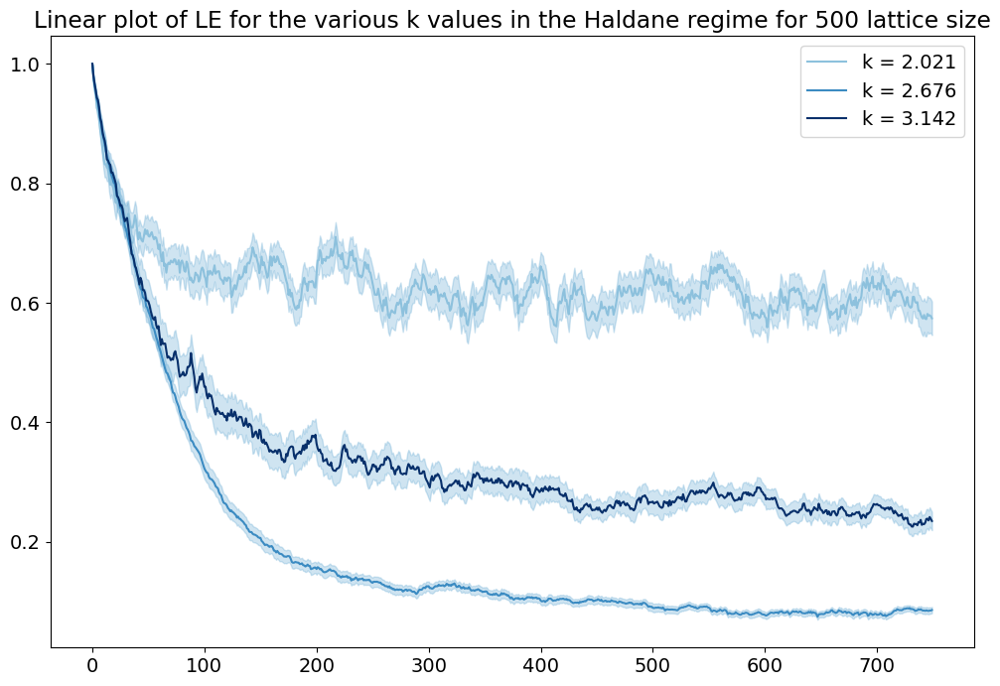

In [178]:
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

plt.plot(np.arange( len(array1)), array1, label=f'k = {np.linspace(-np.pi, np.pi, 500)[410]:.3f}', color=colors[1])
plt.fill_between(np.arange(len(array1)), array1 - standard_error1, array1+ standard_error1, alpha=0.3, color=colors[44 % len(colors)])


plt.plot(np.arange(len(array26)), array26, label=f'k = {np.linspace(-np.pi, np.pi, 500)[462]:.3f}', color=colors[3])
plt.fill_between(np.arange(len(array26)), array26 - standard_error26, array26 + standard_error26, alpha=0.3, color=colors[44 % len(colors)])

plt.plot(np.arange( len(array45)), array45, label=f'k = {np.linspace(-np.pi, np.pi, 500)[499]:.3f}', color=colors[6])
plt.fill_between(np.arange(len(array45)), array45 - standard_error45, array45 + standard_error45, alpha=0.3, color=colors[44 % len(colors)])

plt.title('Linear plot of LE for the various k values in the Haldane regime for 500 lattice size')

plt.legend()
plt.show()

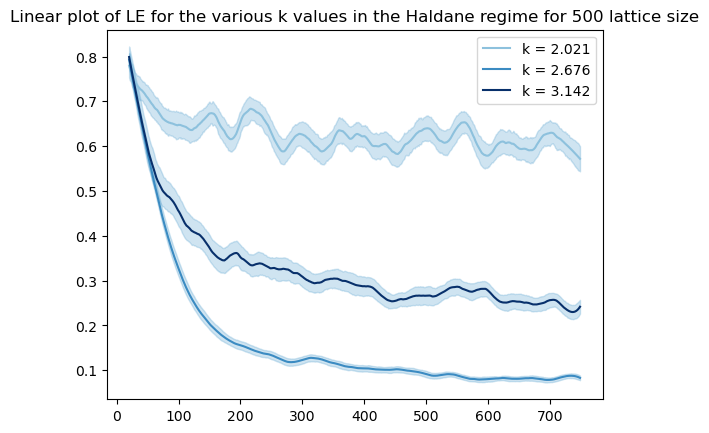

In [117]:
from scipy.signal import savgol_filter

# Smoothen the arrays using Savitzky-Golay filter
array1_smooth = savgol_filter(array1, window_length=51, polyorder=3)
array26_smooth = savgol_filter(array26, window_length=51, polyorder=3)
array45_smooth = savgol_filter(array45, window_length=51, polyorder=3)

plt.plot(np.arange(20, len(array1_smooth)), array1_smooth[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[410]:.3f}', color=colors[1])
plt.fill_between(np.arange(20, len(array1_smooth)), array1_smooth[20:] - standard_error1[20:], array1_smooth[20:] + standard_error1[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.plot(np.arange(20, len(array26_smooth)), array26_smooth[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[462]:.3f}', color=colors[3])
plt.fill_between(np.arange(20, len(array26_smooth)), array26_smooth[20:] - standard_error26[20:], array26_smooth[20:] + standard_error26[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.plot(np.arange(20, len(array45_smooth)), array45_smooth[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[499]:.3f}', color=colors[6])
plt.fill_between(np.arange(20, len(array45_smooth)), array45_smooth[20:] - standard_error45[20:], array45_smooth[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.title('Linear plot of LE for the various k values in the Haldane regime for 500 lattice size')

plt.legend()
plt.show()
# Calculate the fitted values using the provided A_fit and C_fit
fitted_values = A_fit * np.exp(-C_fit * np.arange(len(array1_smooth)))

# Plot the fitted values
plt.plot(np.arange(20, len(fitted_values)), fitted_values[20:], label='Fitted Curve', linestyle='--', color='black')

plt.legend()
plt.show()

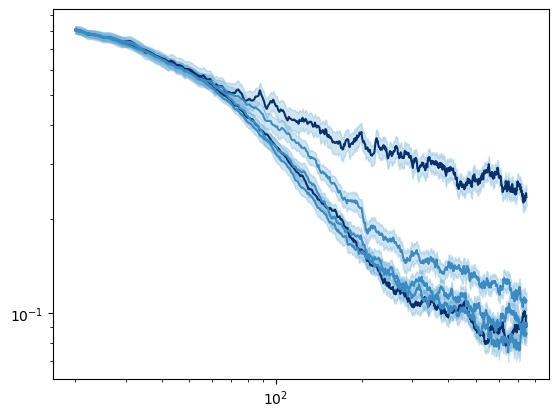

In [122]:
plt.loglog(np.arange(20, len(array45)), array45[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[499]:.3f}', color=colors[6])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array40)), array40[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[498]:.3f}', color=colors[3])
plt.fill_between(np.arange(20, len(array40)), array40[20:] - standard_error40[20:], array40[20:] + standard_error40[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array35)), array35[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[482]:.3f}', color=colors[3])
plt.fill_between(np.arange(20, len(array35)), array35[20:] - standard_error35[20:], array35[20:] + standard_error35[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array30)), array30[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[468]:.3f}', color=colors[6])
plt.fill_between(np.arange(20, len(array30)), array30[20:] - standard_error30[20:], array30[20:] + standard_error30[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array26)), array26[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[462]:.3f}', color=colors[3])
plt.fill_between(np.arange(20, len(array26)), array26[20:] - standard_error26[20:], array26[20:] + standard_error26[20:], alpha=0.3, color=colors[44 % len(colors)])





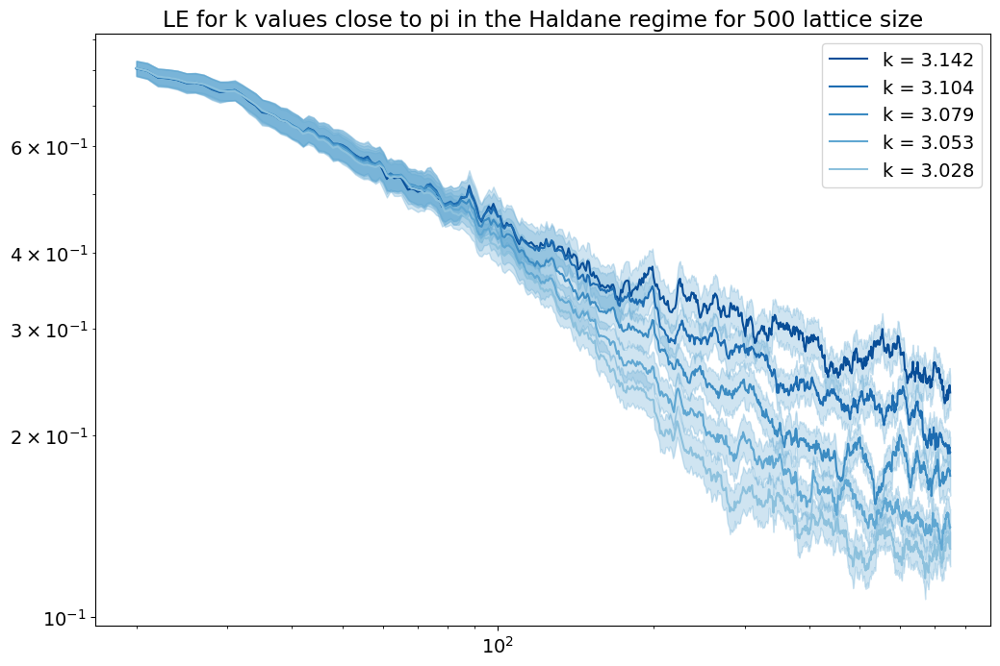

In [132]:
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

plt.loglog(np.arange(20, len(array45)), array45[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[499]:.3f}', color=colors[5])
plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array44)), array44[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[496]:.3f}', color=colors[4])
plt.fill_between(np.arange(20, len(array44)), array44[20:] - standard_error44[20:], array44[20:] + standard_error44[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array43)), array43[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[494]:.3f}', color=colors[3])
plt.fill_between(np.arange(20, len(array43)), array43[20:] - standard_error43[20:], array43[20:] + standard_error43[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array42)), array42[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[492]:.3f}', color=colors[2])
plt.fill_between(np.arange(20, len(array42)), array42[20:] - standard_error42[20:], array42[20:] + standard_error42[20:], alpha=0.3, color=colors[44 % len(colors)])

plt.loglog(np.arange(20, len(array41)), array41[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[490]:.3f}', color=colors[1])
plt.fill_between(np.arange(20, len(array41)), array41[20:] - standard_error41[20:], array41[20:] + standard_error41[20:], alpha=0.3, color=colors[44 % len(colors)])
plt.title('LE for k values close to pi in the Haldane regime for 500 lattice size')
plt.legend()

dict_keys(['LE_Hal_spatial_noise_750_500_k_site_80.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_

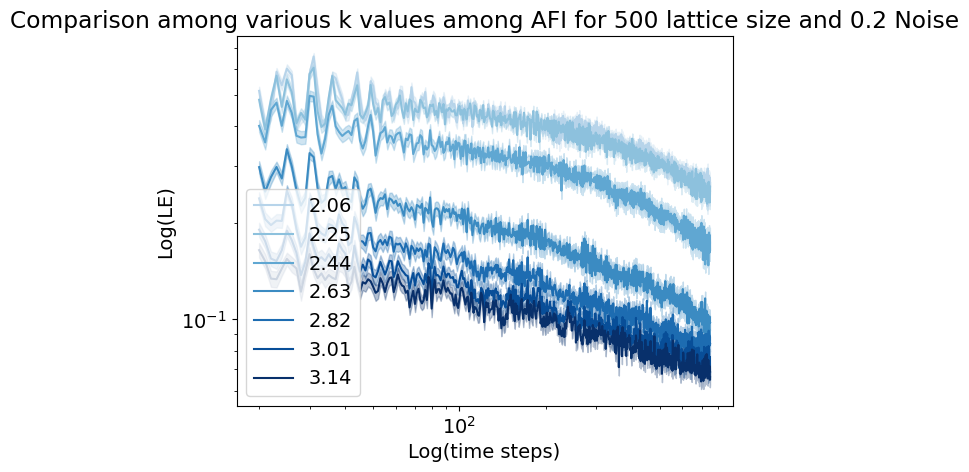

In [144]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/HAl_500_spatial_disorder')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Loop through the site numbers to generate arrays and standard errors
for idx, site in enumerate(range(80, 99, 2), start=1):
    # Walk through the directory
    for root, dirs, files in os.walk(downloads_folder):
        # Filter out only the .txt files that match the pattern
        txt_files = [file for file in files if file.startswith(f'LE_Hal_spatial_noise_750_500_k_site_{site}') and file.endswith('.txt')]

        # Load each file and store it in the dictionary
        for txt_file in txt_files:
            file_path = os.path.join(root, txt_file)
            data = np.loadtxt(file_path)
            le_ana_arrays[txt_file] = data

    # Print the keys of the dictionary to verify
    print(le_ana_arrays.keys())

    # Initialize a dictionary to store the arrays from each directory
    le_ana_arrays = {}

    # Loop through directories b0 to b95
    for i in range(96):
        dir_path = os.path.join(downloads_folder, f'b{i}')
        le_ana_large_path = os.path.join(dir_path, f'LE_Hal_spatial_noise_750_500_k_site_{site}.txt')
        
        if os.path.exists(le_ana_large_path):
            le_ana_large = np.loadtxt(le_ana_large_path)
            le_ana_arrays[f'b{i}_large'] = le_ana_large

    # Print the keys of the dictionary to verify
    print(le_ana_arrays.keys())

    # Convert the dictionary values to a numpy array for easier manipulation
    plot_data = np.array(list(le_ana_arrays.values()))

    # Calculate the average and standard error
    globals()[f'array{idx}'] = np.mean(plot_data, axis=0)
    globals()[f'standard_error{idx}'] = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])



# Find the index of the array with the smallest value
min_value = float('inf')
min_index = -1

for idx, site in enumerate(range(80, 99, 2), start=1):
    current_min = np.min(globals()[f'array{idx}'])
    if current_min < min_value:
        min_value = current_min
        min_index = idx

print("Index of the array with the smallest value:", min_index)

colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
print(array1)
plt.loglog(np.arange(20, len(array1)), array1[20:], label='2.06', color=colors[0])
plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array2)), array2[20:], label='2.25', color=colors[1])
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array3)), array3[20:], label='2.44', color=colors[2])
plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array4)), array4[20:], label='2.63', color=colors[3])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array5)), array5[20:], label='2.82', color=colors[4])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[4])

plt.loglog(np.arange(20, len(array6)), array6[20:], label='3.01', color=colors[5])
plt.fill_between(np.arange(20, len(array6)), array6[20:] - standard_error6[20:], array6[20:] + standard_error6[20:], alpha=0.3, color=colors[5])

plt.loglog(np.arange(20, len(array7)), array7[20:], label='3.14', color=colors[6])
plt.fill_between(np.arange(20, len(array7)), array7[20:] - standard_error7[20:], array7[20:] + standard_error7[20:], alpha=0.3, color=colors[6])

plt.title('Comparison among various k values among AFI for 500 lattice size and 0.2 Noise')
plt.ylabel('Log(LE)')
plt.xlabel('Log(time steps)')
plt.legend()
plt.show()


In [136]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})
plt.loglog(np.arange(20, len(array1)), array1[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[410]:.3f}', color=colors[0])
plt.fill_between(np.arange(20, len(array1)), array1[20:] - standard_error1[20:], array1[20:] + standard_error1[20:], alpha=0.3, color=colors[0])

plt.loglog(np.arange(20, len(array2)), array2[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[412]:.3f}', color=colors[1])
plt.fill_between(np.arange(20, len(array2)), array2[20:] - standard_error2[20:], array2[20:] + standard_error2[20:], alpha=0.3, color=colors[1])

plt.loglog(np.arange(20, len(array3)), array3[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[414]:.3f}', color=colors[2])
plt.fill_between(np.arange(20, len(array3)), array3[20:] - standard_error3[20:], array3[20:] + standard_error3[20:], alpha=0.3, color=colors[2])

plt.loglog(np.arange(20, len(array4)), array4[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[416]:.3f}', color=colors[3])
plt.fill_between(np.arange(20, len(array4)), array4[20:] - standard_error4[20:], array4[20:] + standard_error4[20:], alpha=0.3, color=colors[3])

plt.loglog(np.arange(20, len(array5)), array5[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[418]:.3f}', color=colors[4])
plt.fill_between(np.arange(20, len(array5)), array5[20:] - standard_error5[20:], array5[20:] + standard_error5[20:], alpha=0.3, color=colors[4])

#plt.loglog(np.arange(20, len(array45)), array45[20:], label=f'k = {np.linspace(-np.pi, np.pi, 500)[499]:.3f}', color=colors[5])
#plt.fill_between(np.arange(20, len(array45)), array45[20:] - standard_error45[20:], array45[20:] + standard_error45[20:], alpha=0.3, color=colors[44 % len(colors)])
plt.title('LE for the initial k values in the Haldane regime for 500 lattice size')
plt.legend()
plt.show()

TypeError: object of type 'numpy.float64' has no len()

<Figure size 1200x800 with 0 Axes>

In [161]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/HAl_500_spatial_disorder')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_spatial_noise_750_500_k_site_80') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_spatial_noise_750_500_k_site_80.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_spatial_noise_750_500_k_site_82') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_spatial_noise_750_500_k_site_82.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array5 = np.mean(plot_data, axis=0)
standard_error5 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_spatial_noise_750_500_k_site_84') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_spatial_noise_750_500_k_site_84.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array6 = np.mean(plot_data, axis=0)
standard_error6 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_spatial_noise_750_500_k_site_86') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_spatial_noise_750_500_k_site_86.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array7 = np.mean(plot_data, axis=0)
standard_error7 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_spatial_noise_750_500_k_site_88') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_spatial_noise_750_500_k_site_88.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array8 = np.mean(plot_data, axis=0)
standard_error8 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_spatial_noise_750_500_k_site_90') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_spatial_noise_750_500_k_site_90.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array9 = np.mean(plot_data, axis=0)
standard_error9 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_spatial_noise_750_500_k_site_92') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_spatial_noise_750_500_k_site_92.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array10 = np.mean(plot_data, axis=0)
standard_error10 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])
print(array10)


# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_spatial_noise_750_500_k_site_98') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_spatial_noise_750_500_k_site_98.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array12 = np.mean(plot_data, axis=0)
standard_error12 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])



dict_keys(['LE_Hal_spatial_noise_750_500_k_site_80.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_

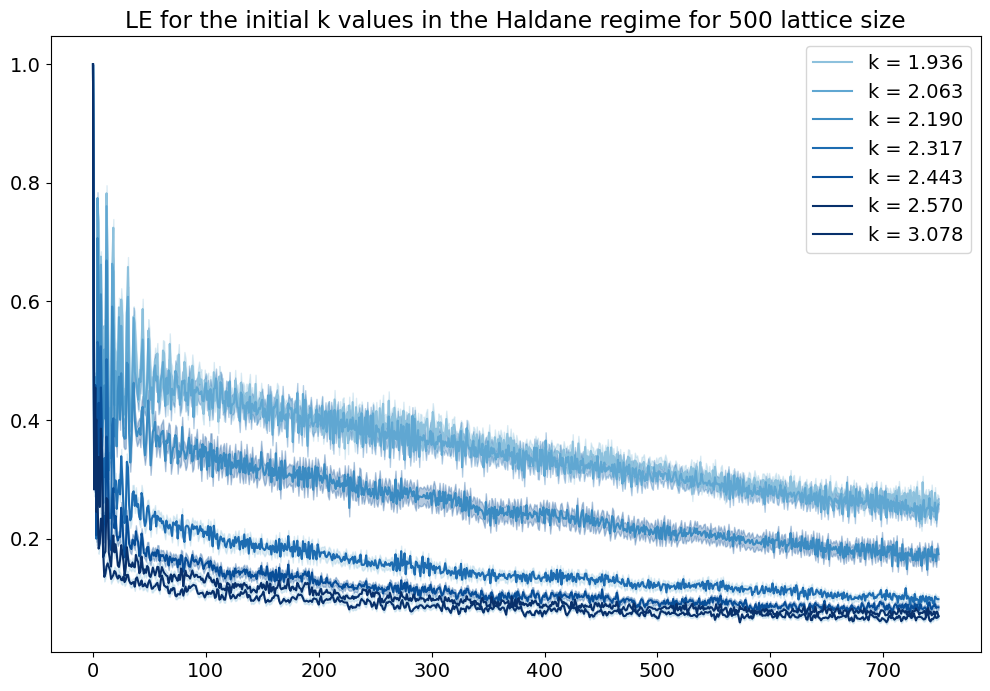

In [162]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

plt.plot(np.arange(len(array4)), array4, label=f'k = {np.linspace(-np.pi, np.pi, 100)[80]:.3f}', color=colors[1])
plt.fill_between(np.arange(len(array4)), array4 - standard_error4, array4 + standard_error4, alpha=0.3, color=colors[1])

plt.plot(np.arange(len(array5)), array5, label=f'k = {np.linspace(-np.pi, np.pi, 100)[82]:.3f}', color=colors[2])
plt.fill_between(np.arange(len(array5)), array5 - standard_error5, array5 + standard_error5, alpha=0.3, color=colors[4])

plt.plot(np.arange(len(array6)), array6, label=f'k = {np.linspace(-np.pi, np.pi, 100)[84]:.3f}', color=colors[3])
plt.fill_between(np.arange(len(array6)), array6 - standard_error6, array6 + standard_error6, alpha=0.3, color=colors[5])

plt.plot(np.arange(len(array7)), array7, label=f'k = {np.linspace(-np.pi, np.pi, 100)[86]:.3f}', color=colors[4])
plt.fill_between(np.arange(len(array7)), array7 - standard_error7, array7 + standard_error7, alpha=0.3, color=colors[1])

plt.plot(np.arange(len(array8)), array8, label=f'k = {np.linspace(-np.pi, np.pi, 100)[88]:.3f}', color=colors[5])
plt.fill_between(np.arange(len(array8)), array8 - standard_error8, array8 + standard_error8, alpha=0.3, color=colors[5])

plt.plot(np.arange(len(array9)), array9, label=f'k = {np.linspace(-np.pi, np.pi, 100)[90]:.3f}', color=colors[6])
plt.fill_between(np.arange(len(array9)), array9 - standard_error9, array9 + standard_error9, alpha=0.3, color=colors[1])

plt.plot(np.arange(len(array12)), array12, label=f'k = {np.linspace(-np.pi, np.pi, 100)[98]:.3f}', color=colors[6])
plt.fill_between(np.arange(len(array12)), array12 - standard_error12, array12 + standard_error12, alpha=0.3, color=colors[1])



plt.title('LE for the initial k values in the Haldane regime for 500 lattice size')
plt.legend()
plt.show()

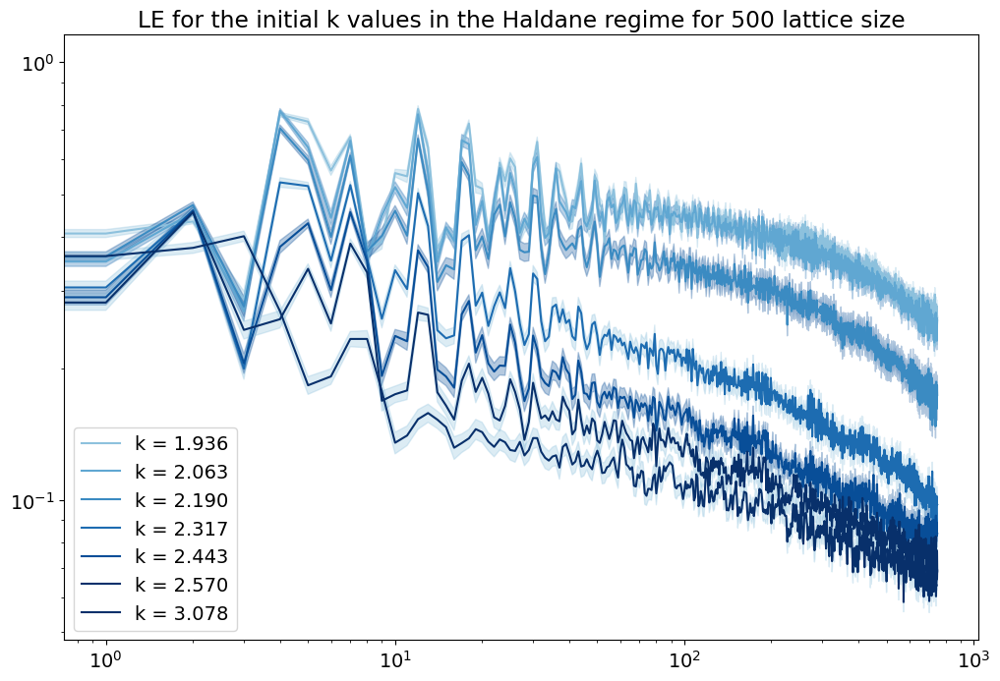

In [163]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

plt.loglog(np.arange(len(array4)), array4, label=f'k = {np.linspace(-np.pi, np.pi, 100)[80]:.3f}', color=colors[1])
plt.fill_between(np.arange(len(array4)), array4 - standard_error4, array4 + standard_error4, alpha=0.3, color=colors[1])

plt.loglog(np.arange(len(array5)), array5, label=f'k = {np.linspace(-np.pi, np.pi, 100)[82]:.3f}', color=colors[2])
plt.fill_between(np.arange(len(array5)), array5 - standard_error5, array5 + standard_error5, alpha=0.3, color=colors[4])

plt.loglog(np.arange(len(array6)), array6, label=f'k = {np.linspace(-np.pi, np.pi, 100)[84]:.3f}', color=colors[3])
plt.fill_between(np.arange(len(array6)), array6 - standard_error6, array6 + standard_error6, alpha=0.3, color=colors[5])

plt.loglog(np.arange(len(array7)), array7, label=f'k = {np.linspace(-np.pi, np.pi, 100)[86]:.3f}', color=colors[4])
plt.fill_between(np.arange(len(array7)), array7 - standard_error7, array7 + standard_error7, alpha=0.3, color=colors[1])

plt.loglog(np.arange(len(array8)), array8, label=f'k = {np.linspace(-np.pi, np.pi, 100)[88]:.3f}', color=colors[5])
plt.fill_between(np.arange(len(array8)), array8 - standard_error8, array8 + standard_error8, alpha=0.3, color=colors[5])

plt.loglog(np.arange(len(array9)), array9, label=f'k = {np.linspace(-np.pi, np.pi, 100)[90]:.3f}', color=colors[6])
plt.fill_between(np.arange(len(array9)), array9 - standard_error9, array9 + standard_error9, alpha=0.3, color=colors[1])

plt.loglog(np.arange(len(array12)), array12, label=f'k = {np.linspace(-np.pi, np.pi, 100)[98]:.3f}', color=colors[6])
plt.fill_between(np.arange(len(array12)), array12 - standard_error12, array12 + standard_error12, alpha=0.3, color=colors[1])



plt.title('LE for the initial k values in the Haldane regime for 500 lattice size')
plt.legend()
plt.show()

In [143]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/HAl_500_spatial_disorder')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Walk through the directory
for root, dirs, files in os.walk(downloads_folder):
    # Filter out only the .txt files that match the pattern
    txt_files = [file for file in files if file.startswith('LE_Hal_spatial_noise_750_500_k_site_80') and file.endswith('.txt')]

    # Load each file and store it in the dictionary
    for txt_file in txt_files:
        file_path = os.path.join(root, txt_file)
        data = np.loadtxt(file_path)
        le_ana_arrays[txt_file] = data

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Initialize a dictionary to store the arrays from each directory
le_ana_arrays = {}

# Loop through directories b0 to b95
for i in range(96):
    dir_path = os.path.join(downloads_folder, f'b{i}')
    le_ana_large_path = os.path.join(dir_path, 'LE_Hal_spatial_noise_750_500_k_site_80.txt')
    
    if os.path.exists(le_ana_large_path):
        le_ana_large = np.loadtxt(le_ana_large_path)
        le_ana_arrays[f'b{i}_large'] = le_ana_large

# Print the keys of the dictionary to verify
print(le_ana_arrays.keys())

# Convert the dictionary values to a numpy array for easier manipulation
plot_data = np.array(list(le_ana_arrays.values()))

# Calculate the average and standard error
array4 = np.mean(plot_data, axis=0)
standard_error4 = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])


dict_keys(['LE_Hal_spatial_noise_750_500_k_site_80.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_

dict_keys(['LE_Hal_bulk_state_750_500_k_site_87.txt'])
dict_keys(['b0_large', 'b1_large', 'b2_large', 'b3_large', 'b4_large', 'b5_large', 'b6_large', 'b7_large', 'b8_large', 'b9_large', 'b10_large', 'b11_large', 'b12_large', 'b13_large', 'b14_large', 'b15_large', 'b16_large', 'b17_large', 'b18_large', 'b19_large', 'b20_large', 'b21_large', 'b22_large', 'b23_large', 'b24_large', 'b25_large', 'b26_large', 'b27_large', 'b28_large', 'b29_large', 'b30_large', 'b31_large', 'b32_large', 'b33_large', 'b34_large', 'b35_large', 'b36_large', 'b37_large', 'b38_large', 'b39_large', 'b40_large', 'b41_large', 'b42_large', 'b43_large', 'b44_large', 'b45_large', 'b46_large', 'b47_large', 'b48_large', 'b49_large', 'b50_large', 'b51_large', 'b52_large', 'b53_large', 'b54_large', 'b55_large', 'b56_large', 'b57_large', 'b58_large', 'b59_large', 'b60_large', 'b61_large', 'b62_large', 'b63_large', 'b64_large', 'b65_large', 'b66_large', 'b67_large', 'b68_large', 'b69_large', 'b70_large', 'b71_large', 'b72_lar

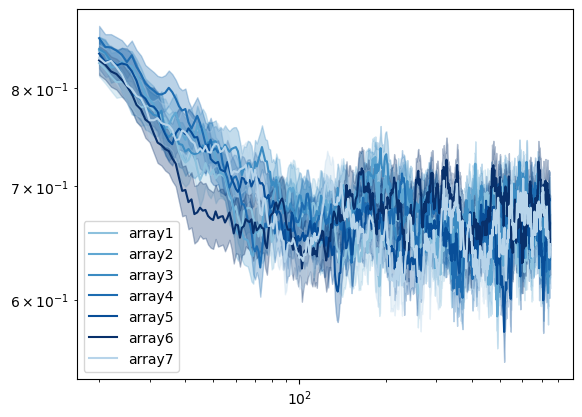

[array([1.        , 0.97864027, 0.96282496, 0.9521995 , 0.9360573 ,
       0.93561956, 0.92683552, 0.9092213 , 0.8985247 , 0.89255233,
       0.87825121, 0.87376414, 0.86313109, 0.85532849, 0.85013945,
       0.8460467 , 0.83930892, 0.83614672, 0.82723063, 0.82019791,
       0.82727788, 0.82069954, 0.812442  , 0.80618711, 0.8066149 ,
       0.80468035, 0.79406886, 0.78269917, 0.77905424, 0.78026212,
       0.7801824 , 0.77559754, 0.7759785 , 0.7679822 , 0.76748653,
       0.75736513, 0.7504838 , 0.74646807, 0.73355304, 0.72728735,
       0.72271105, 0.7251018 , 0.7328295 , 0.72996363, 0.71621905,
       0.70565232, 0.71213363, 0.72220934, 0.71444318, 0.71100298,
       0.71578295, 0.70736957, 0.71032049, 0.71147321, 0.71010802,
       0.70838416, 0.69702619, 0.68800831, 0.68576403, 0.67651275,
       0.68111615, 0.67120188, 0.66531577, 0.65863353, 0.67666712,
       0.67801804, 0.67949579, 0.67939746, 0.67817363, 0.67016366,
       0.66589058, 0.66302658, 0.65359276, 0.66688807, 0.6543

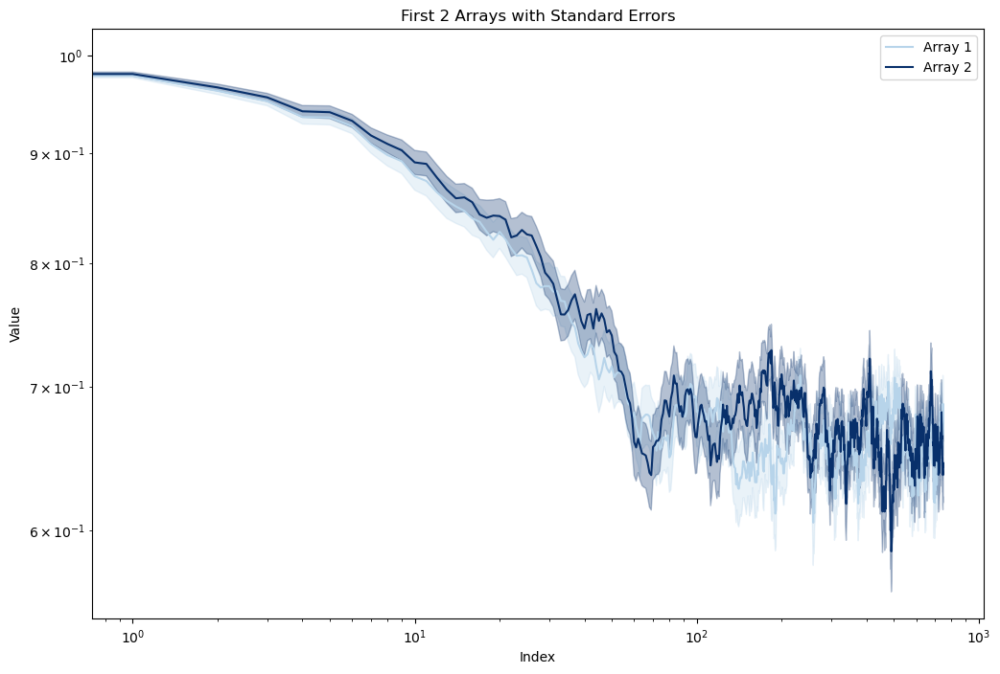

In [10]:
import os
import numpy as np
import sys
import os
import numpy as np
import numpy.linalg
import scipy as sp  
import matplotlib.pyplot as plt

# Define the path to the downloads folder
downloads_folder = os.path.expanduser('~/Desktop/HAl_500_bulk_state')

# Initialize a dictionary to store the arrays
le_ana_arrays = {}

# Loop through the site numbers to generate arrays and standard errors
for idx, site in enumerate(range(87, 101, 2), start=1):
    # Walk through the directory
    for root, dirs, files in os.walk(downloads_folder):
        # Filter out only the .txt files that match the pattern
        txt_files = [file for file in files if file.startswith(f'LE_Hal_bulk_state_750_500_k_site_{site}') and file.endswith('.txt')]

        # Load each file and store it in the dictionary
        for txt_file in txt_files:
            file_path = os.path.join(root, txt_file)
            data = np.loadtxt(file_path)
            le_ana_arrays[txt_file] = data

    # Print the keys of the dictionary to verify
    print(le_ana_arrays.keys())

    # Initialize a dictionary to store the arrays from each directory
    le_ana_arrays = {}

    # Loop through directories b0 to b95
    for i in range(96):
        dir_path = os.path.join(downloads_folder, f'b{i}')
        le_ana_large_path = os.path.join(dir_path, f'LE_Hal_bulk_state_750_500_k_site_{site}.txt')
        
        if os.path.exists(le_ana_large_path):
            le_ana_large = np.loadtxt(le_ana_large_path)
            le_ana_arrays[f'b{i}_large'] = le_ana_large

    # Print the keys of the dictionary to verify
    print(le_ana_arrays.keys())

    # Convert the dictionary values to a numpy array for easier manipulation
    plot_data = np.array(list(le_ana_arrays.values()))

    # Calculate the average and standard error
    globals()[f'array{idx}'] = np.mean(plot_data, axis=0)
    globals()[f'standard_error{idx}'] = np.std(plot_data, axis=0) / np.sqrt(plot_data.shape[0])

    # Plot the arrays using the blue color schemes
    colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
    plt.loglog(np.arange(20, len(globals()[f'array{idx}'])), globals()[f'array{idx}'][20:], label=f'array{idx}', color=colors[idx % len(colors)])
    plt.fill_between(np.arange(20, len(globals()[f'array{idx}'])), globals()[f'array{idx}'][20:] - globals()[f'standard_error{idx}'][20:], globals()[f'array{idx}'][20:] + globals()[f'standard_error{idx}'][20:], alpha=0.3, color=colors[idx % len(colors)])

plt.legend()
plt.show()

# Define the arrays and their standard errors
arrays = [array1, array2]
standard_errors = [standard_error1, standard_error2]
print(arrays)
labels = [f'Array {i+1}' for i in range(len(arrays))]
print(labels)

# Plot the arrays with their standard errors
plt.figure(figsize=(12, 8))
colors = plt.cm.Blues(np.linspace(0.3, 1, len(arrays)))
print(colors)

for i, (array, std_err, label) in enumerate(zip(arrays, standard_errors, labels)):
    plt.loglog(np.arange(len(array)), array, label=label, color=colors[i])
    plt.fill_between(np.arange(len(array)), array - std_err, array + std_err, alpha=0.3, color=colors[i])

plt.title('First 2 Arrays with Standard Errors')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()


[array([1.        , 0.97864027, 0.96282496, 0.9521995 , 0.9360573 ,
       0.93561956, 0.92683552, 0.9092213 , 0.8985247 , 0.89255233,
       0.87825121, 0.87376414, 0.86313109, 0.85532849, 0.85013945,
       0.8460467 , 0.83930892, 0.83614672, 0.82723063, 0.82019791,
       0.82727788, 0.82069954, 0.812442  , 0.80618711, 0.8066149 ,
       0.80468035, 0.79406886, 0.78269917, 0.77905424, 0.78026212,
       0.7801824 , 0.77559754, 0.7759785 , 0.7679822 , 0.76748653,
       0.75736513, 0.7504838 , 0.74646807, 0.73355304, 0.72728735,
       0.72271105, 0.7251018 , 0.7328295 , 0.72996363, 0.71621905,
       0.70565232, 0.71213363, 0.72220934, 0.71444318, 0.71100298,
       0.71578295, 0.70736957, 0.71032049, 0.71147321, 0.71010802,
       0.70838416, 0.69702619, 0.68800831, 0.68576403, 0.67651275,
       0.68111615, 0.67120188, 0.66531577, 0.65863353, 0.67666712,
       0.67801804, 0.67949579, 0.67939746, 0.67817363, 0.67016366,
       0.66589058, 0.66302658, 0.65359276, 0.66688807, 0.6543

<Figure size 1200x800 with 0 Axes>

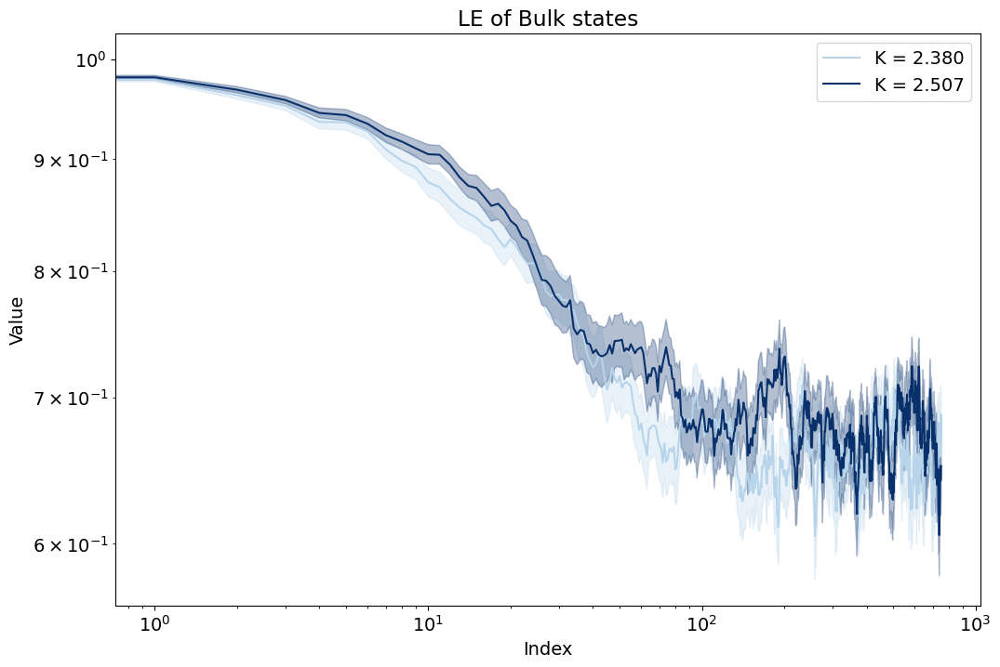

In [29]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

# Define the arrays and their standard errors
arrays = [array1, array3]
standard_errors = [standard_error1, standard_error3]
print(arrays)
labels = [f'K = {k:.3f}' for k in np.linspace(-np.pi, np.pi, 100)[87:101:2]]
print(labels)

# Plot the arrays with their standard errors
plt.figure(figsize=(12, 8))
colors = plt.cm.Blues(np.linspace(0.3, 1, len(arrays)))
print(colors)

for i, (array, std_err, label) in enumerate(zip(arrays, standard_errors, labels)):
    plt.loglog(np.arange(len(array)), array, label=label, color=colors[i])
    plt.fill_between(np.arange(len(array)), array - std_err, array + std_err, alpha=0.3, color=colors[i])

plt.title('LE of Bulk states')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()

[array([1.        , 0.98095314, 0.96982707, 0.95880078, 0.94650804,
       0.93987034, 0.93372423, 0.92815634, 0.91992675, 0.91128779,
       0.90756023, 0.9010068 , 0.88284545, 0.87651179, 0.86594362,
       0.85846943, 0.852335  , 0.85063342, 0.84926436, 0.85566147,
       0.83807496, 0.82881719, 0.82997516, 0.82459429, 0.82696345,
       0.82538347, 0.81828021, 0.8078735 , 0.79251045, 0.78834339,
       0.78073407, 0.77975412, 0.77470371, 0.75975717, 0.75126869,
       0.74434852, 0.7409425 , 0.7519382 , 0.75682269, 0.7544923 ,
       0.75100528, 0.75706113, 0.75298222, 0.74781642, 0.74814923,
       0.738341  , 0.73627795, 0.73408096, 0.74043874, 0.72636685,
       0.72370283, 0.72188198, 0.72340443, 0.71595269, 0.71475838,
       0.71383129, 0.72320987, 0.71607148, 0.70676174, 0.70256163,
       0.69735629, 0.69450944, 0.69917764, 0.70803861, 0.70691872,
       0.70204364, 0.70515844, 0.70578502, 0.69957257, 0.70386005,
       0.71324542, 0.70776789, 0.70684631, 0.70236349, 0.7029

<Figure size 1200x800 with 0 Axes>

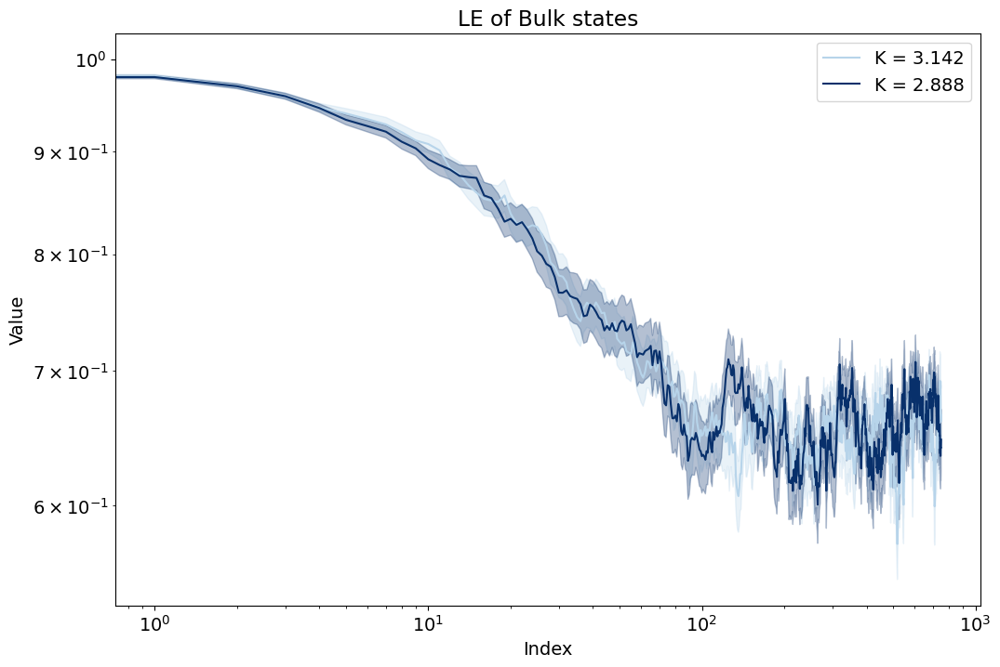

In [30]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

# Define the arrays and their standard errors
arrays = [array5, array7]
standard_errors = [standard_error5, standard_error7]
print(arrays)
labels = [f'K = {np.linspace(-np.pi, np.pi, 100)[99]:.3f}', f'K = {np.linspace(-np.pi, np.pi, 100)[95]:.3f}']
print(labels)

# Plot the arrays with their standard errors
plt.figure(figsize=(12, 8))
colors = plt.cm.Blues(np.linspace(0.3, 1, len(arrays)))
print(colors)

for i, (array, std_err, label) in enumerate(zip(arrays, standard_errors, labels)):
    plt.loglog(np.arange(len(array)), array, label=label, color=colors[i])
    plt.fill_between(np.arange(len(array)), array - std_err, array + std_err, alpha=0.3, color=colors[i])

plt.title('LE of Bulk states')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()

/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_15811/1103352443.py:7: RuntimeWarning: divide by zero encountered in log
  x_log = np.log(np.arange(len(LE_Val)))


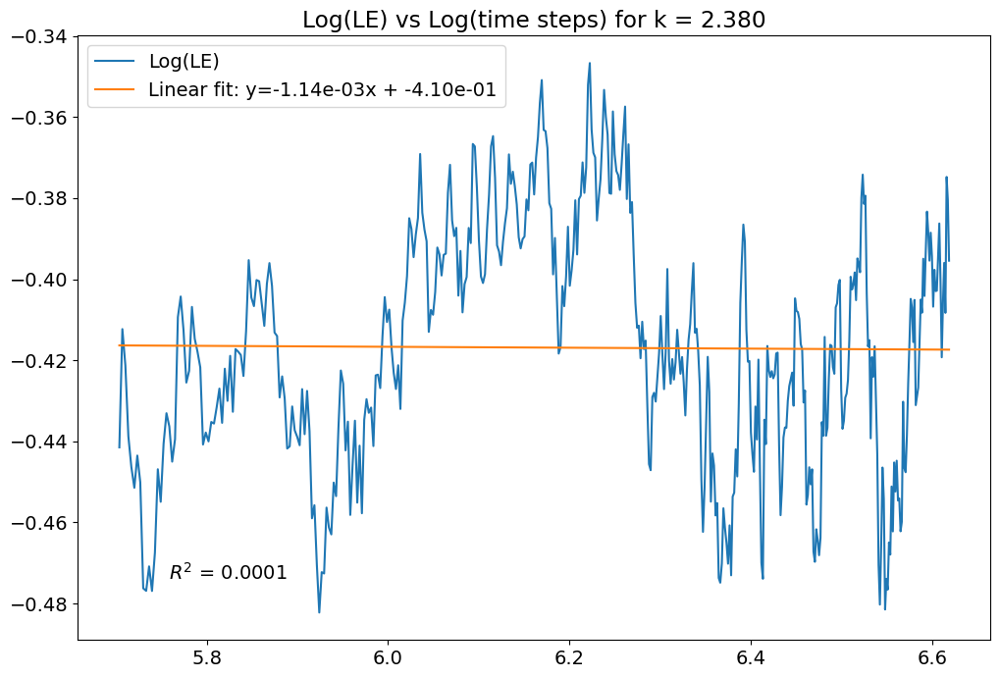

R^2 value of the linear fit: 0.0001
Linear fit parameters (0-150): slope = -1.14e-03, intercept = -4.10e-01


In [31]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})
LE_Val = array1
LE_Error = standard_error1
LE_Val_log = np.log(LE_Val)
x_log = np.log(np.arange(len(LE_Val)))
x_log_plot = x_log[300:]
LE_Val_plot = LE_Val_log[300:]
#plt.plot(x_log_plot, LE_Val_plot, label='Log(LE)')



# Perform a linear fit from 0 to 300 time steps
slope_150, intercept_150 = np.polyfit(x_log_plot, LE_Val_plot, 1)
fitted_line_150 = slope_150 * x_log_plot + intercept_150



#slope of 0.5 line
slope_05 = -0.5
intercept_05 = fitted_line_150[0] - slope_05 * x_log_plot[0]
fitted_line_05 = slope_05 * x_log_plot  + intercept_05

#slope of 0.5 line
slope_03 = -0.333
intercept_03 = fitted_line_150[0] - slope_05 * x_log_plot[0]
fitted_line_03 = slope_03 * x_log_plot  + intercept_03

# Calculate the R^2 value
residuals = LE_Val_plot - fitted_line_150
ss_res = np.sum(residuals**2)
ss_tot = np.sum((LE_Val_plot - np.mean(LE_Val_plot))**2)
r_squared = 1 - (ss_res / ss_tot)


# Plot the full log(LE) curve
plt.plot(x_log_plot, LE_Val_plot, label='Log(LE)')
plt.plot(x_log_plot, fitted_line_150, label=f'Linear fit: y={slope_150:.2e}x + {intercept_150:.2e}')
#plt.plot(x_log_plot, fitted_line_05, label=f'Linear fit: y={slope_05:.2e}x + {intercept_05:.2e}')
plt.legend()
plt.title(f'Log(LE) vs Log(time steps) for k = {np.linspace(-np.pi, np.pi, 100)[87]:.3f}')
plt.text(0.1, 0.1, f'$R^2$ = {r_squared:.4f}', transform=plt.gca().transAxes)
plt.show()



# Report the R^2 value
print(f"R^2 value of the linear fit: {r_squared:.4f}")

# Report the fit for 0 to 150 time steps
print(f"Linear fit parameters (0-150): slope = {slope_150:.2e}, intercept = {intercept_150:.2e}")
# Add the R^2 value to the plot


/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_15811/1803879597.py:8: RuntimeWarning: divide by zero encountered in log
  x_log = np.log(np.arange(len(LE_Val)))


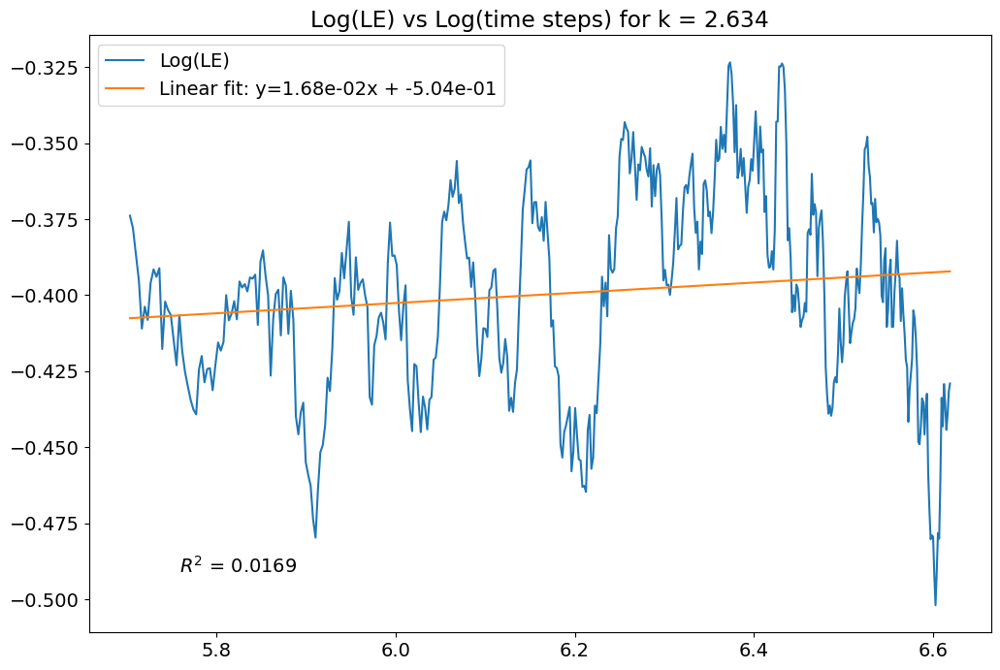

R^2 value of the linear fit: 0.0169
Linear fit parameters (0-150): slope = 1.68e-02, intercept = -5.04e-01


In [32]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

LE_Val = array3
LE_Error = standard_error3
LE_Val_log = np.log(LE_Val)
x_log = np.log(np.arange(len(LE_Val)))
x_log_plot = x_log[300:]
LE_Val_plot = LE_Val_log[300:]
#plt.plot(x_log_plot, LE_Val_plot, label='Log(LE)')



# Perform a linear fit from 0 to 300 time steps
slope_150, intercept_150 = np.polyfit(x_log_plot, LE_Val_plot, 1)
fitted_line_150 = slope_150 * x_log_plot + intercept_150



#slope of 0.5 line
slope_05 = -0.5
intercept_05 = fitted_line_150[0] - slope_05 * x_log_plot[0]
fitted_line_05 = slope_05 * x_log_plot  + intercept_05

#slope of 0.5 line
slope_03 = -0.333
intercept_03 = fitted_line_150[0] - slope_05 * x_log_plot[0]
fitted_line_03 = slope_03 * x_log_plot  + intercept_03

# Calculate the R^2 value
residuals = LE_Val_plot - fitted_line_150
ss_res = np.sum(residuals**2)
ss_tot = np.sum((LE_Val_plot - np.mean(LE_Val_plot))**2)
r_squared = 1 - (ss_res / ss_tot)


# Plot the full log(LE) curve
plt.plot(x_log_plot, LE_Val_plot, label='Log(LE)')
plt.plot(x_log_plot, fitted_line_150, label=f'Linear fit: y={slope_150:.2e}x + {intercept_150:.2e}')
plt.title(f'Log(LE) vs Log(time steps) for k = {np.linspace(-np.pi, np.pi, 100)[91]:.3f}')

#plt.plot(x_log_plot, fitted_line_05, label=f'Linear fit: y={slope_05:.2e}x + {intercept_05:.2e}')
plt.legend()
plt.text(0.1, 0.1, f'$R^2$ = {r_squared:.4f}', transform=plt.gca().transAxes)
plt.show()



# Report the R^2 value
print(f"R^2 value of the linear fit: {r_squared:.4f}")

# Report the fit for 0 to 150 time steps
print(f"Linear fit parameters (0-150): slope = {slope_150:.2e}, intercept = {intercept_150:.2e}")
# Add the R^2 value to the plot


/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_15811/2005107348.py:4: RuntimeWarning: divide by zero encountered in log
  x_log = np.log(np.arange(len(LE_Val)))


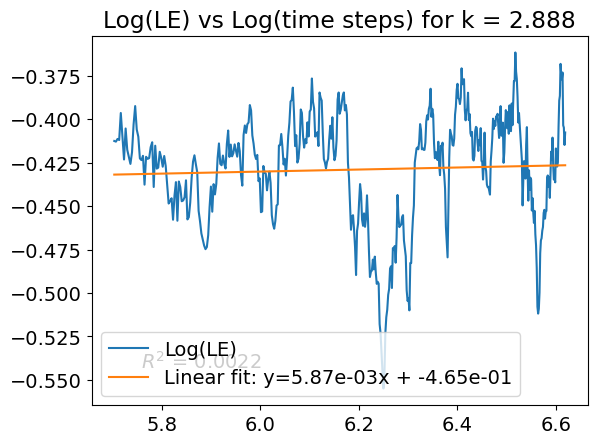

R^2 value of the linear fit: 0.0022
Linear fit parameters (0-150): slope = 5.87e-03, intercept = -4.65e-01


In [27]:
LE_Val = array5
LE_Error = standard_error5
LE_Val_log = np.log(LE_Val)
x_log = np.log(np.arange(len(LE_Val)))
x_log_plot = x_log[300:]
LE_Val_plot = LE_Val_log[300:]
#plt.plot(x_log_plot, LE_Val_plot, label='Log(LE)')



# Perform a linear fit from 0 to 300 time steps
slope_150, intercept_150 = np.polyfit(x_log_plot, LE_Val_plot, 1)
fitted_line_150 = slope_150 * x_log_plot + intercept_150



#slope of 0.5 line
slope_05 = -0.5
intercept_05 = fitted_line_150[0] - slope_05 * x_log_plot[0]
fitted_line_05 = slope_05 * x_log_plot  + intercept_05

#slope of 0.5 line
slope_03 = -0.333
intercept_03 = fitted_line_150[0] - slope_05 * x_log_plot[0]
fitted_line_03 = slope_03 * x_log_plot  + intercept_03

# Calculate the R^2 value
residuals = LE_Val_plot - fitted_line_150
ss_res = np.sum(residuals**2)
ss_tot = np.sum((LE_Val_plot - np.mean(LE_Val_plot))**2)
r_squared = 1 - (ss_res / ss_tot)


# Plot the full log(LE) curve
plt.plot(x_log_plot, LE_Val_plot, label='Log(LE)')
plt.plot(x_log_plot, fitted_line_150, label=f'Linear fit: y={slope_150:.2e}x + {intercept_150:.2e}')
plt.title(f'Log(LE) vs Log(time steps) for k = {np.linspace(-np.pi, np.pi, 100)[95]:.3f}')

#plt.plot(x_log_plot, fitted_line_05, label=f'Linear fit: y={slope_05:.2e}x + {intercept_05:.2e}')
plt.legend()
plt.text(0.1, 0.1, f'$R^2$ = {r_squared:.4f}', transform=plt.gca().transAxes)
plt.show()



# Report the R^2 value
print(f"R^2 value of the linear fit: {r_squared:.4f}")

# Report the fit for 0 to 150 time steps
print(f"Linear fit parameters (0-150): slope = {slope_150:.2e}, intercept = {intercept_150:.2e}")
# Add the R^2 value to the plot


/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_15811/2365456436.py:7: RuntimeWarning: divide by zero encountered in log
  x_log = np.log(np.arange(len(LE_Val)))


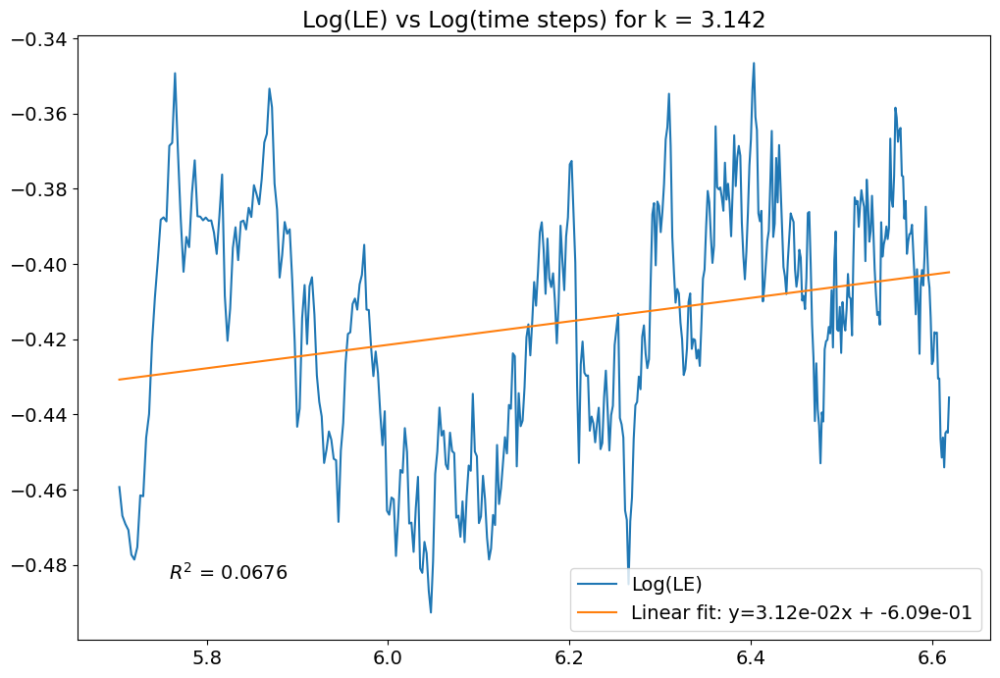

R^2 value of the linear fit: 0.0676
Linear fit parameters (0-150): slope = 3.12e-02, intercept = -6.09e-01


In [33]:
colors = plt.cm.Blues(np.linspace(0.3, 1, 7))
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})
LE_Val = array7
LE_Error = standard_error7
LE_Val_log = np.log(LE_Val)
x_log = np.log(np.arange(len(LE_Val)))
x_log_plot = x_log[300:]
LE_Val_plot = LE_Val_log[300:]
#plt.plot(x_log_plot, LE_Val_plot, label='Log(LE)')



# Perform a linear fit from 0 to 300 time steps
slope_150, intercept_150 = np.polyfit(x_log_plot, LE_Val_plot, 1)
fitted_line_150 = slope_150 * x_log_plot + intercept_150



#slope of 0.5 line
slope_05 = -0.5
intercept_05 = fitted_line_150[0] - slope_05 * x_log_plot[0]
fitted_line_05 = slope_05 * x_log_plot  + intercept_05

#slope of 0.5 line
slope_03 = -0.333
intercept_03 = fitted_line_150[0] - slope_05 * x_log_plot[0]
fitted_line_03 = slope_03 * x_log_plot  + intercept_03

# Calculate the R^2 value
residuals = LE_Val_plot - fitted_line_150
ss_res = np.sum(residuals**2)
ss_tot = np.sum((LE_Val_plot - np.mean(LE_Val_plot))**2)
r_squared = 1 - (ss_res / ss_tot)


# Plot the full log(LE) curve
plt.plot(x_log_plot, LE_Val_plot, label='Log(LE)')
plt.plot(x_log_plot, fitted_line_150, label=f'Linear fit: y={slope_150:.2e}x + {intercept_150:.2e}')
plt.title(f'Log(LE) vs Log(time steps) for k = {np.linspace(-np.pi, np.pi, 100)[99]:.3f}')

#plt.plot(x_log_plot, fitted_line_05, label=f'Linear fit: y={slope_05:.2e}x + {intercept_05:.2e}')
plt.legend()
plt.text(0.1, 0.1, f'$R^2$ = {r_squared:.4f}', transform=plt.gca().transAxes)
plt.show()



# Report the R^2 value
print(f"R^2 value of the linear fit: {r_squared:.4f}")

# Report the fit for 0 to 150 time steps
print(f"Linear fit parameters (0-150): slope = {slope_150:.2e}, intercept = {intercept_150:.2e}")
# Add the R^2 value to the plot


In [ ]:
# Define the arrays and their standard errors
arrays = [array1, array2]
standard_errors = [standard_error1, standard_error2]
print(arrays)
labels = [f'Array {i+1}' for i in range(len(arrays))]
print(labels)

# Plot the arrays with their standard errors
plt.figure(figsize=(12, 8))
colors = plt.cm.Blues(np.linspace(0.3, 1, len(arrays)))
print(colors)

plt.plot(np.arange(len(array1)), array1, label=label, color=colors[0])
plt.fill_between(np.arange(len(array)), array - std_err, array + std_err, alpha=0.3, color=colors[i])

plt.title('First 2 Arrays with Standard Errors')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()

In [3]:
print(array1)

[1.         0.97864027 0.96282496 0.9521995  0.9360573  0.93561956
 0.92683552 0.9092213  0.8985247  0.89255233 0.87825121 0.87376414
 0.86313109 0.85532849 0.85013945 0.8460467  0.83930892 0.83614672
 0.82723063 0.82019791 0.82727788 0.82069954 0.812442   0.80618711
 0.8066149  0.80468035 0.79406886 0.78269917 0.77905424 0.78026212
 0.7801824  0.77559754 0.7759785  0.7679822  0.76748653 0.75736513
 0.7504838  0.74646807 0.73355304 0.72728735 0.72271105 0.7251018
 0.7328295  0.72996363 0.71621905 0.70565232 0.71213363 0.72220934
 0.71444318 0.71100298 0.71578295 0.70736957 0.71032049 0.71147321
 0.71010802 0.70838416 0.69702619 0.68800831 0.68576403 0.67651275
 0.68111615 0.67120188 0.66531577 0.65863353 0.67666712 0.67801804
 0.67949579 0.67939746 0.67817363 0.67016366 0.66589058 0.66302658
 0.65359276 0.66688807 0.65439001 0.65599096 0.6626955  0.66312339
 0.66088194 0.6646111  0.64882983 0.65107278 0.66415163 0.6778356
 0.68604333 0.68677735 0.68449414 0.682597   0.68010658 0.682492

/var/folders/4n/4y_rknps05l_pvrvh_0c3x540000gn/T/ipykernel_24493/1905394780.py:19: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', fontsize='small', ncol=2)


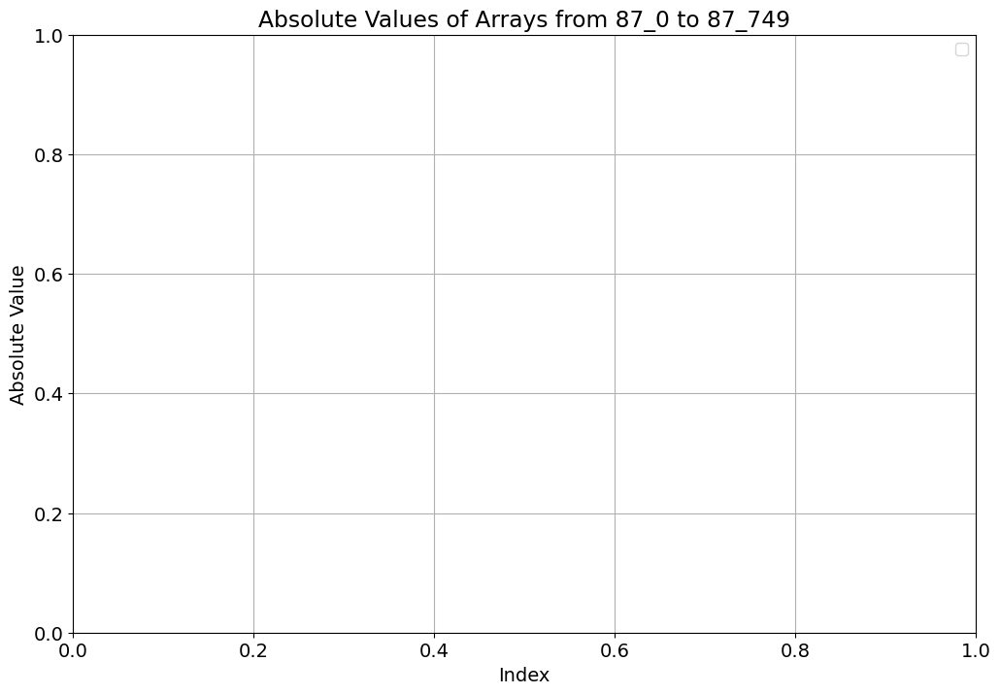

In [3]:
import os
import numpy as np

plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

directory_path = '/Users/bishalghosh/Desktop/b0/'
final_wave_arrays = {}

# Iterate through the indices and plot the arrays
for i in range(750):
    key = f'final_wave_bulk_87_{i}.npy'
    if key in final_wave_arrays:
        plt.plot(np.abs(final_wave_arrays[key]), label=f'|{key}|')

plt.title('Absolute Values of Arrays from 87_0 to 87_749')
plt.xlabel('Index')
plt.ylabel('Absolute Value')
plt.legend(loc='upper right', fontsize='small', ncol=2)
plt.grid(True)
plt.show()
# Load the arrays from the b0 folder

directory_path = '/Users/bishalghosh/Desktop/b0/'
final_wave_arrays = {}

for i in range(750):
    file_name = f'final_wave_bulk_87_{i}.npy'
    file_path = os.path.join(directory_path, file_name)
    if os.path.exists(file_path):
        final_wave_arrays[file_name] = np.load(file_path)
        # Plot all the final_wave_arrays
        #plt.figure(figsize=(12, 8))
        #plt.rcParams.update({'font.size': 14})

        #for key, value in final_wave_arrays.items():
        #    plt.plot(np.abs(value), label=f'|{key}|')

        #plt.title('Absolute Values of All Final Wave Arrays')
        #plt.xlabel('Index')
        #plt.ylabel('Absolute Value')
        #plt.legend(loc='upper right', fontsize='small', ncol=2)
        #plt.grid(True)
        #plt.show()

        # Create a heatmap of the absolute values of the arrays
        #import matplotlib.pyplot as plt

        # Prepare the data for the heatmap
        #heatmap_data = np.array([np.abs(value) for value in final_wave_arrays.values()])

        # Plot the heatmap
        #plt.figure(figsize=(12, 8))
        #plt.imshow(heatmap_data, aspect='auto', cmap='viridis', interpolation='nearest')
        #plt.colorbar(label='Absolute Value')
        #plt.title('Heatmap of Absolute Values of Final Wave Arrays')
        #plt.xlabel('Index')
        #plt.ylabel('Array Number')
        #plt.show()

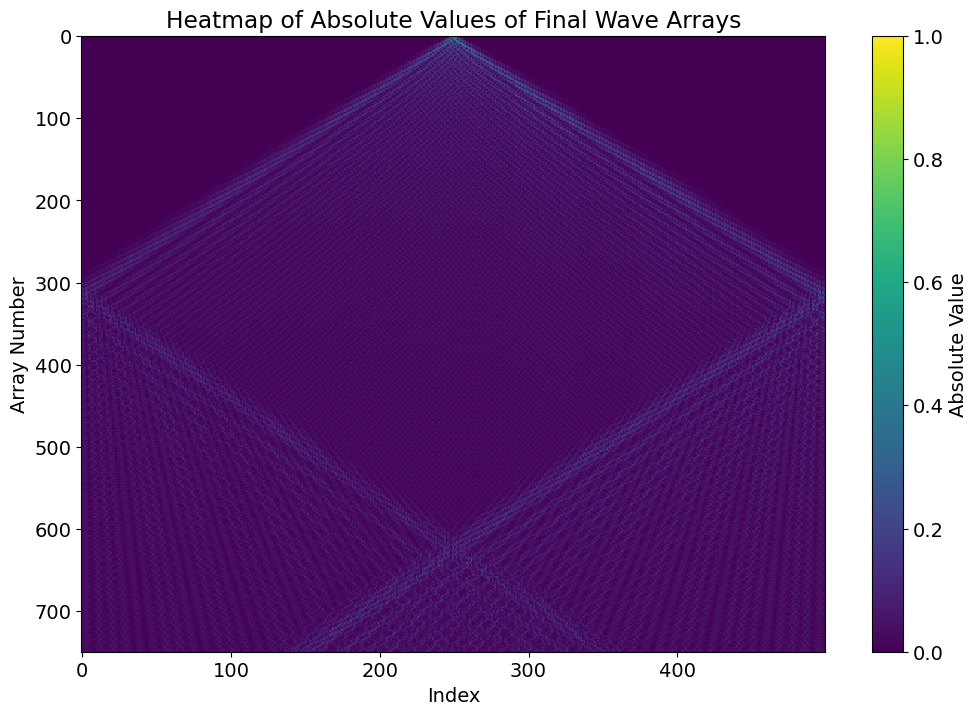

In [4]:
        # Create a heatmap of the absolute values of the arrays
        import matplotlib.pyplot as plt

        # Prepare the data for the heatmap
        heatmap_data = np.array([np.abs(value) for value in final_wave_arrays.values()])

        # Plot the heatmap
        plt.figure(figsize=(12, 8))
        plt.imshow(heatmap_data, aspect='auto', cmap='viridis', interpolation='nearest')
        plt.colorbar(label='Absolute Value')
        plt.title('Heatmap of Absolute Values of Final Wave Arrays')
        plt.xlabel('Index')
        plt.ylabel('Array Number')
        plt.show()

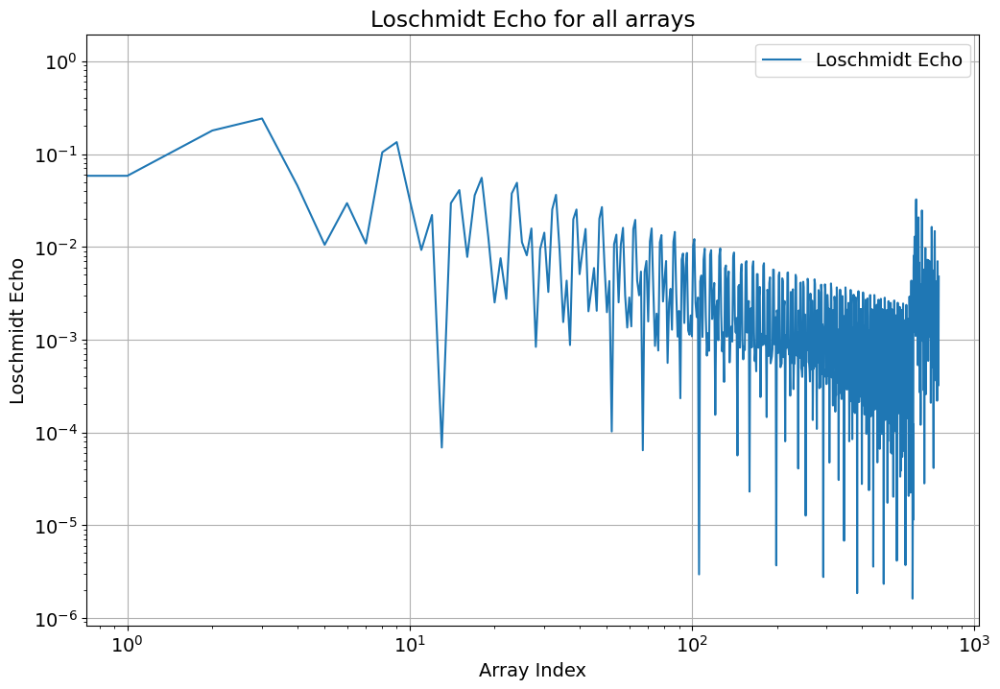

Loschmidt Echo value: 0.004780310806228009


In [8]:
# Calculate the Loschmidt Echo (LE) value
initial_state = final_wave_arrays['final_wave_bulk_87_0.npy']

def lochsgmidt_echo(final_vector, initial_vector):
    final_vector = final_vector / np.linalg.norm(final_vector)
    initial_vector = initial_vector / np.linalg.norm(initial_vector)
    rate = np.conjugate(final_vector) @ initial_vector  # Take a conjugate transpose
    return np.abs(rate)**2

# Iterate through all the arrays and calculate the Loschmidt Echo
loschmidt_echo_values = []

for i in range(750):
    key = f'final_wave_bulk_87_{i}.npy'
    if key in final_wave_arrays:
        final_state = final_wave_arrays[key]
        loschmidt_echo = lochsgmidt_echo(final_state, initial_state)
        loschmidt_echo_values.append(loschmidt_echo)

# Plot the Loschmidt Echo values
plt.figure(figsize=(12, 8))
plt.loglog(range(750), loschmidt_echo_values, label='Loschmidt Echo')
plt.title('Loschmidt Echo for bulk site')
plt.xlabel('Array Index')
plt.ylabel('Loschmidt Echo')
plt.legend()
plt.grid(True)
plt.show()

# Compute the overlap
overlap = np.vdot(initial_state, final_state)

# Compute the Loschmidt Echo (LE)
loschmidt_echo = np.abs(overlap)**2

print(f"Loschmidt Echo value: {loschmidt_echo}")

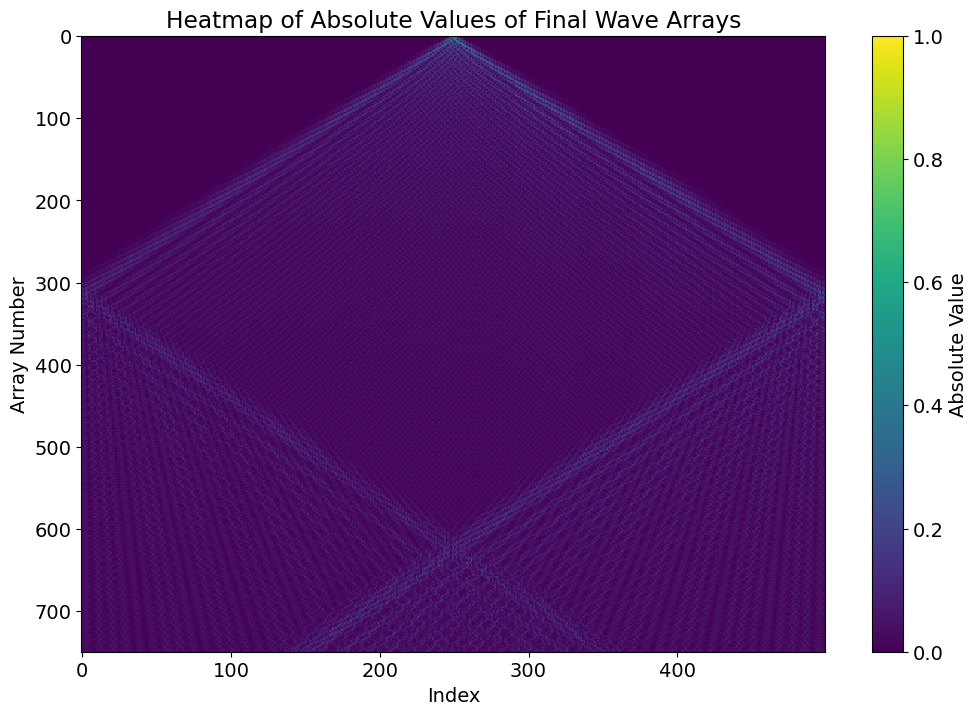

ValueError: operands could not be broadcast together with shapes (750,) (500,) 

In [24]:
directory_path = '/Users/bishalghosh/Desktop/b0/'
final_wave_arrays = {}

for i in range(750):
    file_name = f'final_wave_bulk_87_{i}.npy'
    file_path = os.path.join(directory_path, file_name)
    if os.path.exists(file_path):
        final_wave_arrays[file_name] = np.load(file_path)
        # Create a heatmap of the absolute values of the arrays
import matplotlib.pyplot as plt

        # Prepare the data for the heatmap
heatmap_data = np.array([np.abs(value) for value in final_wave_arrays.values()])

        # Plot the heatmap
plt.figure(figsize=(12, 8))
plt.imshow(heatmap_data, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Absolute Value')
plt.title('Heatmap of Absolute Values of Final Wave Arrays')
plt.xlabel('Index')
plt.ylabel('Array Number')
plt.show()

# Calculate the RMS spread of the initial probability by taking the weight of the site index
site_indices = np.arange(heatmap_data.shape[1])  # Array of site indices
weighted_probabilities = heatmap_data[:, 0] * site_indices  # Weighted probabilities for the initial site
rms_spread = np.sqrt(np.mean(weighted_probabilities**2))  # RMS spread calculation

# Plot the RMS spread of the initial probability
plt.figure(figsize=(12, 8))
plt.plot(np.arange(len(heatmap_data)), weighted_probabilities, label='Weighted Initial Site RMS Spread', color='blue')
plt.title('RMS Spread of the Initial Probability as a Function of Array Number')
plt.xlabel('Array Number')
plt.ylabel('RMS Spread')
plt.legend()
plt.grid(True)
plt.show()directory_path = '/Users/bishalghosh/Desktop/b0/'
final_wave_arrays = {}

for i in range(750):
    file_name = f'final_wave_bulk_87_{i}.npy'
    file_path = os.path.join(directory_path, file_name)
    if os.path.exists(file_path):
        final_wave_arrays[file_name] = np.load(file_path)
        # Create a heatmap of the absolute values of the arrays
import matplotlib.pyplot as plt

        # Prepare the data for the heatmap
heatmap_data = np.array([np.abs(value) for value in final_wave_arrays.values()])

        # Plot the heatmap
plt.figure(figsize=(12, 8))
plt.imshow(heatmap_data, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Absolute Value')
plt.title('Heatmap of Absolute Values of Final Wave Arrays')
plt.xlabel('Index')
plt.ylabel('Array Number')
plt.show()

# Calculate the RMS spread of the initial probability by taking the weight of the site index
site_indices = np.arange(heatmap_data.shape[1])  # Array of site indices
weighted_probabilities = heatmap_data[:, 0] * site_indices  # Weighted probabilities for the initial site
rms_spread = np.sqrt(np.mean(weighted_probabilities**2))  # RMS spread calculation

# Plot the RMS spread of the initial probability
plt.figure(figsize=(12, 8))
plt.plot(np.arange(len(heatmap_data)), weighted_probabilities, label='Weighted Initial Site RMS Spread', color='blue')
plt.title('RMS Spread of the Initial Probability as a Function of Array Number')
plt.xlabel('Array Number')
plt.ylabel('RMS Spread')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import os
import numpy as np

plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 14})

# Iterate through the indices and plot the arrays
for i in range(750):
    key = f'final_wave_bulk_87_{i}.npy'
    if key in final_wave_arrays:
        plt.plot(np.abs(final_wave_arrays[key]), label=f'|{key}|')

plt.title('Absolute Values of Arrays from 87_0 to 87_749')
plt.xlabel('Index')
plt.ylabel('Absolute Value')
plt.legend(loc='upper right', fontsize='small', ncol=2)
plt.grid(True)
plt.show()
# Load the arrays from the b0 folder

directory_path = '/Users/bishalghosh/Desktop/b0/'
final_wave_arrays = {}

for i in range(750):
    file_name = f'final_wave_bulk_87_{i}.npy'
    file_path = os.path.join(directory_path, file_name)
    if os.path.exists(file_path):
        final_wave_arrays[file_name] = np.load(file_path)
        # Plot all the final_wave_arrays

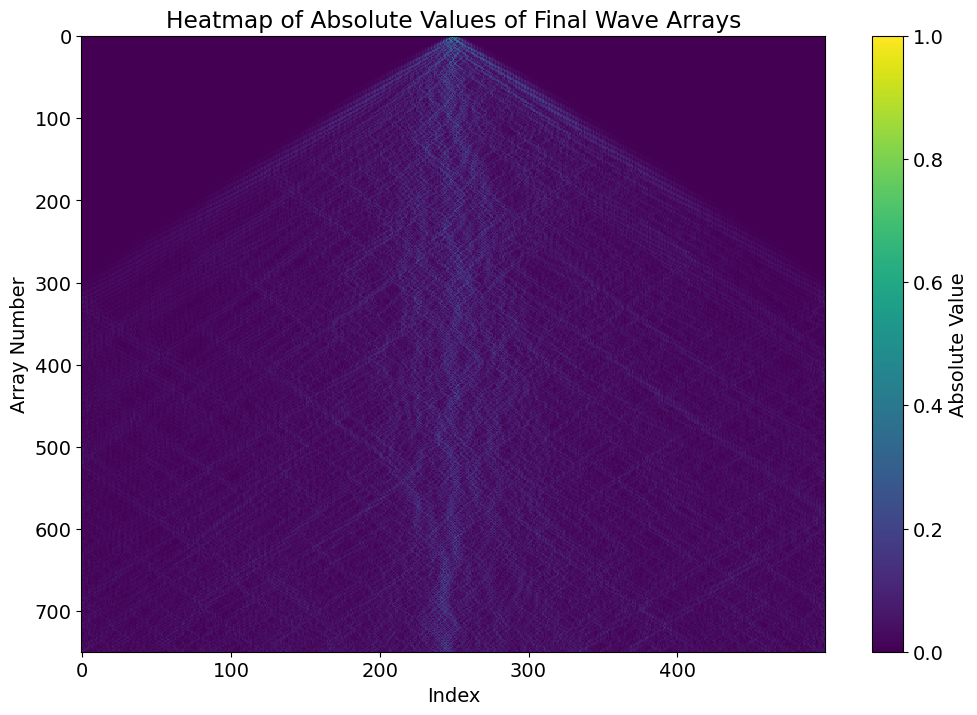

In [20]:
directory_path = '/Users/bishalghosh/Desktop/b0/'
final_wave_arrays = {}

for i in range(750):
    file_name = f'final_wave_bulknoise_87_{i}.npy'
    file_path = os.path.join(directory_path, file_name)
    if os.path.exists(file_path):
        final_wave_arrays[file_name] = np.load(file_path)
        # Create a heatmap of the absolute values of the arrays
import matplotlib.pyplot as plt

        # Prepare the data for the heatmap
heatmap_data = np.array([np.abs(value) for value in final_wave_arrays.values()])

        # Plot the heatmap
plt.figure(figsize=(12, 8))
plt.imshow(heatmap_data, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Absolute Value')
plt.title('Heatmap of Absolute Values of Final Wave Arrays')
plt.xlabel('Index')
plt.ylabel('Array Number')
plt.show()

In [27]:
import numpy as np

def compute_rms_spread(prob_density, positions=None):
    """
    Compute the root mean squared (RMS) spread of a probability density.

    Parameters:
    - prob_density (np.ndarray): Array of probabilities at each site. Should sum to 1.
    - positions (np.ndarray, optional): Array of position values. Defaults to array indices.

    Returns:
    - float: Root mean squared spread.
    """
    prob_density = np.asarray(prob_density)
    assert np.isclose(np.sum(prob_density), 1.0), "Probabilities must sum to 1."

    if positions is None:
        positions = np.arange(len(prob_density))

    # Compute the expectation value of position
    mean_pos = np.sum(positions * prob_density)

    # Compute the expectation value of position squared
    mean_pos_sq = np.sum((positions**2) * prob_density)

    # RMS spread (standard deviation)
    rms_spread = np.sqrt(mean_pos_sq - mean_pos**2)

    return rms_spread

#
prob_density = np.array([0.1, 0.2, 0.4, 0.2, 0.1])  # Sample distribution over 5 sites
rms = compute_rms_spread(prob_density)
print(f"RMS spread: {rms:.4f}")
# Compute the RMS spread for the final_array
if 'final_wave_arrays' in locals() and 'final_array' in final_wave_arrays:
    final_array = np.abs(final_wave_arrays['final_wave_bulk_87_0.npy'])
    normalized_final_array = final_array / np.sum(final_array)  # Normalize the array
    rms_final_array = compute_rms_spread(normalized_final_array)
    print (normalized_final_array)
    print(f"RMS spread of the final_array: {rms_final_array:.4f}")
else:
    print("final_wave_arrays or final_array is not defined.")


RMS spread: 1.0954
final_wave_arrays or final_array is not defined.


In [ ]:
directory_path = '/Users/bishalghosh/Desktop/b0/'
final_wave_arrays = {}

for i in range(750):
    file_name = f'final_wave_bulknoise_87_{i}.npy'
    file_path = os.path.join(directory_path, file_name)
    if os.path.exists(file_path):
        final_wave_arrays[file_name] = np.load(file_path)
    print(final_wave_arrays[file_name])